# Generative Models as Data Augmentation in the Medical Domain

## 1. Overview

This project tries to evaluate the quality of generative models for data augmentation in the medical domain. 

Data augmentation will be relying on geometric data augmentation, (variational) auto-encoder (e.g. stacked denoising, denoising auto-encoder, etc.), and generative adversarial neural networks (e.g. GAN, DCGAN, Wasserstein GAN, etc.) for instance.

We will restrict ourself to three kind of models to generate new data and evaluate the (possible) improvement with regards to a final classification score (i.e. comparing results between augmented and non-augmented training sets). 

### Datasets

We will look into applying the above project on some (if not all) of the following datasets from the MedMNIST Classification Decathlon (https://medmnist.github.io/):

| Dataset | Classification Type | Train size | Validation size | Test size |
| :--- | :--- | :---: | :---: | :---: |  
| PathMNIST Pathology | Multi-Class (9) | 89,996 | 10,004 | 7,180 |
| DermaMNIST Dermatoscope | Multi-Class (7) | 7,007 | 1,003 | 2,005 |
| OctMNIST | Multi-Class (4) | 97,477 | 10,832 | 1,000 |
| PneumoniaMNIST Chest X-ray | Binary-Class (2) |4,708 | 524 | 624 |
| BreastMNIST Breast Ultrasound | Binary-Class (2) | 546 | 78 | 156 |
| OrganMNIST_Axial Abdominal CT | Multi-Class (11) | 34,581 | 6,491 | 17,778 |
| OragnMNIST_Coronal Abdominal CT | Multi-Class (11) |13,000 | 2,392 | 8,268 |
| OrganMNIST_Sagittal Abdominal CT | Multi-Class (11) | 13,940 | 2,452 | 8,829 |

### Notes

We will also provide a short report (in copy) explaining the choice of VAE, AE, and/or GAN models, outlining differences between datasets' results. We will also try to interprete and justify possible differences with regards to models, data specifications, visual features, and bibliography references used to support the choices made.

## 2. Data and Library Imports

### Source

We will retrieve the above dataset from the following website:

> [MedMNIST v2: A Large-Scale Lightweight Benchmark for 2D and 3D Biomedical Image Classification](https://medmnist.com/), Jiancheng Yang,Rui Shi,Donglai Wei,Zequan Liu,Lin Zhao,Bilian Ke,Hanspeter Pfister,Bingbing Ni

By following the instructions on their [github](https://github.com/MedMNIST/MedMNIST), we can download their ready-made module with the following instruction:

```sh
pip install jupyter, ipywidgets, IProgress
pip install medmnist
```

And load it in a python or ipython instance:

```python
import medmnist
```

### Library Imports

In [3]:
from python_scripts.classifier import run_classifier_pipeline
from python_scripts.variational_autoencoders import run_encoder_pipeline, one_hot
from python_scripts.generative_adversarial_networks import run_GAN_pipeline
from python_scripts.data import retrieve_flag_info, import_dataset
from python_scripts.data import check_cuda_availability
from python_scripts.data import generate_augmented_dataset_condVAE
from python_scripts.data import generate_augmented_dataset_jointVAE
from python_scripts.data import generate_augmented_dataset_condGAN

import warnings
warnings.filterwarnings('ignore')

### Checks CUDA availability

In [4]:
check_cuda_availability()

True,0,<torch.cuda.device object at 0x7fb3bd5a47c0>,1
NVIDIA GeForce GTX 980 Ti


### Data Imports

We import the datasets in four manners:

| import # | with WSR | with Geometric DA | Application | Other transformation | 
| --- | --- | --- | --- | --- |
| 1 | No | No | To test the baseline classifier |  No | 
| 2 | Yes | No | To test the baseline classifier and train the VAE |  No | 
| 3 | Yes | No | To train the GAN |  Iimage upscale to 32x32* | 
| 4 | Yes | Yes | To test the baseline classifier |  No | 

\* Images are upscaled to 32 pixels by 32 pixels in size in order to work with TorchFusion's implementation of a GAN.


In [5]:
data_flags = ["pathmnist", "dermamnist", "octmnist", "pneumoniamnist", 
              "breastmnist", "organamnist", "organcmnist", "organsmnist"]

info_flags = {flag:retrieve_flag_info(flag) for flag in data_flags}

Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Montage of randomly extracted images from the dataset:


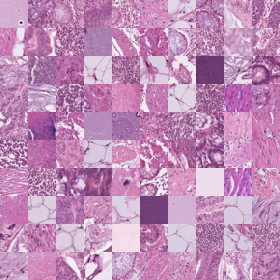

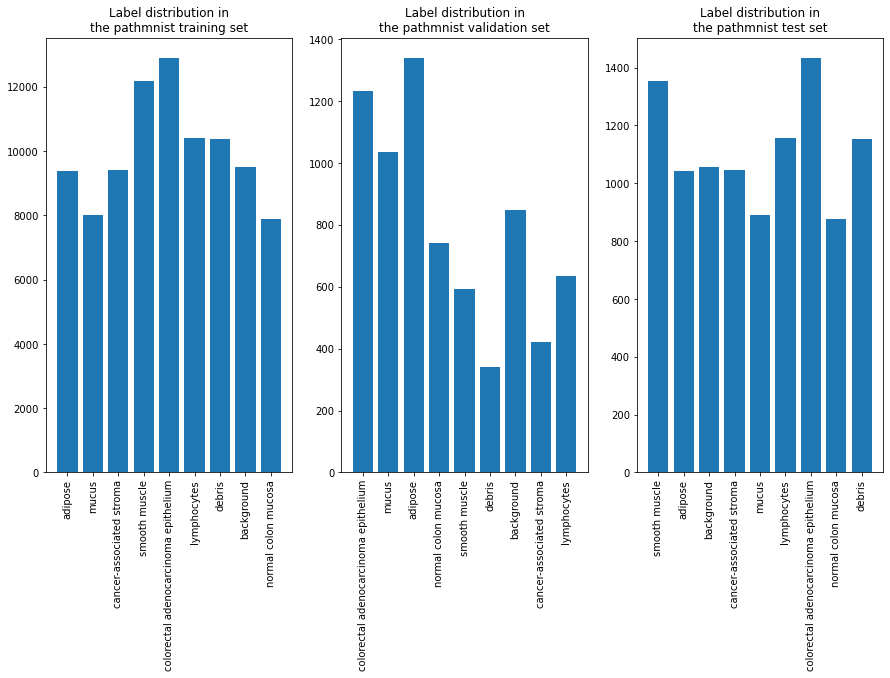

Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz


In [6]:
pathmnist_noWRS_noGDA = import_dataset(
    "pathmnist", info_flags, print_visualization=True
)
pathmnist_noGDA = import_dataset(
    "pathmnist", info_flags, sampler=True
)
pathmnist_noGDA_upscaled = import_dataset(
    "pathmnist", info_flags, sampler=True, upscale=True
)
pathmnist_WSR_GDA = import_dataset(
    "pathmnist", info_flags, sampler=True, geometric_augment=3
)

Using downloaded and verified file: /home/quentin/.medmnist/dermamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/dermamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/dermamnist.npz
Montage of randomly extracted images from the dataset:


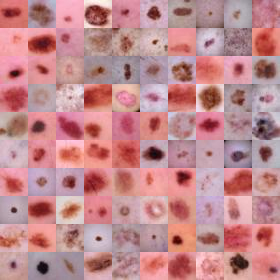

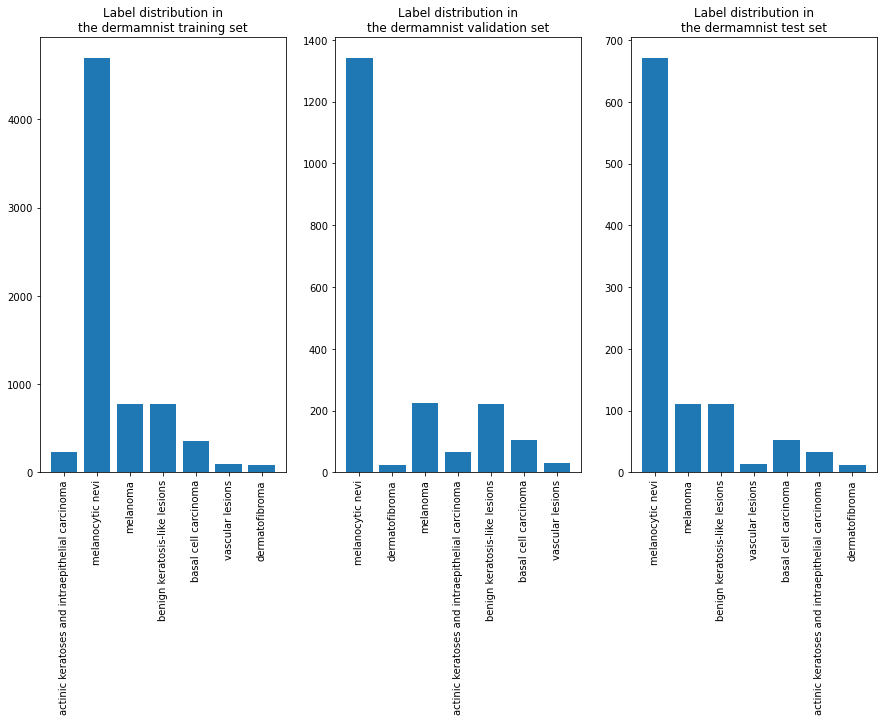

In [5]:
dermamnist_noWRS_noGDA = import_dataset(
    "dermamnist", info_flags, print_visualization=True
)
dermamnist_noGDA = import_dataset(
    "dermamnist", info_flags, sampler=True
)
dermamnist_noGDA_upscaled = import_dataset(
    "dermamnist", info_flags, sampler=True, upscale=True
)
dermamnist_WSR_GDA = import_dataset(
    "dermamnist", info_flags, sampler=True, geometric_augment=3
)

Using downloaded and verified file: /home/quentin/.medmnist/octmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/octmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/octmnist.npz
Montage of randomly extracted images from the dataset:


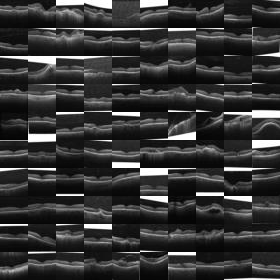

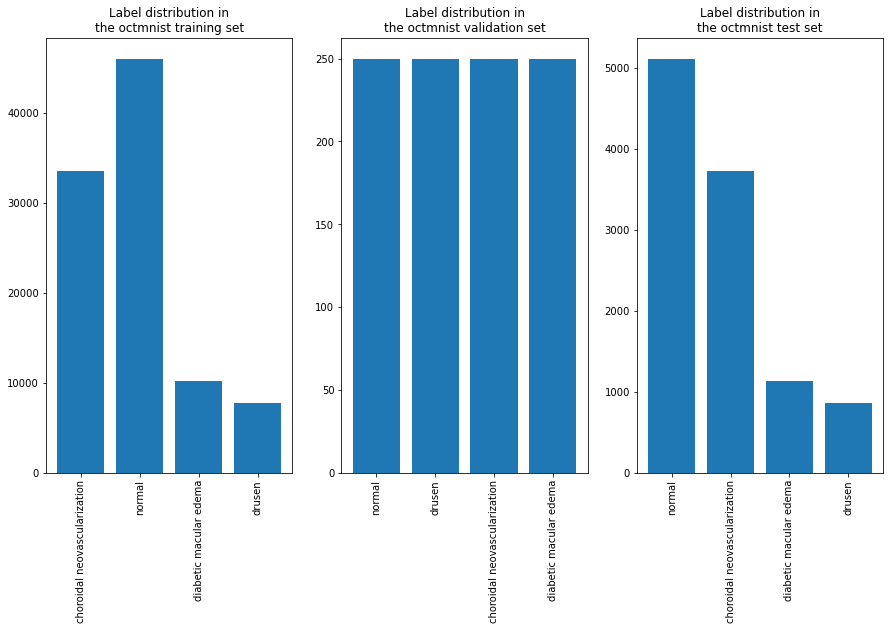

In [6]:
octmnist_noWRS_noGDA = import_dataset(
    "octmnist", info_flags, print_visualization=True
)
octmnist_noGDA = import_dataset(
    "octmnist", info_flags, sampler=True
)
octmnist_noGDA_upscaled = import_dataset(
    "octmnist", info_flags, sampler=True, upscale=True
)
octmnist_WSR_GDA = import_dataset(
    "octmnist", info_flags, sampler=True, geometric_augment=2
)

Using downloaded and verified file: /home/quentin/.medmnist/pneumoniamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pneumoniamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pneumoniamnist.npz
Montage of randomly extracted images from the dataset:


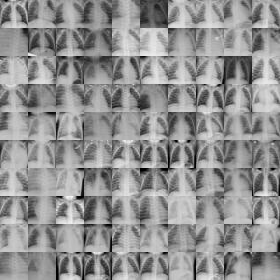

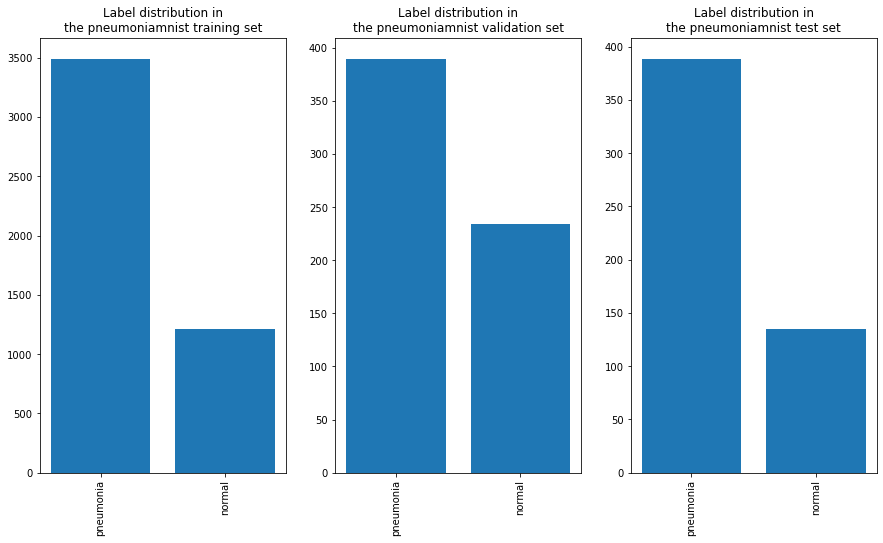

In [7]:
pneumoniamnist_noWRS_noGDA = import_dataset(
    "pneumoniamnist", info_flags, print_visualization=True
)
pneumoniamnist_noGDA = import_dataset(
    "pneumoniamnist", info_flags, sampler=True
)
pneumoniamnist_noGDA_upscaled = import_dataset(
    "pneumoniamnist", info_flags, sampler=True, upscale=True
)
pneumoniamnist_WSR_GDA = import_dataset(
    "pneumoniamnist", info_flags, sampler=True, geometric_augment=2
)

Using downloaded and verified file: /home/quentin/.medmnist/breastmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/breastmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/breastmnist.npz
Montage of randomly extracted images from the dataset:


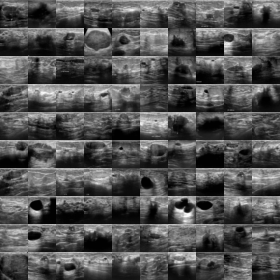

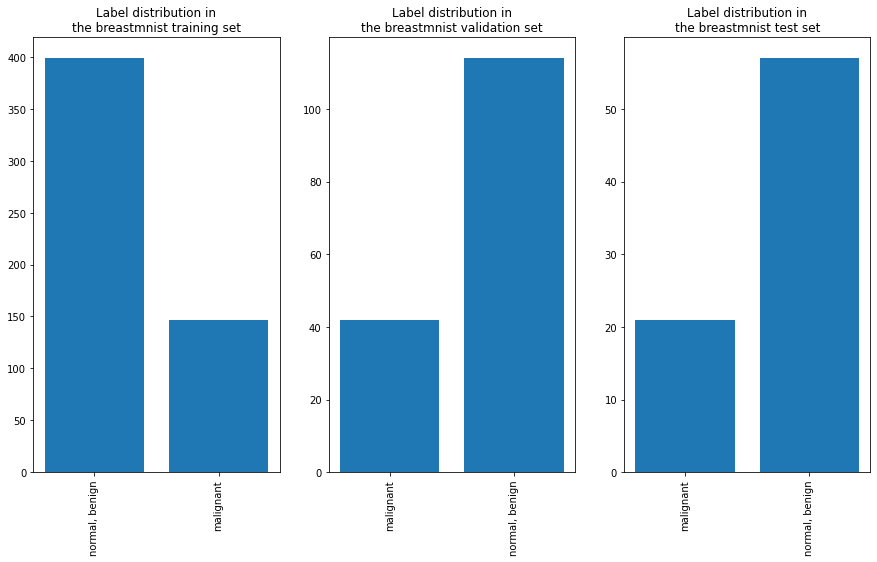

In [8]:
breastmnist_noWRS_noGDA = import_dataset(
    "breastmnist", info_flags, print_visualization=True
)
breastmnist_noGDA = import_dataset(
    "breastmnist", info_flags, sampler=True
)
breastmnist_noGDA_upscaled = import_dataset(
    "breastmnist", info_flags, sampler=True, upscale=True
)
breastmnist_WSR_GDA = import_dataset(
    "breastmnist", info_flags, sampler=True, geometric_augment=1
)

Using downloaded and verified file: /home/quentin/.medmnist/organamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organamnist.npz
Montage of randomly extracted images from the dataset:


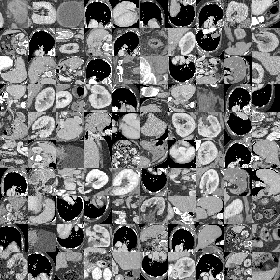

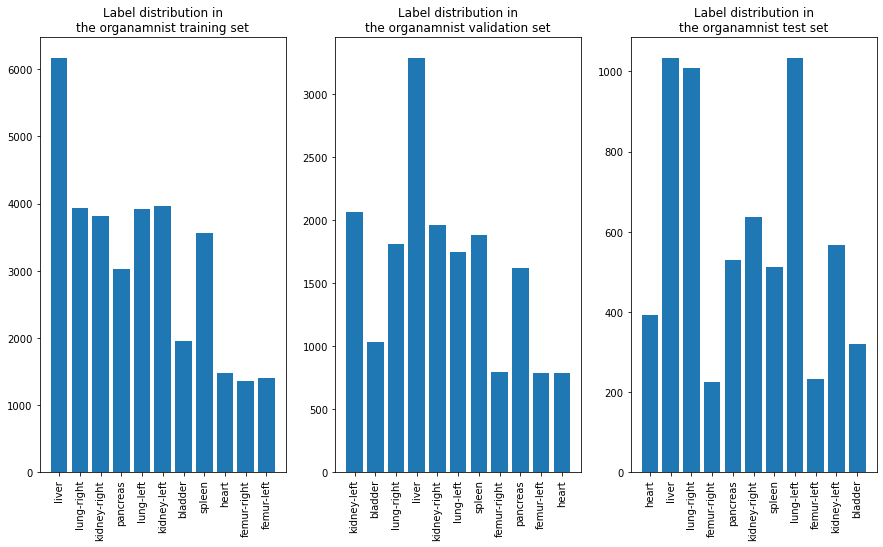

In [9]:
organamnist_noWRS_noGDA = import_dataset(
    "organamnist", info_flags, print_visualization=True
)
organamnist_noGDA = import_dataset(
    "organamnist", info_flags, sampler=True
)
organamnist_noGDA_upscaled = import_dataset(
    "organamnist", info_flags, sampler=True, upscale=True
)
organamnist_WSR_GDA = import_dataset(
    "organamnist", info_flags, sampler=True, geometric_augment=1
)

Using downloaded and verified file: /home/quentin/.medmnist/organcmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organcmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organcmnist.npz
Montage of randomly extracted images from the dataset:


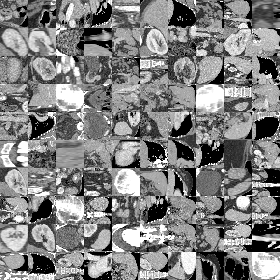

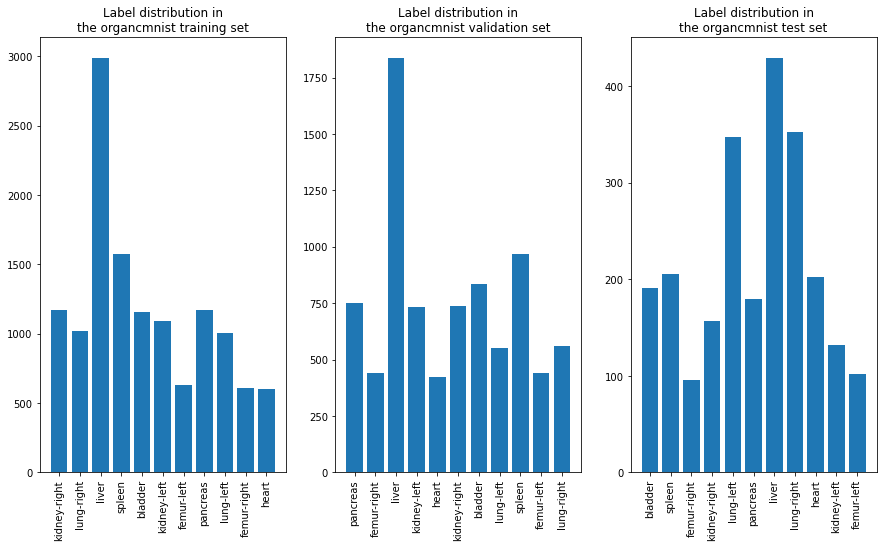

In [10]:
organcmnist_noWRS_noGDA = import_dataset(
    "organcmnist", info_flags, print_visualization=True
)
organcmnist_noGDA = import_dataset(
    "organcmnist", info_flags, sampler=True
)
organcmnist_noGDA_upscaled = import_dataset(
    "organcmnist", info_flags, sampler=True, upscale=True
)
organcmnist_WSR_GDA = import_dataset(
    "organcmnist", info_flags, sampler=True, geometric_augment=1
)

Using downloaded and verified file: /home/quentin/.medmnist/organsmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organsmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organsmnist.npz
Montage of randomly extracted images from the dataset:


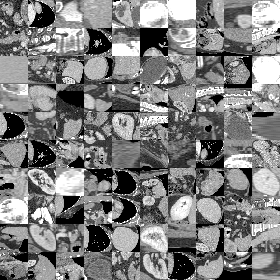

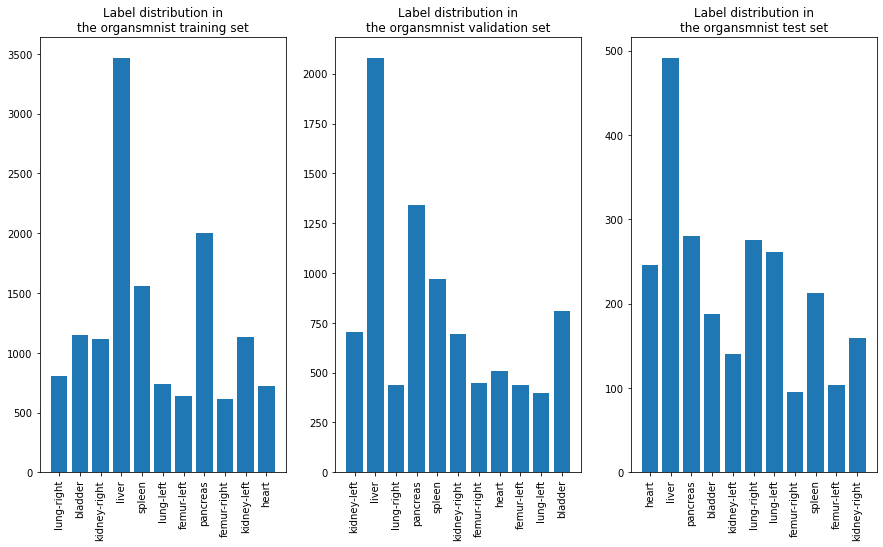

In [11]:
organsmnist_noWRS_noGDA = import_dataset(
    "organsmnist", info_flags, print_visualization=True
)
organsmnist_noGDA = import_dataset(
    "organsmnist", info_flags, sampler=True
)
organsmnist_noGDA_upscaled = import_dataset(
    "organsmnist", info_flags, sampler=True, upscale=True
)
organsmnist_WSR_GDA = import_dataset(
    "organsmnist", info_flags, sampler=True, geometric_augment=1
)

## 3. Training a Classifier without Geometric Data Augmentation and without Weighted Random Sampling

### PathMNIST

{
  "python_class": "PathMNIST",
  "description": "The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3\u00d7224\u00d7224 into 3\u00d728\u00d728, and split NCT-CRC-HE-100K into training and validation set with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/pathmnist.npz?download=1",
  "MD5": "a8b06965200029087d5bd730944a56c1",
  "task": "multi-class",
  "label": {
    "0": "adipose",
    "1": "background",
    "2": "debris",
    "3": "lymphocytes",
    "4": "mucus",
    "5": "smooth muscle",
    "6": "normal colon mucosa"

100%|█████████████████████████████████████████| 704/704 [00:21<00:00, 33.27it/s]


train -- accuracy: 0.72
val -- accuracy: 0.95,  AUC: 0.65
Epoch 1



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.08it/s]


train -- accuracy: 0.86
val -- accuracy: 0.95,  AUC: 0.67
Epoch 2



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.31it/s]


train -- accuracy: 0.89
val -- accuracy: 0.99,  AUC: 0.88
Epoch 3



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.42it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.91
Epoch 4



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.44it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.93
Epoch 5



100%|█████████████████████████████████████████| 704/704 [00:21<00:00, 33.00it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.93
Epoch 6



100%|█████████████████████████████████████████| 704/704 [00:21<00:00, 33.39it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.94
Epoch 7



100%|█████████████████████████████████████████| 704/704 [00:21<00:00, 33.41it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.92
Epoch 8



100%|█████████████████████████████████████████| 704/704 [00:21<00:00, 33.25it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
Epoch 9



100%|█████████████████████████████████████████| 704/704 [00:21<00:00, 33.27it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.91
test -- accuracy: 0.95,  AUC: 0.66


<Figure size 720x720 with 0 Axes>

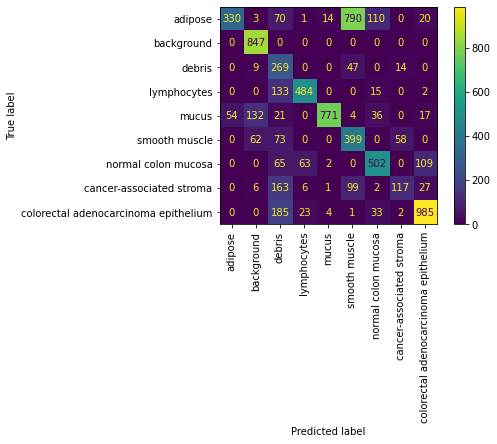

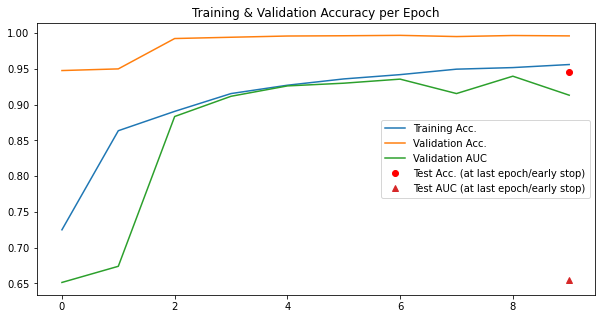

In [112]:
clf_base_pathmnist_noWRS_noGDA = run_classifier_pipeline("pathmnist", info_flags, pathmnist_noWRS_noGDA)

### DermaMNIST

{
  "python_class": "DermaMNIST",
  "description": "The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3\u00d7600\u00d7450 are resized into 3\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/dermamnist.npz?download=1",
  "MD5": "0744692d530f8e62ec473284d019b0c7",
  "task": "multi-class",
  "label": {
    "0": "actinic keratoses and intraepithelial carcinoma",
    "1": "basal cell carcinoma",
    "2": "benign keratosis-like lesions",
    "3": "dermatofibroma",
    "4": "melanoma",
    "5": "melanocytic nevi",
    "6": "vascular lesions"
  },
  "n_channels": 3,
  "n_samples": {
    "train": 7007,
    "val": 1003,
    "test": 2005
  },
  "license": "CC B

100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.17it/s]


train -- accuracy: 0.35
val -- accuracy: 0.86,  AUC: 0.49
Epoch 1



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.07it/s]


train -- accuracy: 0.51
val -- accuracy: 0.83,  AUC: 0.34
Epoch 2



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 33.61it/s]


train -- accuracy: 0.6
val -- accuracy: 0.9,  AUC: 0.69
Epoch 3



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.02it/s]


train -- accuracy: 0.69
val -- accuracy: 0.91,  AUC: 0.53
Epoch 4



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.52it/s]


train -- accuracy: 0.74
val -- accuracy: 0.88,  AUC: 0.54
Epoch 5



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.67it/s]


train -- accuracy: 0.81
val -- accuracy: 0.88,  AUC: 0.6
Epoch 6



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.67it/s]


train -- accuracy: 0.86
val -- accuracy: 0.9,  AUC: 0.64
Epoch 7



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 33.70it/s]


train -- accuracy: 0.89
val -- accuracy: 0.9,  AUC: 0.63
Epoch 8



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 33.54it/s]


train -- accuracy: 0.89
val -- accuracy: 0.88,  AUC: 0.61
Epoch 9



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 33.59it/s]


train -- accuracy: 0.9
val -- accuracy: 0.89,  AUC: 0.66
test -- accuracy: 0.88,  AUC: 0.67


<Figure size 720x720 with 0 Axes>

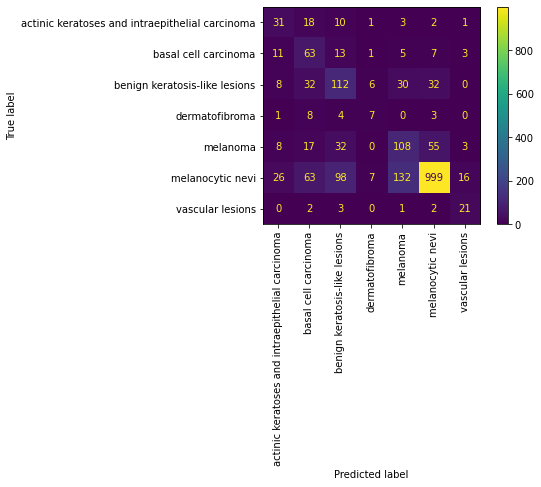

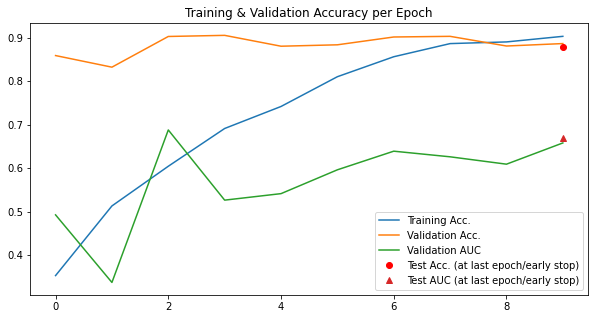

In [113]:
clf_base_dermamnist_noWRS_noGDA = run_classifier_pipeline("dermamnist", info_flags, dermamnist_noWRS_noGDA)

### OctMNIST

{
  "python_class": "OCTMNIST",
  "description": "The OCTMNIST is based on a prior dataset of 109,309 valid optical coherence tomography (OCT) images for retinal diseases. The dataset is comprised of 4 diagnosis categories, leading to a multi-class classification task. We split the source training set with a ratio of 9:1 into training and validation set, and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22121,536)\u00d7(277\u2212512). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/octmnist.npz?download=1",
  "MD5": "c68d92d5b585d8d81f7112f81e2d0842",
  "task": "multi-class",
  "label": {
    "0": "choroidal neovascularization",
    "1": "diabetic macular edema",
    "2": "drusen",
    "3": "normal"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 97477,
    "val": 10832,
    "test": 1000
  },
  "license": "CC BY 4.0"
}
--------------------------------

100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 37.04it/s]


train -- accuracy: 0.72
val -- accuracy: 0.94,  AUC: 0.84
Epoch 1



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 36.95it/s]


train -- accuracy: 0.83
val -- accuracy: 0.95,  AUC: 0.86
Epoch 2



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 37.51it/s]


train -- accuracy: 0.86
val -- accuracy: 0.96,  AUC: 0.86
Epoch 3



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 37.64it/s]


train -- accuracy: 0.88
val -- accuracy: 0.97,  AUC: 0.81
Epoch 4



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 36.81it/s]


train -- accuracy: 0.9
val -- accuracy: 0.97,  AUC: 0.87
Epoch 5



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 37.50it/s]


train -- accuracy: 0.91
val -- accuracy: 0.97,  AUC: 0.89
Epoch 6



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 36.72it/s]


train -- accuracy: 0.92
val -- accuracy: 0.97,  AUC: 0.83
Epoch 7



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 37.91it/s]


train -- accuracy: 0.93
val -- accuracy: 0.97,  AUC: 0.9
Epoch 8



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.59it/s]


train -- accuracy: 0.94
val -- accuracy: 0.96,  AUC: 0.89
Epoch 9



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.46it/s]


train -- accuracy: 0.95
val -- accuracy: 0.97,  AUC: 0.84
test -- accuracy: 0.93,  AUC: 0.74


<Figure size 720x720 with 0 Axes>

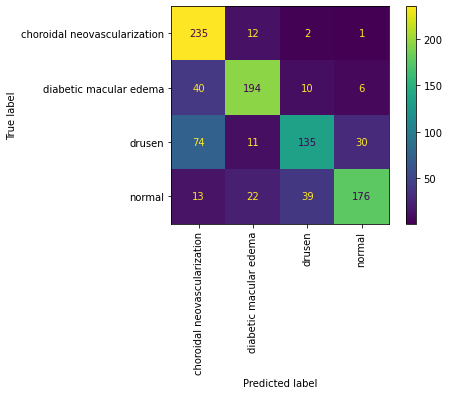

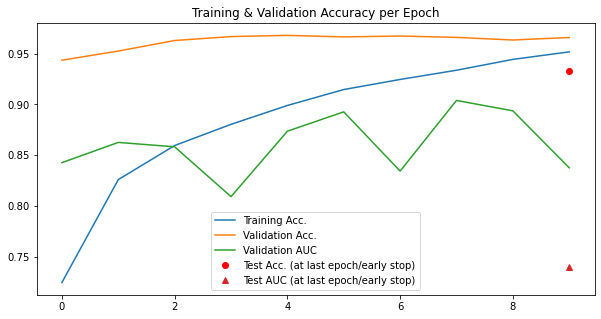

In [114]:
clf_base_octmnist_noWRS_noGDA = run_classifier_pipeline("octmnist", info_flags, octmnist_noWRS_noGDA)

### PneumoniaMNIST

{
  "python_class": "PneumoniaMNIST",
  "description": "The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22122,916)\u00d7(127\u22122,713). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/pneumoniamnist.npz?download=1",
  "MD5": "28209eda62fecd6e6a2d98b1501bb15f",
  "task": "binary-class",
  "label": {
    "0": "normal",
    "1": "pneumonia"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 4708,
    "val": 524,
    "test": 624
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           

100%|███████████████████████████████████████████| 37/37 [00:01<00:00, 35.08it/s]


train -- accuracy: 0.85
val -- accuracy: 0.95,  AUC: 0.78
Epoch 1



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.51it/s]


train -- accuracy: 0.95
val -- accuracy: 0.99,  AUC: 0.96
Epoch 2



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.27it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.97
Epoch 3



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 38.17it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.97
Epoch 4



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.97it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.98
Epoch 5



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.99it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.98
Epoch 6



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.26it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 7



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 38.11it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 8



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 38.28it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.97
Epoch 9



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 38.20it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.98
test -- accuracy: 0.97,  AUC: 0.89


<Figure size 720x720 with 0 Axes>

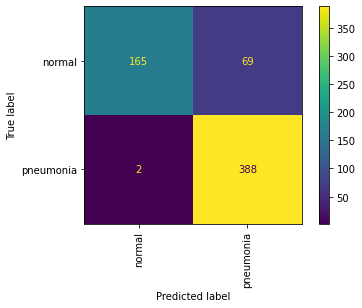

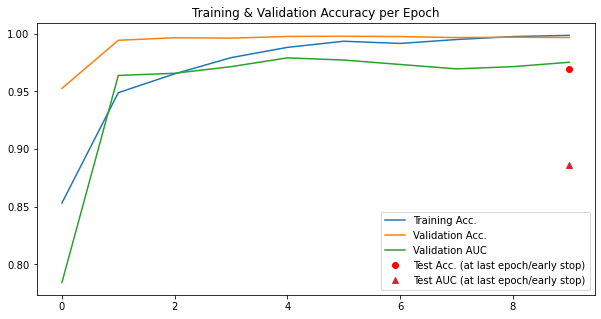

In [115]:
clf_base_pneumoniamnist_noWRS_noGDA = run_classifier_pipeline("pneumoniamnist", info_flags, pneumoniamnist_noWRS_noGDA)

### BreastMNIST

{
  "python_class": "BreastMNIST",
  "description": "The BreastMNIST is based on a dataset of 780 breast ultrasound images. It is categorized into 3 classes: normal, benign, and malignant. As we use low-resolution images, we simplify the task into binary classification by combining normal and benign as positive and classifying them against malignant as negative. We split the source dataset with a ratio of 7:1:2 into training, validation and test set. The source images of 1\u00d7500\u00d7500 are resized into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/breastmnist.npz?download=1",
  "MD5": "750601b1f35ba3300ea97c75c52ff8f6",
  "task": "binary-class",
  "label": {
    "0": "malignant",
    "1": "normal, benign"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 546,
    "val": 78,
    "test": 156
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
    

100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 33.35it/s]


train -- accuracy: 0.55
val -- accuracy: 0.53,  AUC: 0.73
Epoch 1



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.29it/s]


train -- accuracy: 0.64
val -- accuracy: 0.66,  AUC: 0.68
Epoch 2



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 42.18it/s]


train -- accuracy: 0.74
val -- accuracy: 0.69,  AUC: 0.27
Epoch 3



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.60it/s]


train -- accuracy: 0.76
val -- accuracy: 0.72,  AUC: 0.29
Epoch 4



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.62it/s]


train -- accuracy: 0.77
val -- accuracy: 0.76,  AUC: 0.32
Epoch 5



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.23it/s]


train -- accuracy: 0.82
val -- accuracy: 0.78,  AUC: 0.41
Epoch 6



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 42.37it/s]


train -- accuracy: 0.79
val -- accuracy: 0.82,  AUC: 0.56
Epoch 7



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 42.62it/s]


train -- accuracy: 0.89
val -- accuracy: 0.81,  AUC: 0.54
Epoch 8



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 42.00it/s]


train -- accuracy: 0.88
val -- accuracy: 0.87,  AUC: 0.32
Epoch 9



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.79it/s]


train -- accuracy: 0.88
val -- accuracy: 0.86,  AUC: 0.67
test -- accuracy: 0.82,  AUC: 0.67


<Figure size 720x720 with 0 Axes>

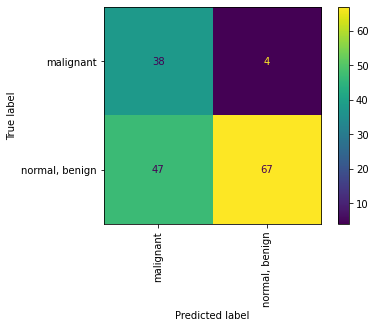

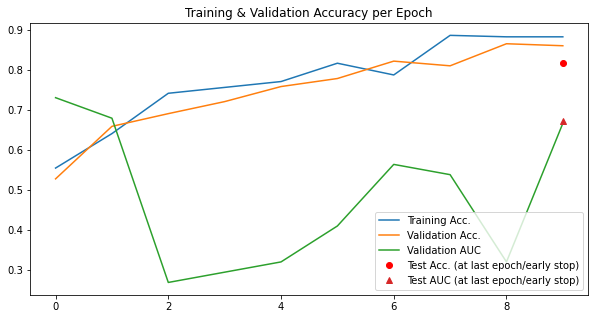

In [116]:
clf_base_breastmnist_noWRS_noGDA = run_classifier_pipeline("breastmnist", info_flags, breastmnist_noWRS_noGDA)

### OrganAMNIST

{
  "python_class": "OrganAMNIST",
  "description": "The OrganAMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Axial (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in axial views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organamnist.npz?download=1",
  "MD5": "866b832ed4eeba67bfb9edee1d5544e6",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-left",

100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 38.26it/s]


train -- accuracy: 0.73
val -- accuracy: 1.0,  AUC: 0.95
Epoch 1



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.66it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.96
Epoch 2



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.86it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.96
Epoch 3



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.59it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.97
Epoch 4



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 36.89it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.96
Epoch 5



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.18it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 6



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.06it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 7



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.85it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 8



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 37.49it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 9



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 38.20it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.97
test -- accuracy: 0.99,  AUC: 0.89


<Figure size 720x720 with 0 Axes>

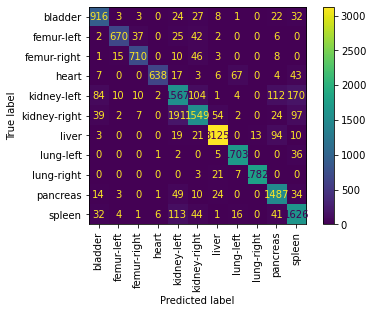

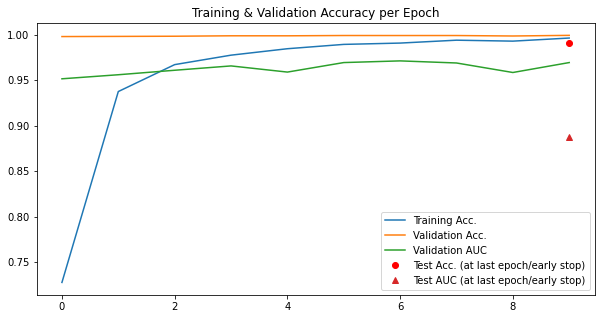

In [117]:
clf_base_organamnist_noWRS_noGDA = run_classifier_pipeline("organamnist", info_flags, organamnist_noWRS_noGDA)

### OrganCMNIST

{
  "python_class": "OrganCMNIST",
  "description": "The OrganCMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Coronal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in coronal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organcmnist.npz?download=1",
  "MD5": "0afa5834fb105f7705a7d93372119a21",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-le

100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 36.67it/s]


train -- accuracy: 0.47
val -- accuracy: 0.99,  AUC: 0.82
Epoch 1



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.07it/s]


train -- accuracy: 0.8
val -- accuracy: 1.0,  AUC: 0.92
Epoch 2



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.20it/s]


train -- accuracy: 0.88
val -- accuracy: 1.0,  AUC: 0.94
Epoch 3



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.18it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.91
Epoch 4



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.25it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.93
Epoch 5



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.42it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
Epoch 6



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 36.53it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.95
Epoch 7



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.56it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.94
Epoch 8



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.54it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.94
Epoch 9



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 37.47it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.95
test -- accuracy: 0.99,  AUC: 0.86


<Figure size 720x720 with 0 Axes>

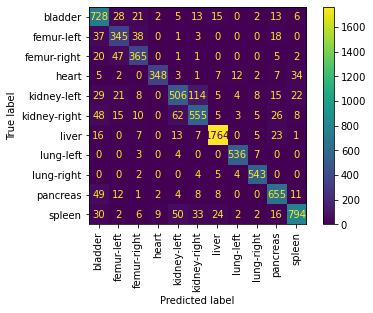

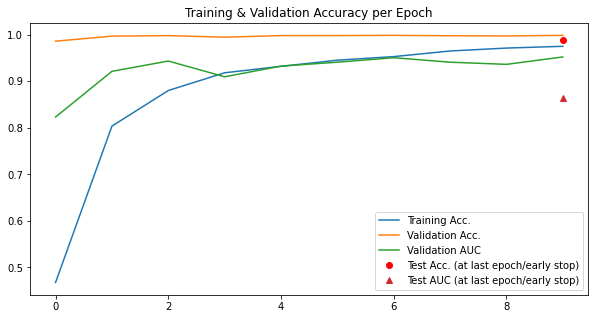

In [118]:
clf_base_organcmnist_noWRS_noGDA = run_classifier_pipeline("organcmnist", info_flags, organcmnist_noWRS_noGDA)

### OrganSMNIST

{
  "python_class": "OrganSMNIST",
  "description": "The OrganSMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Sagittal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in sagittal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organsmnist.npz?download=1",
  "MD5": "e5c39f1af030238290b9557d9503af9d",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-

100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 36.53it/s]


train -- accuracy: 0.37
val -- accuracy: 0.96,  AUC: 0.61
Epoch 1



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.50it/s]


train -- accuracy: 0.64
val -- accuracy: 0.98,  AUC: 0.77
Epoch 2



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.04it/s]


train -- accuracy: 0.73
val -- accuracy: 0.99,  AUC: 0.79
Epoch 3



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 37.27it/s]


train -- accuracy: 0.77
val -- accuracy: 0.99,  AUC: 0.78
Epoch 4



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 37.60it/s]


train -- accuracy: 0.81
val -- accuracy: 0.99,  AUC: 0.84
Epoch 5



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 37.55it/s]


train -- accuracy: 0.84
val -- accuracy: 0.99,  AUC: 0.83
Epoch 6



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 37.51it/s]


train -- accuracy: 0.86
val -- accuracy: 0.99,  AUC: 0.84
Epoch 7



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.08it/s]


train -- accuracy: 0.89
val -- accuracy: 0.99,  AUC: 0.83
Epoch 8



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.34it/s]


train -- accuracy: 0.9
val -- accuracy: 0.99,  AUC: 0.84
Epoch 9



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.41it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.81
test -- accuracy: 0.96,  AUC: 0.7


<Figure size 720x720 with 0 Axes>

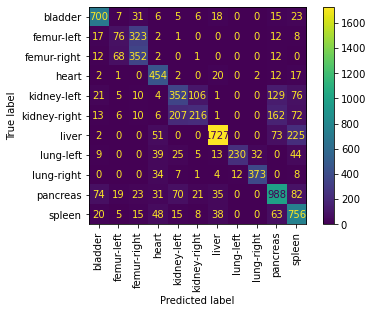

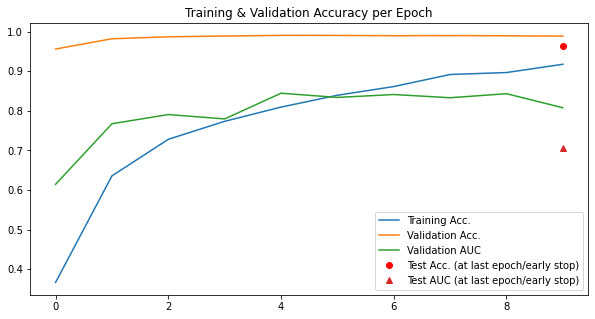

In [119]:
clf_base_organsmnist_noWRS_noGDA = run_classifier_pipeline("organsmnist", info_flags, organsmnist_noWRS_noGDA)

## 3. Training a Classifier with Weighted Random Sampling but without Geometric Data Augmentation

### PathMNIST

{
  "python_class": "PathMNIST",
  "description": "The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3\u00d7224\u00d7224 into 3\u00d728\u00d728, and split NCT-CRC-HE-100K into training and validation set with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/pathmnist.npz?download=1",
  "MD5": "a8b06965200029087d5bd730944a56c1",
  "task": "multi-class",
  "label": {
    "0": "adipose",
    "1": "background",
    "2": "debris",
    "3": "lymphocytes",
    "4": "mucus",
    "5": "smooth muscle",
    "6": "normal colon mucosa"

100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.59it/s]


train -- accuracy: 0.72
val -- accuracy: 0.98,  AUC: 0.76
Epoch 1



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.66it/s]


train -- accuracy: 0.86
val -- accuracy: 0.99,  AUC: 0.87
Epoch 2



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 35.03it/s]


train -- accuracy: 0.9
val -- accuracy: 0.99,  AUC: 0.77
Epoch 3



100%|█████████████████████████████████████████| 704/704 [00:19<00:00, 35.24it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.91
Epoch 4



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 35.13it/s]


train -- accuracy: 0.93
val -- accuracy: 0.99,  AUC: 0.88
Epoch 5



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.96it/s]


train -- accuracy: 0.93
val -- accuracy: 0.97,  AUC: 0.75
Epoch 6



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.88it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.91
Epoch 7



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.77it/s]


train -- accuracy: 0.94
val -- accuracy: 0.99,  AUC: 0.87
Epoch 8



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 34.79it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
Epoch 9



100%|█████████████████████████████████████████| 704/704 [00:20<00:00, 35.19it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
test -- accuracy: 0.97,  AUC: 0.81


<Figure size 720x720 with 0 Axes>

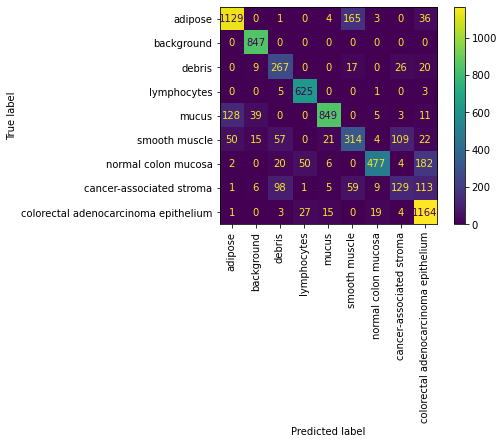

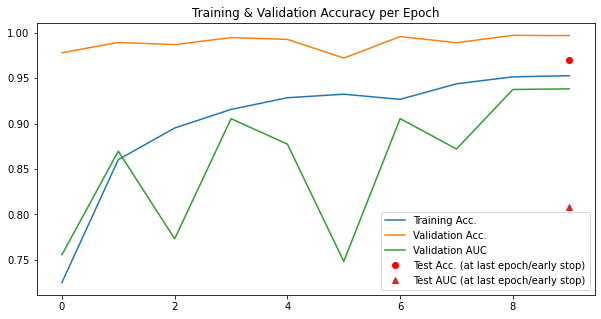

In [12]:
clf_base_pathmnist_noGDA = run_classifier_pipeline("pathmnist", info_flags, pathmnist_noGDA)

### DermaMNIST

{
  "python_class": "DermaMNIST",
  "description": "The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3\u00d7600\u00d7450 are resized into 3\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/dermamnist.npz?download=1",
  "MD5": "0744692d530f8e62ec473284d019b0c7",
  "task": "multi-class",
  "label": {
    "0": "actinic keratoses and intraepithelial carcinoma",
    "1": "basal cell carcinoma",
    "2": "benign keratosis-like lesions",
    "3": "dermatofibroma",
    "4": "melanoma",
    "5": "melanocytic nevi",
    "6": "vascular lesions"
  },
  "n_channels": 3,
  "n_samples": {
    "train": 7007,
    "val": 1003,
    "test": 2005
  },
  "license": "CC B

100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 35.73it/s]


train -- accuracy: 0.34
val -- accuracy: 0.81,  AUC: 0.44
Epoch 1



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 36.08it/s]


train -- accuracy: 0.51
val -- accuracy: 0.89,  AUC: 0.62
Epoch 2



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 35.94it/s]


train -- accuracy: 0.61
val -- accuracy: 0.86,  AUC: 0.59
Epoch 3



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.80it/s]


train -- accuracy: 0.71
val -- accuracy: 0.88,  AUC: 0.55
Epoch 4



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 35.94it/s]


train -- accuracy: 0.78
val -- accuracy: 0.89,  AUC: 0.55
Epoch 5



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 35.44it/s]


train -- accuracy: 0.82
val -- accuracy: 0.87,  AUC: 0.55
Epoch 6



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 35.42it/s]


train -- accuracy: 0.85
val -- accuracy: 0.88,  AUC: 0.56
Epoch 7



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.83it/s]


train -- accuracy: 0.88
val -- accuracy: 0.86,  AUC: 0.49
Epoch 8



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 35.13it/s]


train -- accuracy: 0.9
val -- accuracy: 0.89,  AUC: 0.7
Epoch 9



100%|███████████████████████████████████████████| 55/55 [00:01<00:00, 34.81it/s]


train -- accuracy: 0.91
val -- accuracy: 0.87,  AUC: 0.68
test -- accuracy: 0.88,  AUC: 0.69


<Figure size 720x720 with 0 Axes>

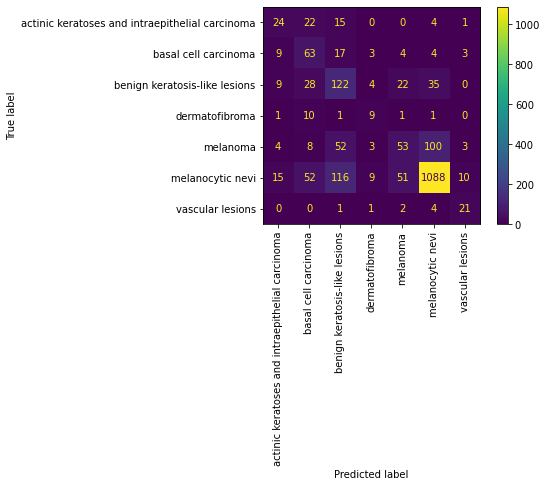

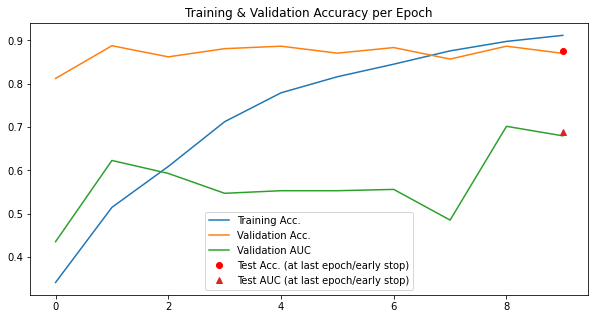

In [13]:
clf_base_dermamnist_noGDA = run_classifier_pipeline("dermamnist", info_flags, dermamnist_noGDA)

### OctMNIST

{
  "python_class": "OCTMNIST",
  "description": "The OCTMNIST is based on a prior dataset of 109,309 valid optical coherence tomography (OCT) images for retinal diseases. The dataset is comprised of 4 diagnosis categories, leading to a multi-class classification task. We split the source training set with a ratio of 9:1 into training and validation set, and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22121,536)\u00d7(277\u2212512). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/octmnist.npz?download=1",
  "MD5": "c68d92d5b585d8d81f7112f81e2d0842",
  "task": "multi-class",
  "label": {
    "0": "choroidal neovascularization",
    "1": "diabetic macular edema",
    "2": "drusen",
    "3": "normal"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 97477,
    "val": 10832,
    "test": 1000
  },
  "license": "CC BY 4.0"
}
--------------------------------

100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 39.44it/s]


train -- accuracy: 0.73
val -- accuracy: 0.94,  AUC: 0.81
Epoch 1



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 39.77it/s]


train -- accuracy: 0.83
val -- accuracy: 0.96,  AUC: 0.87
Epoch 2



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 39.72it/s]


train -- accuracy: 0.86
val -- accuracy: 0.96,  AUC: 0.82
Epoch 3



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.81it/s]


train -- accuracy: 0.88
val -- accuracy: 0.96,  AUC: 0.82
Epoch 4



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 37.95it/s]


train -- accuracy: 0.9
val -- accuracy: 0.97,  AUC: 0.88
Epoch 5



100%|█████████████████████████████████████████| 762/762 [00:20<00:00, 38.10it/s]


train -- accuracy: 0.91
val -- accuracy: 0.97,  AUC: 0.88
Epoch 6



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.67it/s]


train -- accuracy: 0.93
val -- accuracy: 0.96,  AUC: 0.89
Epoch 7



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.79it/s]


train -- accuracy: 0.93
val -- accuracy: 0.97,  AUC: 0.88
Epoch 8



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.68it/s]


train -- accuracy: 0.94
val -- accuracy: 0.97,  AUC: 0.87
Epoch 9



100%|█████████████████████████████████████████| 762/762 [00:19<00:00, 38.64it/s]


train -- accuracy: 0.95
val -- accuracy: 0.97,  AUC: 0.86
test -- accuracy: 0.93,  AUC: 0.71


<Figure size 720x720 with 0 Axes>

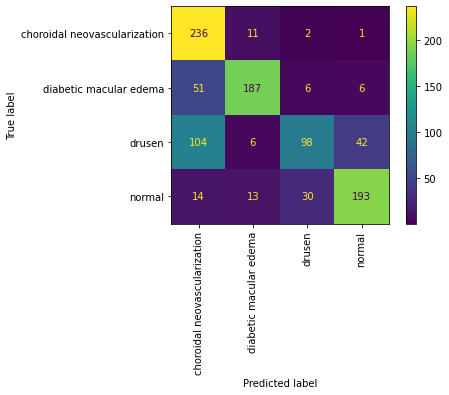

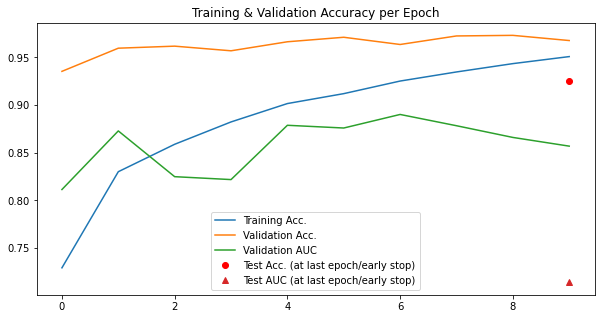

In [14]:
clf_base_octmnist_noGDA = run_classifier_pipeline("octmnist", info_flags, octmnist_noGDA)

### PneumoniaMNIST

{
  "python_class": "PneumoniaMNIST",
  "description": "The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22122,916)\u00d7(127\u22122,713). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/pneumoniamnist.npz?download=1",
  "MD5": "28209eda62fecd6e6a2d98b1501bb15f",
  "task": "binary-class",
  "label": {
    "0": "normal",
    "1": "pneumonia"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 4708,
    "val": 524,
    "test": 624
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           

100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 37.71it/s]


train -- accuracy: 0.85
val -- accuracy: 0.97,  AUC: 0.74
Epoch 1



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.16it/s]


train -- accuracy: 0.95
val -- accuracy: 0.99,  AUC: 0.95
Epoch 2



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.09it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.96
Epoch 3



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 38.50it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.97
Epoch 4



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 40.15it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 5



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.95it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 6



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 40.18it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 7



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.91it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 8



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 38.14it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.98
Epoch 9



100%|███████████████████████████████████████████| 37/37 [00:00<00:00, 39.07it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.98
test -- accuracy: 0.96,  AUC: 0.86


<Figure size 720x720 with 0 Axes>

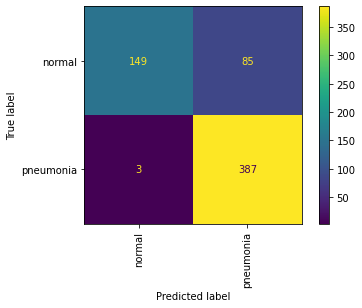

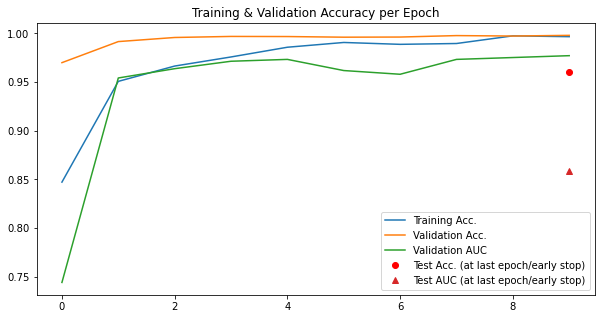

In [15]:
clf_base_pneumoniamnist_noGDA = run_classifier_pipeline("pneumoniamnist", info_flags, pneumoniamnist_noGDA)

### BreastMNIST

{
  "python_class": "BreastMNIST",
  "description": "The BreastMNIST is based on a dataset of 780 breast ultrasound images. It is categorized into 3 classes: normal, benign, and malignant. As we use low-resolution images, we simplify the task into binary classification by combining normal and benign as positive and classifying them against malignant as negative. We split the source dataset with a ratio of 7:1:2 into training, validation and test set. The source images of 1\u00d7500\u00d7500 are resized into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/breastmnist.npz?download=1",
  "MD5": "750601b1f35ba3300ea97c75c52ff8f6",
  "task": "binary-class",
  "label": {
    "0": "malignant",
    "1": "normal, benign"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 546,
    "val": 78,
    "test": 156
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
    

100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 46.32it/s]


train -- accuracy: 0.52
val -- accuracy: 0.42,  AUC: 0.73
Epoch 1



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 44.55it/s]


train -- accuracy: 0.54
val -- accuracy: 0.47,  AUC: 0.73
Epoch 2



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.40it/s]


train -- accuracy: 0.57
val -- accuracy: 0.67,  AUC: 0.28
Epoch 3



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 44.11it/s]


train -- accuracy: 0.68
val -- accuracy: 0.72,  AUC: 0.27
Epoch 4



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 42.92it/s]


train -- accuracy: 0.78
val -- accuracy: 0.73,  AUC: 0.31
Epoch 5



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.74it/s]


train -- accuracy: 0.76
val -- accuracy: 0.76,  AUC: 0.33
Epoch 6



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 44.84it/s]


train -- accuracy: 0.76
val -- accuracy: 0.79,  AUC: 0.35
Epoch 7



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 42.54it/s]


train -- accuracy: 0.82
val -- accuracy: 0.83,  AUC: 0.46
Epoch 8



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 43.33it/s]


train -- accuracy: 0.85
val -- accuracy: 0.87,  AUC: 0.56
Epoch 9



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 26.78it/s]


train -- accuracy: 0.87
val -- accuracy: 0.89,  AUC: 0.64
test -- accuracy: 0.85,  AUC: 0.68


<Figure size 720x720 with 0 Axes>

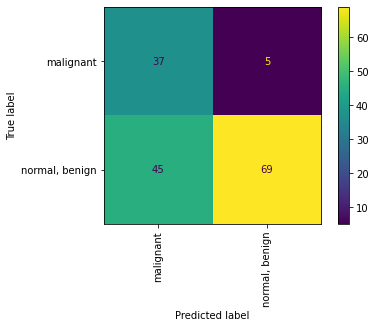

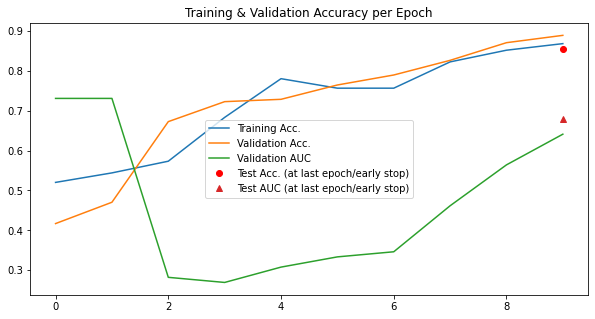

In [16]:
clf_base_breastmnist_noGDA = run_classifier_pipeline("breastmnist", info_flags, breastmnist_noGDA)

### OrganAMNIST

{
  "python_class": "OrganAMNIST",
  "description": "The OrganAMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Axial (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in axial views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organamnist.npz?download=1",
  "MD5": "866b832ed4eeba67bfb9edee1d5544e6",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-left",

100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 38.95it/s]


train -- accuracy: 0.72
val -- accuracy: 1.0,  AUC: 0.92
Epoch 1



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 38.81it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.95
Epoch 2



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 39.39it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.96
Epoch 3



100%|█████████████████████████████████████████| 271/271 [00:07<00:00, 38.12it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.97
Epoch 4



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 39.22it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.96
Epoch 5



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 39.17it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 6



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 40.27it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 7



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 39.32it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 8



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 38.75it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 9



100%|█████████████████████████████████████████| 271/271 [00:06<00:00, 39.56it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.97
test -- accuracy: 0.99,  AUC: 0.87


<Figure size 720x720 with 0 Axes>

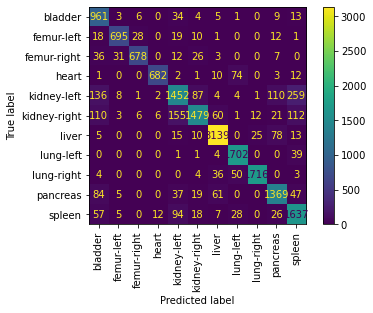

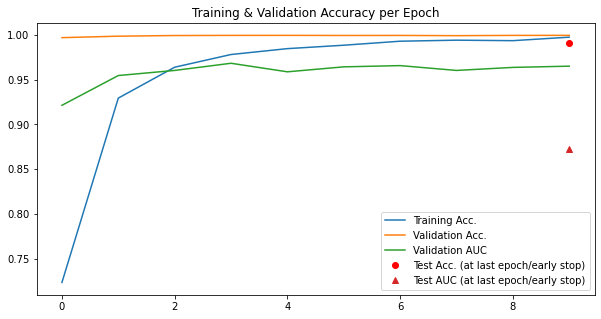

In [17]:
clf_base_organamnist_noGDA = run_classifier_pipeline("organamnist", info_flags, organamnist_noGDA)

### OrganCMNIST

{
  "python_class": "OrganCMNIST",
  "description": "The OrganCMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Coronal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in coronal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organcmnist.npz?download=1",
  "MD5": "0afa5834fb105f7705a7d93372119a21",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-le

100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 39.99it/s]


train -- accuracy: 0.49
val -- accuracy: 0.99,  AUC: 0.81
Epoch 1



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 40.01it/s]


train -- accuracy: 0.79
val -- accuracy: 1.0,  AUC: 0.91
Epoch 2



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 39.97it/s]


train -- accuracy: 0.88
val -- accuracy: 1.0,  AUC: 0.93
Epoch 3



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 39.76it/s]


train -- accuracy: 0.91
val -- accuracy: 1.0,  AUC: 0.95
Epoch 4



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.62it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.94
Epoch 5



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.72it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
Epoch 6



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 39.30it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.94
Epoch 7



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.56it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.95
Epoch 8



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 38.37it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.95
Epoch 9



100%|█████████████████████████████████████████| 102/102 [00:02<00:00, 39.44it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.95
test -- accuracy: 0.99,  AUC: 0.87


<Figure size 720x720 with 0 Axes>

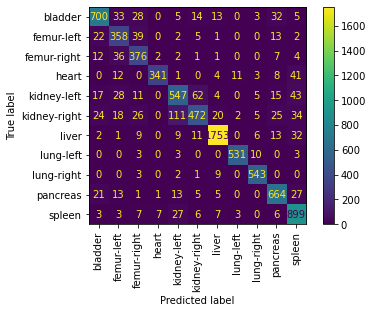

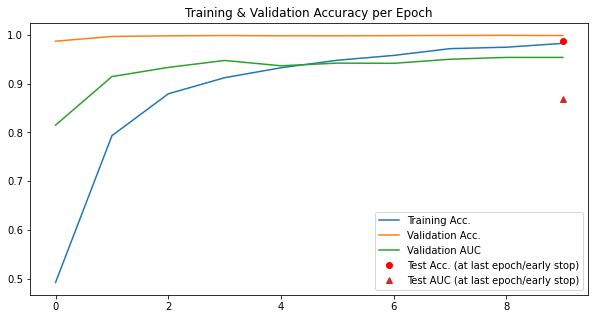

In [18]:
clf_base_organcmnist_noGDA = run_classifier_pipeline("organcmnist", info_flags, organcmnist_noGDA)

### OrganSMNIST

{
  "python_class": "OrganSMNIST",
  "description": "The OrganSMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Sagittal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in sagittal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organsmnist.npz?download=1",
  "MD5": "e5c39f1af030238290b9557d9503af9d",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-

100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 39.37it/s]


train -- accuracy: 0.36
val -- accuracy: 0.95,  AUC: 0.66
Epoch 1



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 39.26it/s]


train -- accuracy: 0.62
val -- accuracy: 0.98,  AUC: 0.79
Epoch 2



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 39.55it/s]


train -- accuracy: 0.71
val -- accuracy: 0.98,  AUC: 0.77
Epoch 3



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 39.35it/s]


train -- accuracy: 0.75
val -- accuracy: 0.99,  AUC: 0.83
Epoch 4



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.36it/s]


train -- accuracy: 0.79
val -- accuracy: 0.99,  AUC: 0.82
Epoch 5



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.79it/s]


train -- accuracy: 0.83
val -- accuracy: 0.99,  AUC: 0.83
Epoch 6



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.68it/s]


train -- accuracy: 0.86
val -- accuracy: 0.99,  AUC: 0.83
Epoch 7



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.98it/s]


train -- accuracy: 0.87
val -- accuracy: 0.99,  AUC: 0.83
Epoch 8



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 38.15it/s]


train -- accuracy: 0.89
val -- accuracy: 0.99,  AUC: 0.84
Epoch 9



100%|█████████████████████████████████████████| 109/109 [00:02<00:00, 37.51it/s]


train -- accuracy: 0.91
val -- accuracy: 0.99,  AUC: 0.85
test -- accuracy: 0.96,  AUC: 0.71


<Figure size 720x720 with 0 Axes>

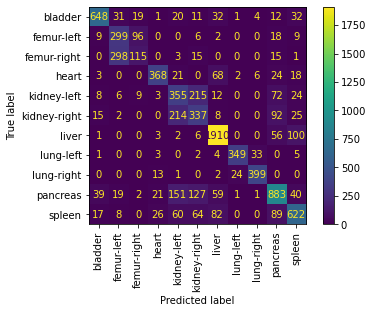

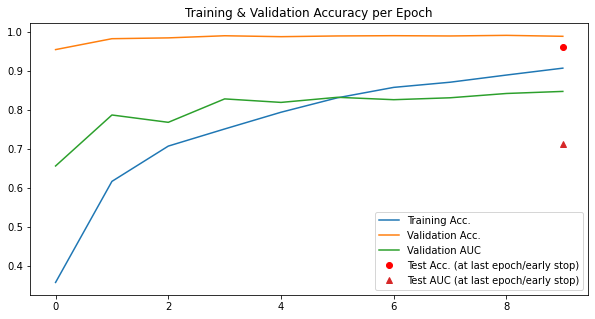

In [19]:
clf_base_organsmnist_noGDA = run_classifier_pipeline("organsmnist", info_flags, organsmnist_noGDA)

## 4. Training a Conditional Variational Autoencoder for Data Augmentation and Retraining the Classifier with an Augmented Dataset

### PathMNIST

#### Training the Conditional VAE

In [12]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["pathmnist"][0]["label"])
n_channels = info_flags["pathmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 150
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 3, 28, 28])
Forward pass test:  True
{'loss': tensor(27136.6523, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(27136.5625, grad_fn=<MseLossBackward0>), 'KLD': tensor(-17.9964, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 81.13540674710869
Validation set loss: 64.946947
Train epoch 2 -- average loss: 60.744219742964056
Validation set loss: 55.282179
Train epoch 3 -- average loss: 51.8224119300593
Validation set loss: 49.756213
Train epoch 4 -- average loss: 47.321602000602695
Validation set loss: 44.354077
Train epoch 5 -- average loss: 44.0658697264529
Validation set loss: 42.053598
Train epoch 6 -- average loss: 41.64451685184489
Validation set loss: 40.233365
Train epoch 7 -- average loss: 39.56699471541726
Validation set loss: 40.153587
Train epoch 8 -- average loss: 38.41947439620906
Validation set loss: 

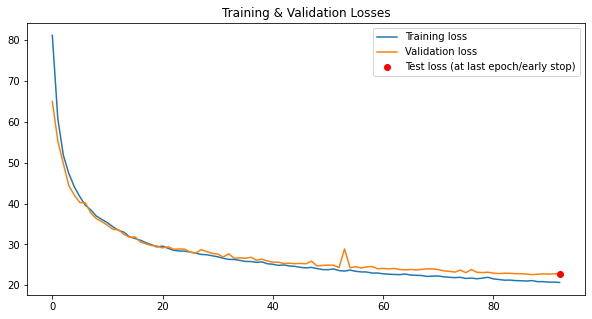

In [22]:
# Retrieves the data loader
train_loader = pathmnist_noGDA[3]
val_loader = pathmnist_noGDA[5]
test_loader = pathmnist_noGDA[4]

# Runs the conditional VAE
pathmnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="pathmnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [13]:
# Creates a new data loader with the augmented data added to the already existing data
# 4% generated data was added, with weights corresponding to the rarity of the class 

condVAE_pathmnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/pathmnist/pathmnist_epoch101.pth", 
    pathmnist_noGDA[0], 64, pathmnist_noGDA[4], pathmnist_noGDA[5], 4000,
    weighted_sampling=True
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "PathMNIST",
  "description": "The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3\u00d7224\u00d7224 into 3\u00d728\u00d728, and split NCT-CRC-HE-100K into training and validation set with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/pathmnist.npz?download=1",
  "MD5": "a8b06965200029087d5bd730944a56c1",
  "task": "multi-class",
  "label": {
    "0": "adipose",
    "1": "background",
    "2": "debris",
    "3": "lymphocytes",
    "4": "mucus",
    "5": "smooth muscle",
    "6": "normal colon mucosa"

100%|██████████████████████████████████████| 1469/1469 [00:14<00:00, 101.22it/s]


train -- accuracy: 0.72
val -- accuracy: 0.97,  AUC: 0.73
Epoch 1



100%|██████████████████████████████████████| 1469/1469 [00:14<00:00, 102.90it/s]


train -- accuracy: 0.86
val -- accuracy: 0.99,  AUC: 0.84
Epoch 2



100%|██████████████████████████████████████| 1469/1469 [00:14<00:00, 100.86it/s]


train -- accuracy: 0.89
val -- accuracy: 0.99,  AUC: 0.91
Epoch 3



100%|██████████████████████████████████████| 1469/1469 [00:14<00:00, 102.11it/s]


train -- accuracy: 0.91
val -- accuracy: 0.99,  AUC: 0.9
Epoch 4



100%|██████████████████████████████████████| 1469/1469 [00:13<00:00, 105.05it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.88
Epoch 5



100%|██████████████████████████████████████| 1469/1469 [00:13<00:00, 105.17it/s]


train -- accuracy: 0.93
val -- accuracy: 0.99,  AUC: 0.91
Epoch 6



100%|██████████████████████████████████████| 1469/1469 [00:13<00:00, 104.99it/s]


train -- accuracy: 0.94
val -- accuracy: 0.99,  AUC: 0.9
Epoch 7



100%|██████████████████████████████████████| 1469/1469 [00:13<00:00, 105.44it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.92
Epoch 8



100%|██████████████████████████████████████| 1469/1469 [00:13<00:00, 105.32it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
Epoch 9



100%|██████████████████████████████████████| 1469/1469 [00:13<00:00, 105.14it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
test -- accuracy: 0.97,  AUC: 0.85


<Figure size 720x720 with 0 Axes>

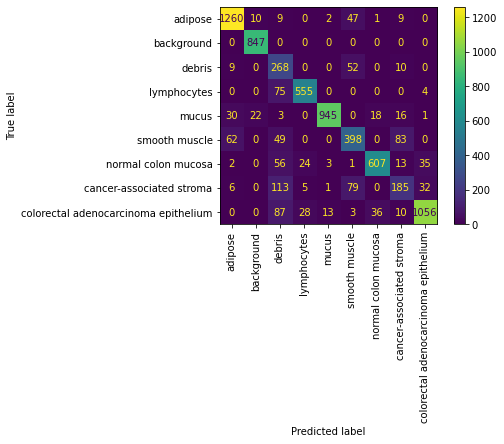

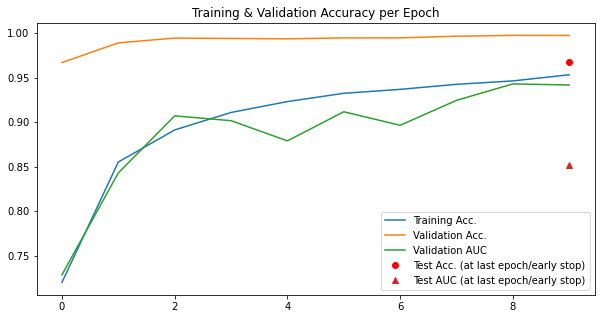

In [14]:
# Runs the classifier again 

clf_condVAE_pathmnist = run_classifier_pipeline("pathmnist", info_flags, condVAE_pathmnist_loader)

### DermaMNIST

#### Training the Conditional VAE

In [15]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["dermamnist"][0]["label"])
n_channels = info_flags["dermamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 3, 28, 28])
Forward pass test:  True
{'loss': tensor(26364.9668, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(26364.9062, grad_fn=<MseLossBackward0>), 'KLD': tensor(-12.1619, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 174.68301829309084
Validation set loss: 155.814159
Train epoch 2 -- average loss: 71.30671476960539
Validation set loss: 63.377477
Train epoch 3 -- average loss: 49.35040545392108
Validation set loss: 44.233846
Train epoch 4 -- average loss: 40.33235507517036
Validation set loss: 37.534705
Train epoch 5 -- average loss: 33.999587779686834
Validation set loss: 31.084393
Train epoch 6 -- average loss: 30.18775417523325
Validation set loss: 30.906405
Train epoch 7 -- average loss: 28.102301367717104
Validation set loss: 27.290548
Train epoch 8 -- average loss: 25.157598330798667
Validation set l

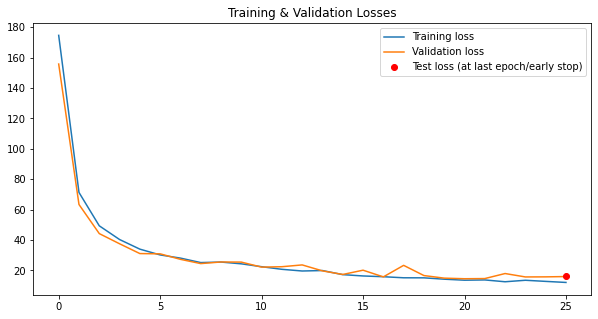

In [16]:
# Retrieves the data loader
train_loader = dermamnist_noGDA[3]
val_loader = dermamnist_noGDA[5]
test_loader = dermamnist_noGDA[4]

# Runs the conditional VAE
dermamnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="dermamnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [17]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condVAE_dermamnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/dermamnist/dermamnist_epoch40.pth", 
    dermamnist_noGDA[0], 128, dermamnist_noGDA[4], dermamnist_noGDA[5], len(dermamnist_noGDA[0])//10,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "DermaMNIST",
  "description": "The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3\u00d7600\u00d7450 are resized into 3\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/dermamnist.npz?download=1",
  "MD5": "0744692d530f8e62ec473284d019b0c7",
  "task": "multi-class",
  "label": {
    "0": "actinic keratoses and intraepithelial carcinoma",
    "1": "basal cell carcinoma",
    "2": "benign keratosis-like lesions",
    "3": "dermatofibroma",
    "4": "melanoma",
    "5": "melanocytic nevi",
    "6": "vascular lesions"
  },
  "n_channels": 3,
  "n_samples": {
    "train": 7007,
    "val": 1003,
    "test": 2005
  },
  "license": "CC B

100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.26it/s]


train -- accuracy: 0.36
val -- accuracy: 0.85,  AUC: 0.47
Epoch 1



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 71.64it/s]


train -- accuracy: 0.52
val -- accuracy: 0.89,  AUC: 0.58
Epoch 2



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.05it/s]


train -- accuracy: 0.6
val -- accuracy: 0.85,  AUC: 0.46
Epoch 3



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.18it/s]


train -- accuracy: 0.66
val -- accuracy: 0.88,  AUC: 0.63
Epoch 4



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.40it/s]


train -- accuracy: 0.73
val -- accuracy: 0.9,  AUC: 0.54
Epoch 5



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.44it/s]


train -- accuracy: 0.78
val -- accuracy: 0.89,  AUC: 0.6
Epoch 6



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.98it/s]


train -- accuracy: 0.82
val -- accuracy: 0.9,  AUC: 0.67
Epoch 7



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.79it/s]


train -- accuracy: 0.86
val -- accuracy: 0.88,  AUC: 0.6
Epoch 8



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.28it/s]


train -- accuracy: 0.89
val -- accuracy: 0.89,  AUC: 0.63
Epoch 9



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 72.47it/s]


train -- accuracy: 0.88
val -- accuracy: 0.89,  AUC: 0.63
test -- accuracy: 0.89,  AUC: 0.64


<Figure size 720x720 with 0 Axes>

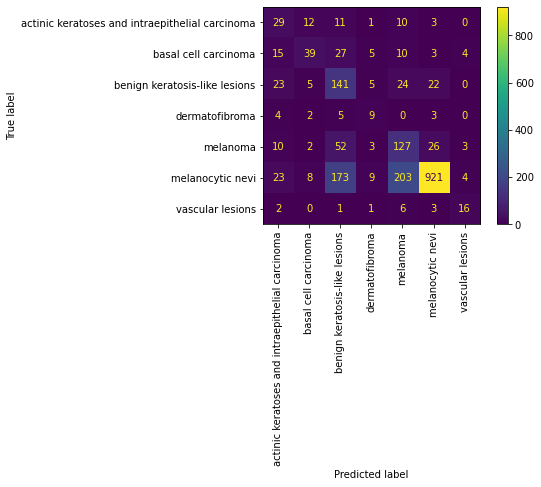

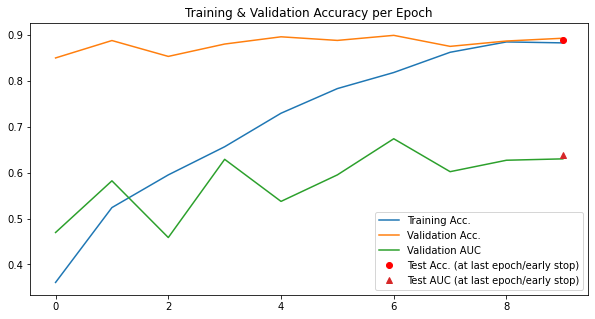

In [18]:
# Runs the classifier again 

clf_condVAE_dermamnist = run_classifier_pipeline("dermamnist", info_flags, condVAE_dermamnist_loader)

### OctMNIST

#### Training the Conditional VAE

In [19]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["octmnist"][0]["label"])
n_channels = info_flags["octmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(8625.8330, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8625.7676, grad_fn=<MseLossBackward0>), 'KLD': tensor(-13.1478, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 17.19294979821362
Validation set loss: 7.265178
Train epoch 2 -- average loss: 6.570273666845969
Validation set loss: 4.768516
Train epoch 3 -- average loss: 4.841348619092316
Validation set loss: 3.690773
Train epoch 4 -- average loss: 4.022363103235751
Validation set loss: 4.038991
Train epoch 5 -- average loss: 3.4035698319041066
Validation set loss: 2.844243
Train epoch 6 -- average loss: 3.0819733812808083
Validation set loss: 2.792446
Train epoch 7 -- average loss: 2.8324641290894763
Validation set loss: 2.68468
Train epoch 8 -- average loss: 2.682543690876728
Validation set loss: 2.21521

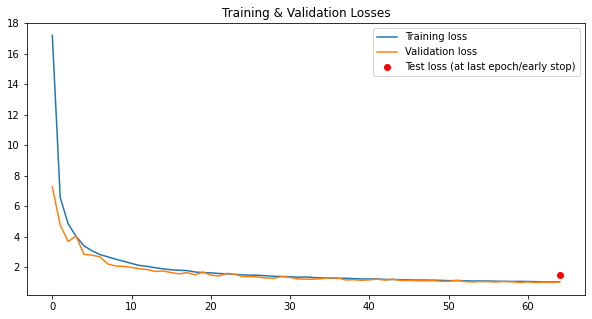

In [20]:
# Retrieves the data loader
train_loader = octmnist_noGDA[3]
val_loader = octmnist_noGDA[5]
test_loader = octmnist_noGDA[4]

# Runs the conditional VAE
octmnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="octmnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [21]:
# Creates a new data loader with the augmented data added to the already existing data
# 4% generated data was added, with weights corresponding to the rarity of the class 

condVAE_octmnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/octmnist/octmnist_epoch54.pth", 
    octmnist_noGDA[0], 128, octmnist_noGDA[4], octmnist_noGDA[5], 4000,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OCTMNIST",
  "description": "The OCTMNIST is based on a prior dataset of 109,309 valid optical coherence tomography (OCT) images for retinal diseases. The dataset is comprised of 4 diagnosis categories, leading to a multi-class classification task. We split the source training set with a ratio of 9:1 into training and validation set, and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22121,536)\u00d7(277\u2212512). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/octmnist.npz?download=1",
  "MD5": "c68d92d5b585d8d81f7112f81e2d0842",
  "task": "multi-class",
  "label": {
    "0": "choroidal neovascularization",
    "1": "diabetic macular edema",
    "2": "drusen",
    "3": "normal"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 97477,
    "val": 10832,
    "test": 1000
  },
  "license": "CC BY 4.0"
}
--------------------------------

100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 61.83it/s]


train -- accuracy: 0.72
val -- accuracy: 0.94,  AUC: 0.81
Epoch 1



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 64.54it/s]


train -- accuracy: 0.82
val -- accuracy: 0.95,  AUC: 0.82
Epoch 2



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 62.56it/s]


train -- accuracy: 0.85
val -- accuracy: 0.96,  AUC: 0.74
Epoch 3



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 63.89it/s]


train -- accuracy: 0.88
val -- accuracy: 0.96,  AUC: 0.86
Epoch 4



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 61.09it/s]


train -- accuracy: 0.89
val -- accuracy: 0.97,  AUC: 0.89
Epoch 5



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 61.48it/s]


train -- accuracy: 0.9
val -- accuracy: 0.96,  AUC: 0.85
Epoch 6



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 62.03it/s]


train -- accuracy: 0.92
val -- accuracy: 0.97,  AUC: 0.91
Epoch 7



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 63.39it/s]


train -- accuracy: 0.93
val -- accuracy: 0.97,  AUC: 0.9
Epoch 8



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 62.97it/s]


train -- accuracy: 0.94
val -- accuracy: 0.97,  AUC: 0.86
Epoch 9



100%|█████████████████████████████████████████| 793/793 [00:12<00:00, 61.81it/s]


train -- accuracy: 0.94
val -- accuracy: 0.97,  AUC: 0.89
test -- accuracy: 0.93,  AUC: 0.71


<Figure size 720x720 with 0 Axes>

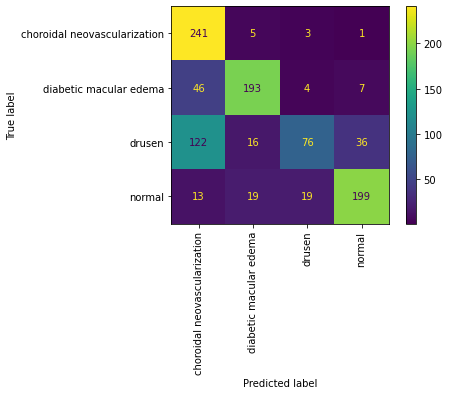

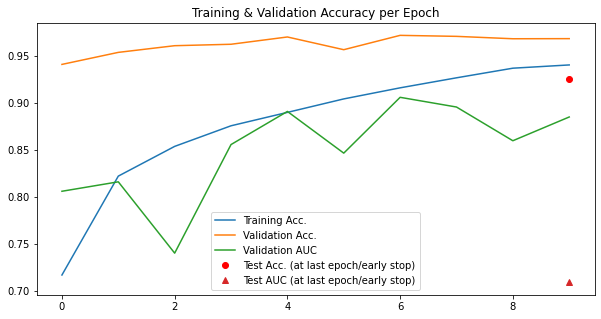

In [22]:
# Runs the classifier again 

clf_condVAE_octmnist = run_classifier_pipeline("octmnist", info_flags, condVAE_octmnist_loader)

### PneumoniaMNIST

#### Training the Conditional VAE

In [23]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["pneumoniamnist"][0]["label"])
n_channels = info_flags["pneumoniamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 150
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(8371.5391, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8371.4434, grad_fn=<MseLossBackward0>), 'KLD': tensor(-19.0912, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 49.528974119849195
Validation set loss: 30.622793
Train epoch 2 -- average loss: 28.237484163010436
Validation set loss: 24.829663
Train epoch 3 -- average loss: 20.4147206373709
Validation set loss: 18.111246
Train epoch 4 -- average loss: 15.345664465943939
Validation set loss: 13.577257
Train epoch 5 -- average loss: 12.164803815272874
Validation set loss: 10.660208
Train epoch 6 -- average loss: 10.473185886846524
Validation set loss: 9.818214
Train epoch 7 -- average loss: 9.344983382050831
Validation set loss: 9.275686
Train epoch 8 -- average loss: 8.478795961495061
Validation set loss: 

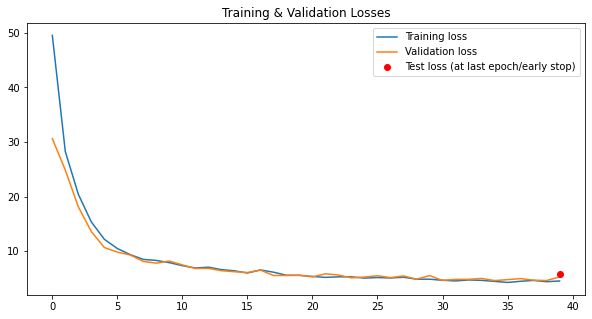

In [24]:
# Retrieves the data loader
train_loader = pneumoniamnist_noGDA[3]
val_loader = pneumoniamnist_noGDA[5]
test_loader = pneumoniamnist_noGDA[4]

# Runs the conditional VAE
pneumoniamnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="pneumoniamnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [25]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condVAE_pneumoniamnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/pneumoniamnist/pneumoniamnist_epoch33.pth", 
    pneumoniamnist_noGDA[0], 128, pneumoniamnist_noGDA[4], pneumoniamnist_noGDA[5], len(pneumoniamnist_noGDA[0])//10,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "PneumoniaMNIST",
  "description": "The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22122,916)\u00d7(127\u22122,713). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/pneumoniamnist.npz?download=1",
  "MD5": "28209eda62fecd6e6a2d98b1501bb15f",
  "task": "binary-class",
  "label": {
    "0": "normal",
    "1": "pneumonia"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 4708,
    "val": 524,
    "test": 624
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           

100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 63.83it/s]


train -- accuracy: 0.86
val -- accuracy: 0.99,  AUC: 0.89
Epoch 1



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 64.01it/s]


train -- accuracy: 0.95
val -- accuracy: 0.99,  AUC: 0.96
Epoch 2



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 63.68it/s]


train -- accuracy: 0.97
val -- accuracy: 0.99,  AUC: 0.97
Epoch 3



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 63.10it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.97
Epoch 4



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 62.96it/s]


train -- accuracy: 0.99
val -- accuracy: 0.99,  AUC: 0.95
Epoch 5



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 64.47it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.98
Epoch 6



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 64.61it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 7



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 63.96it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 8



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 64.44it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.97
Epoch 9



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 62.41it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.98
test -- accuracy: 0.96,  AUC: 0.86


<Figure size 720x720 with 0 Axes>

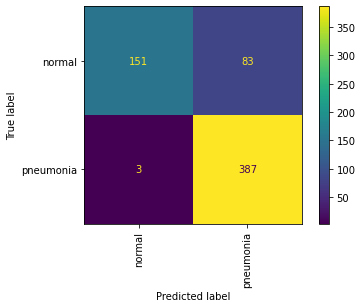

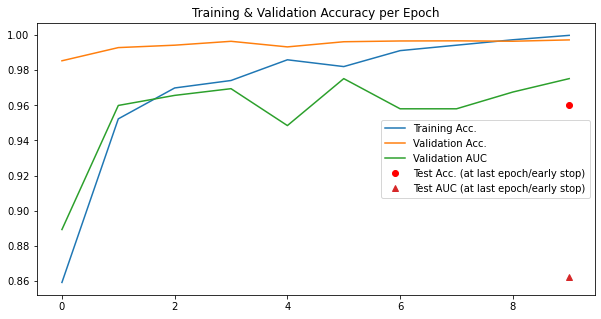

In [26]:
# Runs the classifier again 

clf_condVAE_pneumoniamnist = run_classifier_pipeline("pneumoniamnist", info_flags, condVAE_pneumoniamnist_loader)

### BreastMNIST

#### Training the Conditional VAE

In [27]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["breastmnist"][0]["label"])
n_channels = info_flags["breastmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 150
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(9402.2979, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(9402.2051, grad_fn=<MseLossBackward0>), 'KLD': tensor(-18.5098, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 255.71328768887363
Validation set loss: 187.097431
Train epoch 2 -- average loss: 79.59832383599473
Validation set loss: 134.522887
Train epoch 3 -- average loss: 64.79563283396291
Validation set loss: 177.309257
Train epoch 4 -- average loss: 59.38478485219208
Validation set loss: 197.284743
Train epoch 5 -- average loss: 58.16799066005609
Validation set loss: 129.552759
Train epoch 6 -- average loss: 60.067934811770265
Validation set loss: 65.216778
Train epoch 7 -- average loss: 48.8980478140024
Validation set loss: 49.67401
Train epoch 8 -- average loss: 46.84733184702667
Validation set los

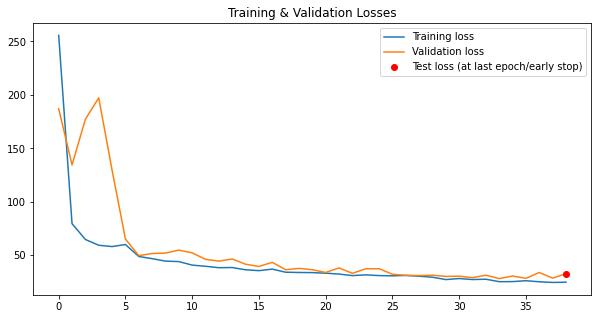

In [28]:
# Retrieves the data loader
train_loader = breastmnist_noGDA[3]
val_loader = breastmnist_noGDA[5]
test_loader = breastmnist_noGDA[4]

# Runs the conditional VAE
breastmnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="breastmnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [29]:
# Creates a new data loader with the augmented data added to the already existing data
# 3.3% generated data was added, with weights corresponding to the rarity of the class 

condVAE_breastmnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/breastmnist/breastmnist_epoch58.pth", 
    breastmnist_noGDA[0], 128, breastmnist_noGDA[4], breastmnist_noGDA[5], len(breastmnist_noGDA[0])//30,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "BreastMNIST",
  "description": "The BreastMNIST is based on a dataset of 780 breast ultrasound images. It is categorized into 3 classes: normal, benign, and malignant. As we use low-resolution images, we simplify the task into binary classification by combining normal and benign as positive and classifying them against malignant as negative. We split the source dataset with a ratio of 7:1:2 into training, validation and test set. The source images of 1\u00d7500\u00d7500 are resized into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/breastmnist.npz?download=1",
  "MD5": "750601b1f35ba3300ea97c75c52ff8f6",
  "task": "binary-class",
  "label": {
    "0": "malignant",
    "1": "normal, benign"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 546,
    "val": 78,
    "test": 156
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
    

100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 59.29it/s]


train -- accuracy: 0.52
val -- accuracy: 0.71,  AUC: 0.27
Epoch 1



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 68.39it/s]

train -- accuracy: 0.6


val -- accuracy: 0.71,  AUC: 0.27
Epoch 2



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 64.94it/s]


train -- accuracy: 0.68
val -- accuracy: 0.72,  AUC: 0.27
Epoch 3



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 68.99it/s]


train -- accuracy: 0.71
val -- accuracy: 0.73,  AUC: 0.27
Epoch 4



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 65.09it/s]


train -- accuracy: 0.77
val -- accuracy: 0.74,  AUC: 0.37
Epoch 5



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 59.40it/s]

train -- accuracy: 0.79


val -- accuracy: 0.76,  AUC: 0.37
Epoch 6



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 59.92it/s]

train -- accuracy: 0.83


val -- accuracy: 0.77,  AUC: 0.41
Epoch 7



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 59.15it/s]

train -- accuracy: 0.82


val -- accuracy: 0.81,  AUC: 0.41
Epoch 8



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 60.31it/s]

train -- accuracy: 0.83


val -- accuracy: 0.86,  AUC: 0.56
Epoch 9



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 64.04it/s]

train -- accuracy: 0.87


val -- accuracy: 0.84,  AUC: 0.72
test -- accuracy: 0.79,  AUC: 0.71


<Figure size 720x720 with 0 Axes>

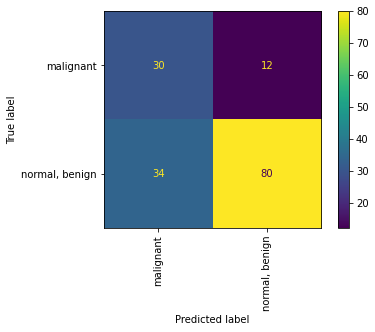

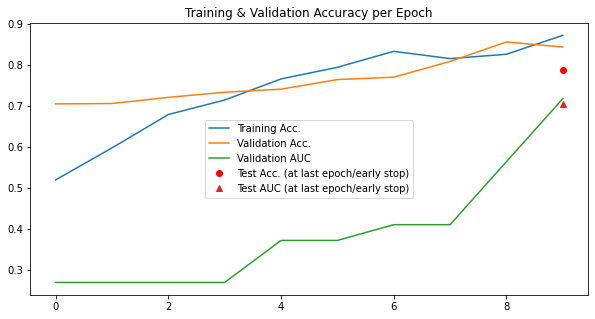

In [30]:
# Runs the classifier again 

clf_condVAE_breastmnist = run_classifier_pipeline("breastmnist", info_flags, condVAE_breastmnist_loader)

### OrganAMNIST

#### Training the Conditional VAE

In [31]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organamnist"][0]["label"])
n_channels = info_flags["organamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 150
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(8683.8262, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8683.7266, grad_fn=<MseLossBackward0>), 'KLD': tensor(-19.9087, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 112.46566423786952
Validation set loss: 89.091303
Train epoch 2 -- average loss: 70.9238394915425
Validation set loss: 75.632856
Train epoch 3 -- average loss: 59.13425090065376
Validation set loss: 67.663184
Train epoch 4 -- average loss: 53.00167211018153
Validation set loss: 63.142944
Train epoch 5 -- average loss: 48.928119901999786
Validation set loss: 61.385421
Train epoch 6 -- average loss: 46.04968753798261
Validation set loss: 59.751656
Train epoch 7 -- average loss: 44.34367079426067
Validation set loss: 59.584576
Train epoch 8 -- average loss: 42.60529990565911
Validation set loss: 5

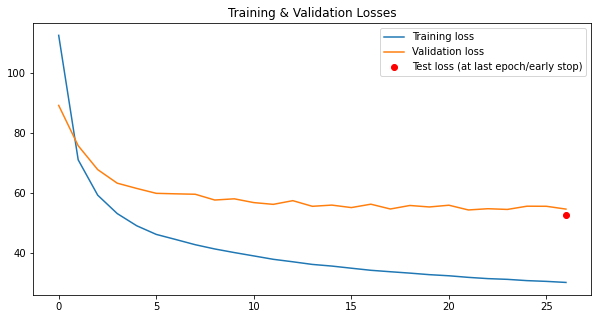

In [32]:
# Retrieves the data loader
train_loader = organamnist_noGDA[3]
val_loader = organamnist_noGDA[5]
test_loader = organamnist_noGDA[4]

# Runs the conditional VAE
organamnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="organamnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [33]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condVAE_organamnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/organamnist/organamnist_epoch29.pth", 
    organamnist_noGDA[0], 128, organamnist_noGDA[4], organamnist_noGDA[5], len(organamnist_noGDA[0])//10,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganAMNIST",
  "description": "The OrganAMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Axial (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in axial views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organamnist.npz?download=1",
  "MD5": "866b832ed4eeba67bfb9edee1d5544e6",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-left",

100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 67.12it/s]


train -- accuracy: 0.72
val -- accuracy: 1.0,  AUC: 0.94
Epoch 1



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 67.54it/s]


train -- accuracy: 0.91
val -- accuracy: 1.0,  AUC: 0.96
Epoch 2



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 66.35it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.96
Epoch 3



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 67.83it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.96
Epoch 4



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 66.45it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.96
Epoch 5



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 65.92it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.97
Epoch 6



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 66.58it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 7



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 68.25it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 8



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 71.30it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 9



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 67.37it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
test -- accuracy: 0.99,  AUC: 0.87


<Figure size 720x720 with 0 Axes>

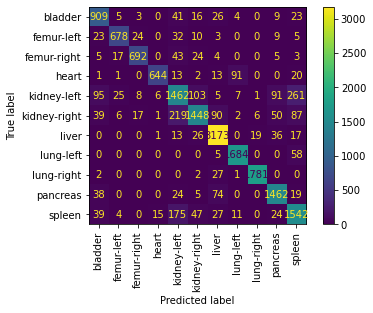

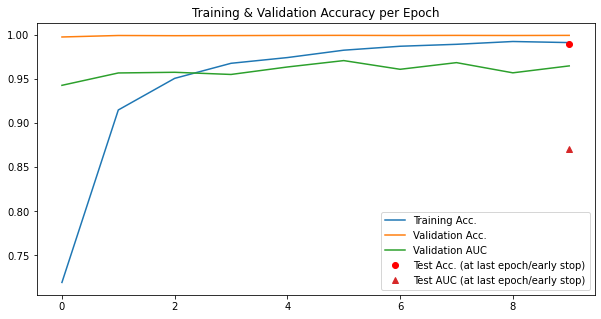

In [34]:
# Runs the classifier again 

clf_condVAE_organamnist = run_classifier_pipeline("organamnist", info_flags, condVAE_organamnist_loader)

### OrganCMNIST

#### Training the Conditional VAE

In [35]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organcmnist"][0]["label"])
n_channels = info_flags["organcmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 150
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(10111.4756, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(10111.3809, grad_fn=<MseLossBackward0>), 'KLD': tensor(-18.9830, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 144.2680283203125
Validation set loss: 114.869819
Train epoch 2 -- average loss: 91.3274365234375
Validation set loss: 89.440528
Train epoch 3 -- average loss: 75.96778891225962
Validation set loss: 79.011666
Train epoch 4 -- average loss: 67.35061842698317
Validation set loss: 74.131092
Train epoch 5 -- average loss: 62.30435862379808
Validation set loss: 73.912358
Train epoch 6 -- average loss: 59.27879341947116
Validation set loss: 70.054631
Train epoch 7 -- average loss: 55.33933715820312
Validation set loss: 65.819208
Train epoch 8 -- average loss: 54.312615966796876
Validation set loss:

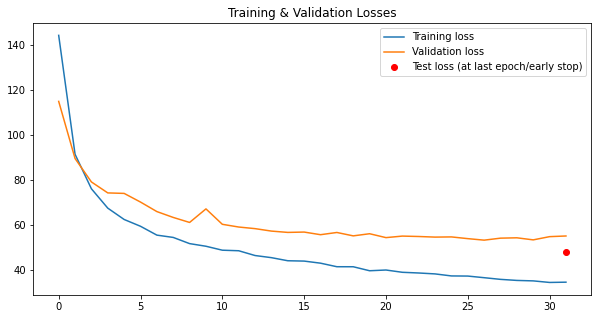

In [36]:
# Retrieves the data loader
train_loader = organcmnist_noGDA[3]
val_loader = organcmnist_noGDA[5]
test_loader = organcmnist_noGDA[4]

# Runs the conditional VAE
organcmnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="organcmnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [37]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condVAE_organcmnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/organcmnist/organcmnist_epoch26.pth", 
    organcmnist_noGDA[0], 128, organcmnist_noGDA[4], organcmnist_noGDA[5], len(organcmnist_noGDA[0])//10,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganCMNIST",
  "description": "The OrganCMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Coronal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in coronal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organcmnist.npz?download=1",
  "MD5": "0afa5834fb105f7705a7d93372119a21",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-le

100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 67.19it/s]


train -- accuracy: 0.52
val -- accuracy: 0.99,  AUC: 0.85
Epoch 1



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 69.26it/s]


train -- accuracy: 0.79
val -- accuracy: 1.0,  AUC: 0.93
Epoch 2



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 65.89it/s]


train -- accuracy: 0.85
val -- accuracy: 1.0,  AUC: 0.94
Epoch 3



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 69.80it/s]


train -- accuracy: 0.89
val -- accuracy: 1.0,  AUC: 0.94
Epoch 4



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 68.08it/s]


train -- accuracy: 0.91
val -- accuracy: 1.0,  AUC: 0.94
Epoch 5



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 66.91it/s]


train -- accuracy: 0.92
val -- accuracy: 1.0,  AUC: 0.96
Epoch 6



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 68.39it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.95
Epoch 7



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 70.19it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.94
Epoch 8



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 68.72it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.95
Epoch 9



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 69.31it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.96
test -- accuracy: 0.98,  AUC: 0.85


<Figure size 720x720 with 0 Axes>

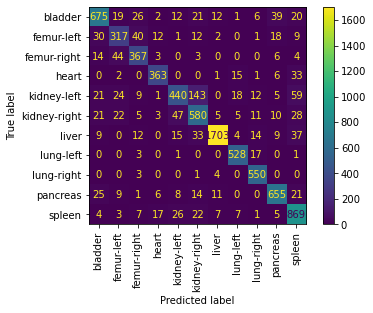

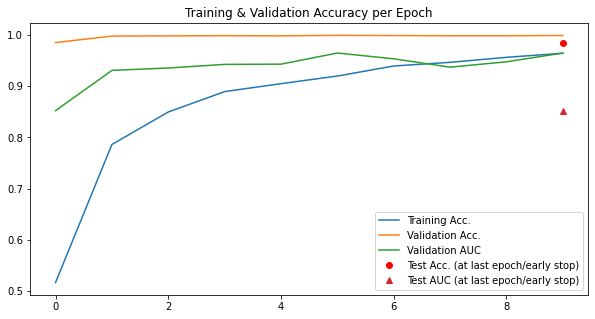

In [38]:
# Runs the classifier again 

clf_condVAE_organcmnist = run_classifier_pipeline("organcmnist", info_flags, condVAE_organcmnist_loader)

### OrganSMNIST

#### Training the Conditional VAE

In [39]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organsmnist"][0]["label"])
n_channels = info_flags["organsmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 150
epochs = 200

Testing Conditional Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(8764.6123, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8764.5195, grad_fn=<MseLossBackward0>), 'KLD': tensor(-18.6463, grad_fn=<NegBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 150.61059829514886
Validation set loss: 115.935521
Train epoch 2 -- average loss: 97.81899126838235
Validation set loss: 94.443139
Train epoch 3 -- average loss: 83.1094891891589
Validation set loss: 82.814012
Train epoch 4 -- average loss: 73.18965176509819
Validation set loss: 74.434504
Train epoch 5 -- average loss: 66.0186279997422
Validation set loss: 70.559662
Train epoch 6 -- average loss: 63.007186210993545
Validation set loss: 67.796127
Train epoch 7 -- average loss: 58.74541565554385
Validation set loss: 64.591751
Train epoch 8 -- average loss: 55.832805669666875
Validation set loss: 

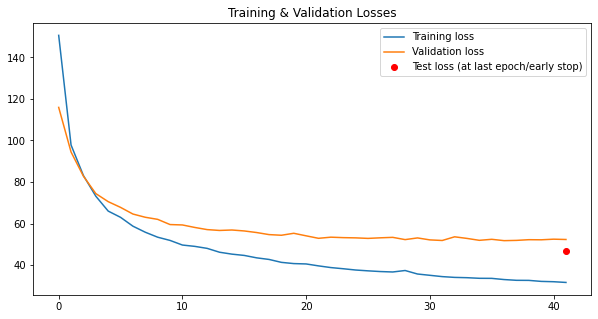

In [40]:
# Retrieves the data loader
train_loader = organsmnist_noGDA[3]
val_loader = organsmnist_noGDA[5]
test_loader = organsmnist_noGDA[4]

# Runs the conditional VAE
organsmnist_condVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, 
    n_classes=n_classes, 
    epochs=epochs, 
    name_dataset="organsmnist", 
    output_intermediary_info=False,
    model_type="CondVAE"
)

#### Generating an upgraded dataset

In [41]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condVAE_organsmnist_loader = generate_augmented_dataset_condVAE(
    n_channels, n_classes, latent_dims,
    "trained_models/CondVAE/organsmnist/organsmnist_epoch24.pth", 
    organsmnist_noGDA[0], 128, organsmnist_noGDA[4], organsmnist_noGDA[5], len(organsmnist_noGDA[0])//10,
    weighted_sampling=True)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganSMNIST",
  "description": "The OrganSMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Sagittal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in sagittal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organsmnist.npz?download=1",
  "MD5": "e5c39f1af030238290b9557d9503af9d",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-

100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 67.48it/s]


train -- accuracy: 0.38
val -- accuracy: 0.97,  AUC: 0.71
Epoch 1



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 69.72it/s]


train -- accuracy: 0.62
val -- accuracy: 0.98,  AUC: 0.75
Epoch 2



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 69.27it/s]


train -- accuracy: 0.69
val -- accuracy: 0.99,  AUC: 0.8
Epoch 3



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 68.16it/s]


train -- accuracy: 0.74
val -- accuracy: 0.99,  AUC: 0.82
Epoch 4



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 69.40it/s]


train -- accuracy: 0.77
val -- accuracy: 0.99,  AUC: 0.79
Epoch 5



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 68.28it/s]


train -- accuracy: 0.79
val -- accuracy: 0.99,  AUC: 0.82
Epoch 6



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 67.92it/s]


train -- accuracy: 0.83
val -- accuracy: 0.99,  AUC: 0.85
Epoch 7



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 69.13it/s]


train -- accuracy: 0.84
val -- accuracy: 0.99,  AUC: 0.84
Epoch 8



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 69.54it/s]


train -- accuracy: 0.86
val -- accuracy: 0.99,  AUC: 0.84
Epoch 9



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 69.51it/s]


train -- accuracy: 0.89
val -- accuracy: 0.99,  AUC: 0.84
test -- accuracy: 0.96,  AUC: 0.71


<Figure size 720x720 with 0 Axes>

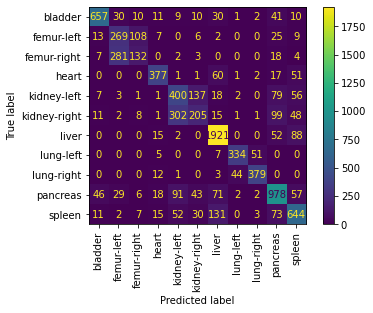

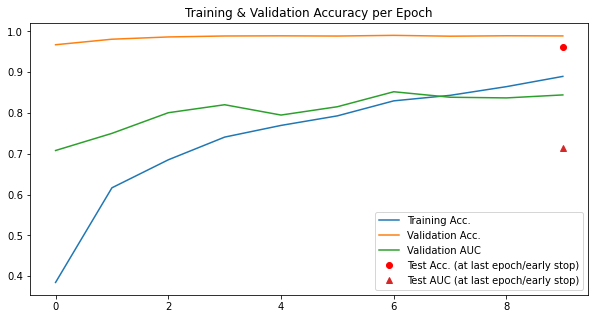

In [42]:
# Runs the classifier again 

clf_condVAE_organsmnist = run_classifier_pipeline("organsmnist", info_flags, condVAE_organsmnist_loader)

## 5. Training a Joint Variational Autoencoder for Data Augmentation and Retraining the Classifier with an Augmented Dataset

### PathMNIST

#### Training the Joint VAE

In [43]:
# Retrieves the dataset parameters
n_channels = info_flags["pathmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 3, 28, 28])
Forward pass test:  True
{'loss': tensor(805671.1250, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(26855.6426, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(378.6323, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 2438.814382527244
Validation set loss: 2745.741385
Train epoch 2 -- average loss: 1766.2077850812466
Validation set loss: 1606.74001
Train epoch 3 -- average loss: 1544.6557215151402
Validation set loss: 1520.861579
Train epoch 4 -- average loss: 1431.0077424665055
Validation set loss: 1384.245071
Train epoch 5 -- average loss: 1348.5809824837702
Validation set loss: 1312.203459
Train epoch 6 -- average loss: 1283.85167094666
Validation set loss: 1240.739393
Train epoch 7 -- average loss: 1226.991060627
Validation set loss: 1231.345304
Train epoch 8 -- average loss: 1185.7361057626867
Va

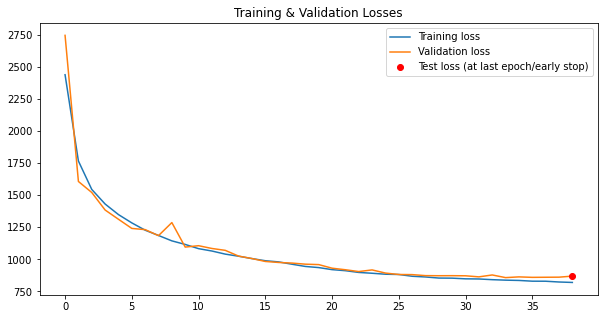

In [44]:
# Retrieves the data loader
train_loader = pathmnist_noGDA[3]
val_loader = pathmnist_noGDA[5]
test_loader = pathmnist_noGDA[4]

# Runs the Joint VAE
pathmnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="pathmnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [45]:
# Creates a new data loader with the augmented data added to the already existing data
# 4% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_pathmnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/pathmnist/pathmnist_epoch35.pth", 
    pathmnist_noGDA[0], 64, pathmnist_noGDA[4], pathmnist_noGDA[5], 4000
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "PathMNIST",
  "description": "The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3\u00d7224\u00d7224 into 3\u00d728\u00d728, and split NCT-CRC-HE-100K into training and validation set with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/pathmnist.npz?download=1",
  "MD5": "a8b06965200029087d5bd730944a56c1",
  "task": "multi-class",
  "label": {
    "0": "adipose",
    "1": "background",
    "2": "debris",
    "3": "lymphocytes",
    "4": "mucus",
    "5": "smooth muscle",
    "6": "normal colon mucosa"

100%|███████████████████████████████████████| 2813/2813 [04:31<00:00, 10.36it/s]


train -- accuracy: 0.43
val -- accuracy: 0.98,  AUC: 0.82
Epoch 1



100%|███████████████████████████████████████| 2813/2813 [04:34<00:00, 10.26it/s]


train -- accuracy: 0.49
val -- accuracy: 0.99,  AUC: 0.88
Epoch 2



100%|███████████████████████████████████████| 2813/2813 [04:25<00:00, 10.58it/s]


train -- accuracy: 0.51
val -- accuracy: 0.99,  AUC: 0.89
Epoch 3



100%|███████████████████████████████████████| 2813/2813 [04:28<00:00, 10.47it/s]


train -- accuracy: 0.52
val -- accuracy: 1.0,  AUC: 0.92
Epoch 4



100%|███████████████████████████████████████| 2813/2813 [04:37<00:00, 10.13it/s]


train -- accuracy: 0.52
val -- accuracy: 1.0,  AUC: 0.93
Epoch 5



100%|███████████████████████████████████████| 2813/2813 [04:35<00:00, 10.22it/s]


train -- accuracy: 0.53
val -- accuracy: 1.0,  AUC: 0.93
Epoch 6



100%|███████████████████████████████████████| 2813/2813 [04:27<00:00, 10.52it/s]


train -- accuracy: 0.53
val -- accuracy: 0.99,  AUC: 0.92
Epoch 7



100%|███████████████████████████████████████| 2813/2813 [04:35<00:00, 10.23it/s]


train -- accuracy: 0.53
val -- accuracy: 1.0,  AUC: 0.94
Epoch 8



100%|███████████████████████████████████████| 2813/2813 [04:25<00:00, 10.60it/s]


train -- accuracy: 0.53
val -- accuracy: 1.0,  AUC: 0.93
Epoch 9



100%|███████████████████████████████████████| 2813/2813 [04:25<00:00, 10.60it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.95
test -- accuracy: 0.98,  AUC: 0.85


<Figure size 720x720 with 0 Axes>

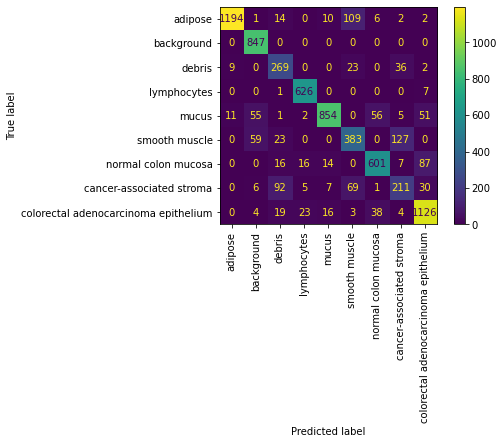

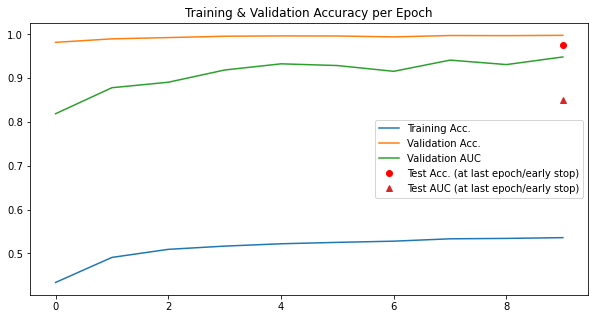

In [46]:
# Runs the classifier again 

clf_jointVAE_pathmnist = run_classifier_pipeline("pathmnist", info_flags, jointVAE_pathmnist_loader)

### DermaMNIST

#### Training the Joint VAE

In [47]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["dermamnist"][0]["label"])
n_channels = info_flags["dermamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 3, 28, 28])
Forward pass test:  True
{'loss': tensor(814135.8750, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(27137.7988, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(392.4016, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 3760.4392192628798
Validation set loss: 2743.971897
Train epoch 2 -- average loss: 2006.4295949586128
Validation set loss: 2122.354343
Train epoch 3 -- average loss: 1484.1989929713145
Validation set loss: 1353.613503
Train epoch 4 -- average loss: 1131.7262045989723
Validation set loss: 1124.071567
Train epoch 5 -- average loss: 980.967571491009
Validation set loss: 877.487179
Train epoch 6 -- average loss: 923.9595627586699
Validation set loss: 891.046314
Train epoch 7 -- average loss: 826.2158321589125
Validation set loss: 839.005188
Train epoch 8 -- average loss: 809.054664085914
Val

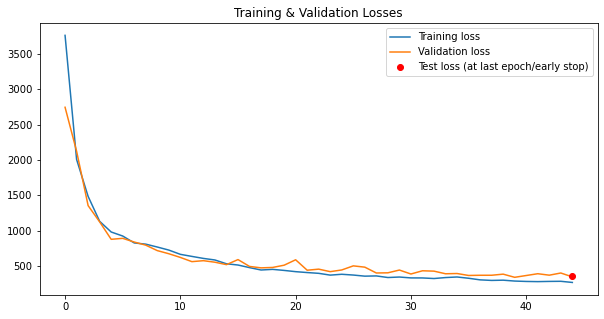

In [48]:
# Retrieves the data loader
train_loader = dermamnist_noGDA[3]
val_loader = dermamnist_noGDA[5]
test_loader = dermamnist_noGDA[4]

# Runs the Joint VAE
dermamnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="dermamnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [49]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_dermamnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/dermamnist/dermamnist_epoch42.pth", 
    dermamnist_noGDA[0], 128, dermamnist_noGDA[4], dermamnist_noGDA[5], len(dermamnist_noGDA[0])//10
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "DermaMNIST",
  "description": "The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3\u00d7600\u00d7450 are resized into 3\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/dermamnist.npz?download=1",
  "MD5": "0744692d530f8e62ec473284d019b0c7",
  "task": "multi-class",
  "label": {
    "0": "actinic keratoses and intraepithelial carcinoma",
    "1": "basal cell carcinoma",
    "2": "benign keratosis-like lesions",
    "3": "dermatofibroma",
    "4": "melanoma",
    "5": "melanocytic nevi",
    "6": "vascular lesions"
  },
  "n_channels": 3,
  "n_samples": {
    "train": 7007,
    "val": 1003,
    "test": 2005
  },
  "license": "CC B

100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.43it/s]


train -- accuracy: 0.25
val -- accuracy: 0.83,  AUC: 0.35
Epoch 1



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.46it/s]


train -- accuracy: 0.35
val -- accuracy: 0.87,  AUC: 0.59
Epoch 2



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.40it/s]


train -- accuracy: 0.39
val -- accuracy: 0.85,  AUC: 0.53
Epoch 3



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.44it/s]


train -- accuracy: 0.41
val -- accuracy: 0.87,  AUC: 0.61
Epoch 4



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.40it/s]


train -- accuracy: 0.45
val -- accuracy: 0.87,  AUC: 0.57
Epoch 5



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.41it/s]


train -- accuracy: 0.46
val -- accuracy: 0.85,  AUC: 0.54
Epoch 6



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.30it/s]


train -- accuracy: 0.47
val -- accuracy: 0.88,  AUC: 0.57
Epoch 7



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.32it/s]


train -- accuracy: 0.49
val -- accuracy: 0.89,  AUC: 0.63
Epoch 8



100%|█████████████████████████████████████████| 110/110 [00:22<00:00,  4.84it/s]


train -- accuracy: 0.51
val -- accuracy: 0.88,  AUC: 0.57
Epoch 9



100%|█████████████████████████████████████████| 110/110 [00:20<00:00,  5.28it/s]


train -- accuracy: 0.51
val -- accuracy: 0.88,  AUC: 0.62
test -- accuracy: 0.89,  AUC: 0.64


<Figure size 720x720 with 0 Axes>

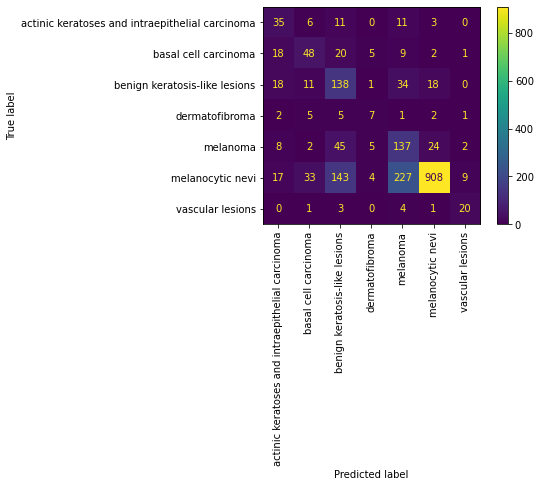

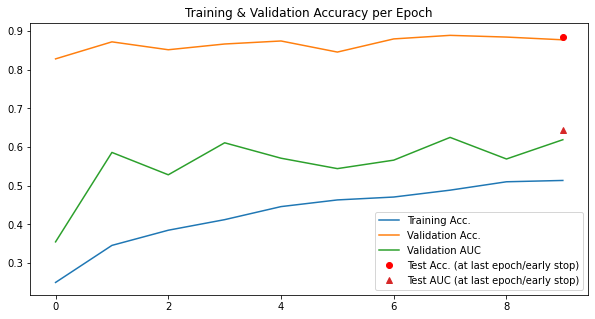

In [50]:
# Runs the classifier again 

clf_jointVAE_dermamnist = run_classifier_pipeline("dermamnist", info_flags, jointVAE_dermamnist_loader)

### OctMNIST

#### Training the Joint VAE

In [51]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["octmnist"][0]["label"])
n_channels = info_flags["octmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 75
categorical_dims = 25
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(288960.3125, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(9631.9600, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(297.2159, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 382.96205693474485
Validation set loss: 183.041763
Train epoch 2 -- average loss: 155.36034719448242
Validation set loss: 114.985403
Train epoch 3 -- average loss: 118.84411334693056
Validation set loss: 92.311204
Train epoch 4 -- average loss: 101.52889726651063
Validation set loss: 87.233991
Train epoch 5 -- average loss: 89.84414907250556
Validation set loss: 72.501537
Train epoch 6 -- average loss: 81.00814655316125
Validation set loss: 68.273726
Train epoch 7 -- average loss: 74.92865185906034
Validation set loss: 69.273221
Train epoch 8 -- average loss: 71.15804327158587
Validation 

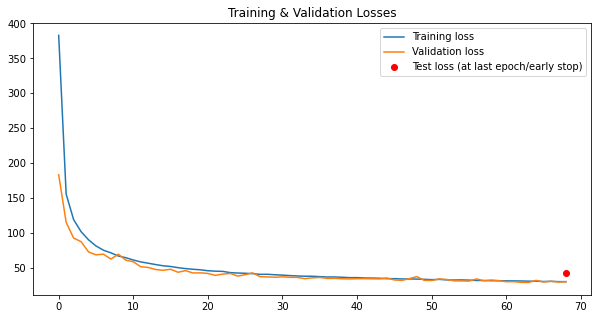

In [52]:
# Retrieves the data loader
train_loader = octmnist_noGDA[3]
val_loader = octmnist_noGDA[5]
test_loader = octmnist_noGDA[4]

# Runs the Joint VAE
octmnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="octmnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [53]:
# Creates a new data loader with the augmented data added to the already existing data
# 4% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_octmnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/octmnist/octmnist_epoch45.pth", 
    octmnist_noGDA[0], 128, octmnist_noGDA[4], octmnist_noGDA[5], 4000,
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OCTMNIST",
  "description": "The OCTMNIST is based on a prior dataset of 109,309 valid optical coherence tomography (OCT) images for retinal diseases. The dataset is comprised of 4 diagnosis categories, leading to a multi-class classification task. We split the source training set with a ratio of 9:1 into training and validation set, and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22121,536)\u00d7(277\u2212512). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/octmnist.npz?download=1",
  "MD5": "c68d92d5b585d8d81f7112f81e2d0842",
  "task": "multi-class",
  "label": {
    "0": "choroidal neovascularization",
    "1": "diabetic macular edema",
    "2": "drusen",
    "3": "normal"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 97477,
    "val": 10832,
    "test": 1000
  },
  "license": "CC BY 4.0"
}
--------------------------------

100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.45it/s]


train -- accuracy: 0.48
val -- accuracy: 0.95,  AUC: 0.83
Epoch 1



100%|███████████████████████████████████████| 1524/1524 [04:38<00:00,  5.47it/s]


train -- accuracy: 0.54
val -- accuracy: 0.96,  AUC: 0.86
Epoch 2



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.45it/s]


train -- accuracy: 0.55
val -- accuracy: 0.94,  AUC: 0.83
Epoch 3



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.44it/s]


train -- accuracy: 0.57
val -- accuracy: 0.97,  AUC: 0.88
Epoch 4



100%|███████████████████████████████████████| 1524/1524 [04:38<00:00,  5.47it/s]


train -- accuracy: 0.58
val -- accuracy: 0.97,  AUC: 0.87
Epoch 5



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.44it/s]


train -- accuracy: 0.58
val -- accuracy: 0.97,  AUC: 0.89
Epoch 6



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.45it/s]


train -- accuracy: 0.59
val -- accuracy: 0.97,  AUC: 0.87
Epoch 7



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.45it/s]


train -- accuracy: 0.59
val -- accuracy: 0.97,  AUC: 0.85
Epoch 8



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.45it/s]


train -- accuracy: 0.6
val -- accuracy: 0.97,  AUC: 0.91
Epoch 9



100%|███████████████████████████████████████| 1524/1524 [04:39<00:00,  5.45it/s]


train -- accuracy: 0.6
val -- accuracy: 0.97,  AUC: 0.91
test -- accuracy: 0.93,  AUC: 0.72


<Figure size 720x720 with 0 Axes>

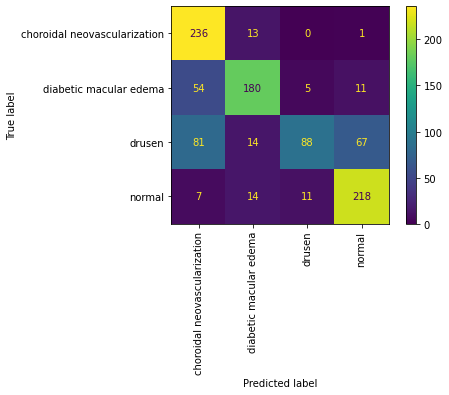

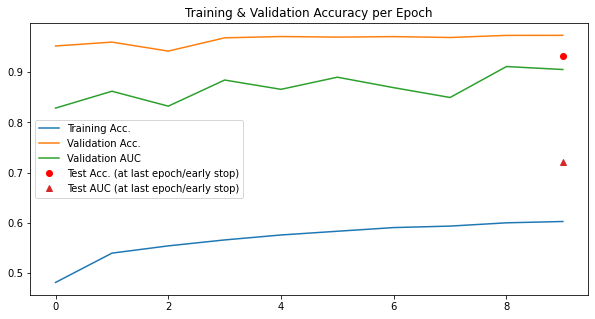

In [54]:
# Runs the classifier again 

clf_jointVAE_octmnist = run_classifier_pipeline("octmnist", info_flags, jointVAE_octmnist_loader)

### PneumoniaMNIST

#### Training the Joint VAE

In [55]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["pneumoniamnist"][0]["label"])
n_channels = info_flags["pneumoniamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(264351.1250, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8811.6416, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(372.6202, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 1521.5607841705607
Validation set loss: 995.912285
Train epoch 2 -- average loss: 628.3370617499469
Validation set loss: 493.543002
Train epoch 3 -- average loss: 435.0540677105459
Validation set loss: 413.767127
Train epoch 4 -- average loss: 357.1786864612096
Validation set loss: 350.009626
Train epoch 5 -- average loss: 304.00381000424807
Validation set loss: 326.915272
Train epoch 6 -- average loss: 281.9357422704705
Validation set loss: 265.853422
Train epoch 7 -- average loss: 258.12450093258815
Validation set loss: 228.62563
Train epoch 8 -- average loss: 239.7002309898046
Validati

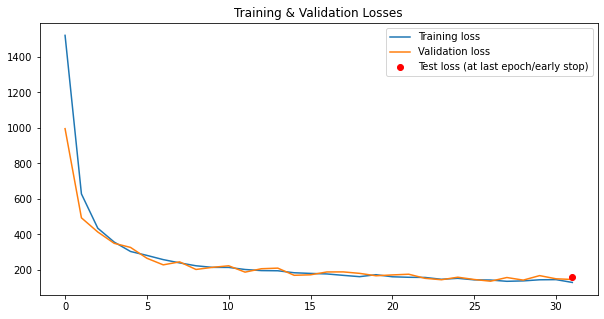

In [56]:
# Retrieves the data loader
train_loader = pneumoniamnist_noGDA[3]
val_loader = pneumoniamnist_noGDA[5]
test_loader = pneumoniamnist_noGDA[4]

# Runs the Joint VAE
pneumoniamnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="pneumoniamnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [57]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_pneumoniamnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/pneumoniamnist/pneumoniamnist_epoch27.pth", 
    pneumoniamnist_noGDA[0], 128, pneumoniamnist_noGDA[4], pneumoniamnist_noGDA[5], len(pneumoniamnist_noGDA[0])//10,)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "PneumoniaMNIST",
  "description": "The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22122,916)\u00d7(127\u22122,713). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/pneumoniamnist.npz?download=1",
  "MD5": "28209eda62fecd6e6a2d98b1501bb15f",
  "task": "binary-class",
  "label": {
    "0": "normal",
    "1": "pneumonia"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 4708,
    "val": 524,
    "test": 624
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           

100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.46it/s]


train -- accuracy: 0.67
val -- accuracy: 0.98,  AUC: 0.94
Epoch 1



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.51it/s]


train -- accuracy: 0.73
val -- accuracy: 0.99,  AUC: 0.88
Epoch 2



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.40it/s]


train -- accuracy: 0.73
val -- accuracy: 0.99,  AUC: 0.96
Epoch 3



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.46it/s]


train -- accuracy: 0.73
val -- accuracy: 0.99,  AUC: 0.97
Epoch 4



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.47it/s]


train -- accuracy: 0.74
val -- accuracy: 1.0,  AUC: 0.97
Epoch 5



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.46it/s]


train -- accuracy: 0.74
val -- accuracy: 1.0,  AUC: 0.97
Epoch 6



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.44it/s]


train -- accuracy: 0.74
val -- accuracy: 1.0,  AUC: 0.97
Epoch 7



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.47it/s]


train -- accuracy: 0.74
val -- accuracy: 1.0,  AUC: 0.98
Epoch 8



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.47it/s]


train -- accuracy: 0.75
val -- accuracy: 1.0,  AUC: 0.97
Epoch 9



100%|███████████████████████████████████████████| 74/74 [00:13<00:00,  5.46it/s]


train -- accuracy: 0.75
val -- accuracy: 1.0,  AUC: 0.98
test -- accuracy: 0.94,  AUC: 0.88


<Figure size 720x720 with 0 Axes>

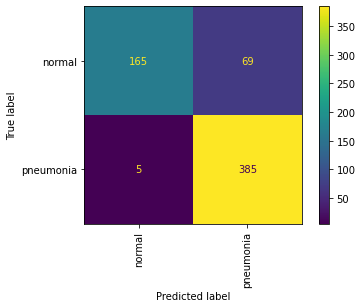

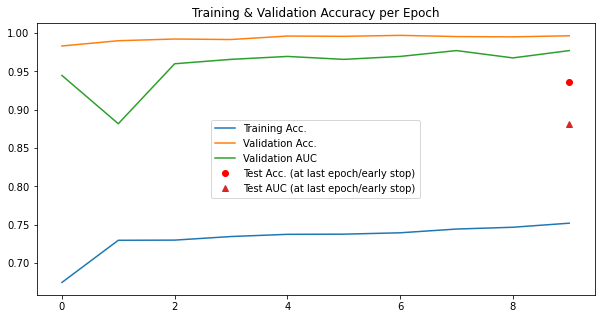

In [58]:
# Runs the classifier again 

clf_jointVAE_pneumoniamnist = run_classifier_pipeline("pneumoniamnist", info_flags, jointVAE_pneumoniamnist_loader)

### BreastMNIST

#### Training the Joint VAE

In [59]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["breastmnist"][0]["label"])
n_channels = info_flags["breastmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(263783.3750, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8792.7119, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(406.6277, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 7457.9796960851645
Validation set loss: 5156.128606
Train epoch 2 -- average loss: 2601.3732400412086
Validation set loss: 3936.864583
Train epoch 3 -- average loss: 2126.2819296588827
Validation set loss: 3574.364984
Train epoch 4 -- average loss: 1755.2381453182234
Validation set loss: 2964.654046
Train epoch 5 -- average loss: 1457.1000028617216
Validation set loss: 1791.483974
Train epoch 6 -- average loss: 1410.968242044414
Validation set loss: 1442.358173
Train epoch 7 -- average loss: 1268.2883828411173
Validation set loss: 1349.417768
Train epoch 8 -- average loss: 1167.3806948260

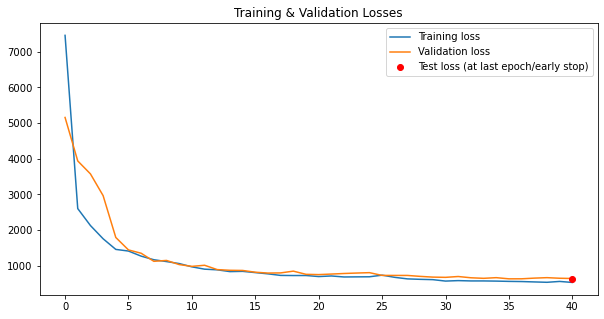

In [60]:
# Retrieves the data loader
train_loader = breastmnist_noGDA[3]
val_loader = breastmnist_noGDA[5]
test_loader = breastmnist_noGDA[4]

# Runs the Joint VAE
breastmnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="breastmnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [61]:
# Creates a new data loader with the augmented data added to the already existing data
# 3% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_breastmnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/breastmnist/breastmnist_epoch22.pth", 
    breastmnist_noGDA[0], 128, breastmnist_noGDA[4], breastmnist_noGDA[5], len(breastmnist_noGDA[0])//30,
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "BreastMNIST",
  "description": "The BreastMNIST is based on a dataset of 780 breast ultrasound images. It is categorized into 3 classes: normal, benign, and malignant. As we use low-resolution images, we simplify the task into binary classification by combining normal and benign as positive and classifying them against malignant as negative. We split the source dataset with a ratio of 7:1:2 into training, validation and test set. The source images of 1\u00d7500\u00d7500 are resized into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/breastmnist.npz?download=1",
  "MD5": "750601b1f35ba3300ea97c75c52ff8f6",
  "task": "binary-class",
  "label": {
    "0": "malignant",
    "1": "normal, benign"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 546,
    "val": 78,
    "test": 156
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
    

100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.58it/s]


train -- accuracy: 0.52
val -- accuracy: 0.62,  AUC: 0.69
Epoch 1



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.72it/s]


train -- accuracy: 0.6
val -- accuracy: 0.68,  AUC: 0.27
Epoch 2



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.57it/s]


train -- accuracy: 0.63
val -- accuracy: 0.79,  AUC: 0.33
Epoch 3



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.70it/s]


train -- accuracy: 0.6
val -- accuracy: 0.82,  AUC: 0.38
Epoch 4



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.68it/s]


train -- accuracy: 0.63
val -- accuracy: 0.83,  AUC: 0.78
Epoch 5



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.76it/s]


train -- accuracy: 0.65
val -- accuracy: 0.86,  AUC: 0.73
Epoch 6



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.90it/s]


train -- accuracy: 0.67
val -- accuracy: 0.88,  AUC: 0.76
Epoch 7



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.79it/s]


train -- accuracy: 0.67
val -- accuracy: 0.9,  AUC: 0.83
Epoch 8



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.76it/s]


train -- accuracy: 0.71
val -- accuracy: 0.9,  AUC: 0.87
Epoch 9



100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  5.41it/s]


train -- accuracy: 0.72
val -- accuracy: 0.89,  AUC: 0.81
test -- accuracy: 0.86,  AUC: 0.73


<Figure size 720x720 with 0 Axes>

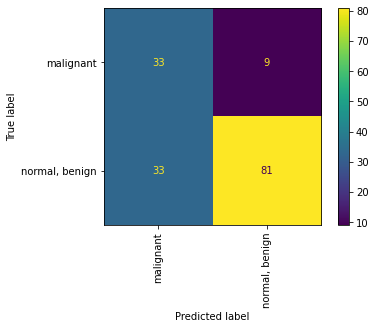

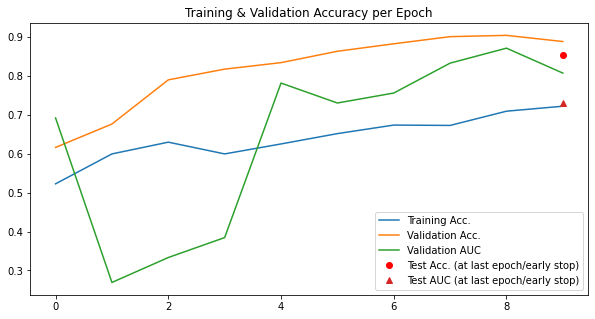

In [62]:
# Runs the classifier again 

clf_jointVAE_breastmnist = run_classifier_pipeline("breastmnist", info_flags, jointVAE_breastmnist_loader)

### OrganAMNIST

#### Training the Joint VAE

In [63]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organamnist"][0]["label"])
n_channels = info_flags["organamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(256501.0469, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8549.9717, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(378.3017, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 3302.5513562134915
Validation set loss: 2871.551605
Train epoch 2 -- average loss: 2085.1642513681645
Validation set loss: 2240.098025
Train epoch 3 -- average loss: 1761.4872350197725
Validation set loss: 2082.45078
Train epoch 4 -- average loss: 1582.6451391976448
Validation set loss: 1905.214778
Train epoch 5 -- average loss: 1484.0297775738484
Validation set loss: 1828.025478
Train epoch 6 -- average loss: 1391.8701727917787
Validation set loss: 1809.797337
Train epoch 7 -- average loss: 1339.8303014457904
Validation set loss: 1784.534813
Train epoch 8 -- average loss: 1284.2862748307

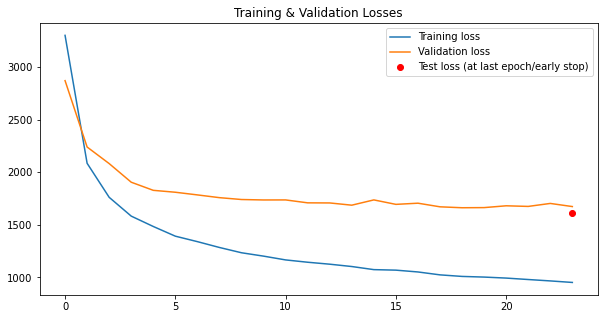

In [64]:
# Retrieves the data loader
train_loader = organamnist_noGDA[3]
val_loader = organamnist_noGDA[5]
test_loader = organamnist_noGDA[4]

# Runs the Joint VAE
organamnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="organamnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [65]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_organamnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/organamnist/organamnist_epoch32.pth", 
    organamnist_noGDA[0], 128, organamnist_noGDA[4], organamnist_noGDA[5], len(organamnist_noGDA[0])//10,
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganAMNIST",
  "description": "The OrganAMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Axial (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in axial views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organamnist.npz?download=1",
  "MD5": "866b832ed4eeba67bfb9edee1d5544e6",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-left",

100%|█████████████████████████████████████████| 541/541 [01:56<00:00,  4.66it/s]


train -- accuracy: 0.41
val -- accuracy: 1.0,  AUC: 0.95
Epoch 1



100%|█████████████████████████████████████████| 541/541 [01:56<00:00,  4.63it/s]


train -- accuracy: 0.51
val -- accuracy: 1.0,  AUC: 0.96
Epoch 2



100%|█████████████████████████████████████████| 541/541 [01:58<00:00,  4.57it/s]


train -- accuracy: 0.52
val -- accuracy: 1.0,  AUC: 0.96
Epoch 3



100%|█████████████████████████████████████████| 541/541 [01:54<00:00,  4.72it/s]


train -- accuracy: 0.53
val -- accuracy: 1.0,  AUC: 0.95
Epoch 4



100%|█████████████████████████████████████████| 541/541 [01:52<00:00,  4.79it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.97
Epoch 5



100%|█████████████████████████████████████████| 541/541 [01:53<00:00,  4.75it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.96
Epoch 6



100%|█████████████████████████████████████████| 541/541 [01:51<00:00,  4.84it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.97
Epoch 7



100%|█████████████████████████████████████████| 541/541 [01:52<00:00,  4.79it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.97
Epoch 8



100%|█████████████████████████████████████████| 541/541 [01:54<00:00,  4.74it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.97
Epoch 9



100%|█████████████████████████████████████████| 541/541 [01:50<00:00,  4.88it/s]


train -- accuracy: 0.54
val -- accuracy: 1.0,  AUC: 0.97
test -- accuracy: 0.99,  AUC: 0.89


<Figure size 720x720 with 0 Axes>

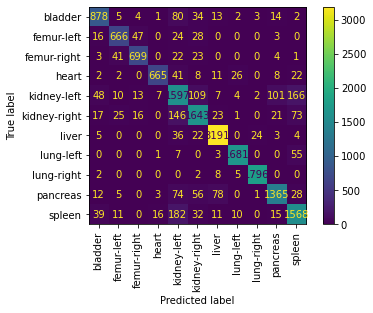

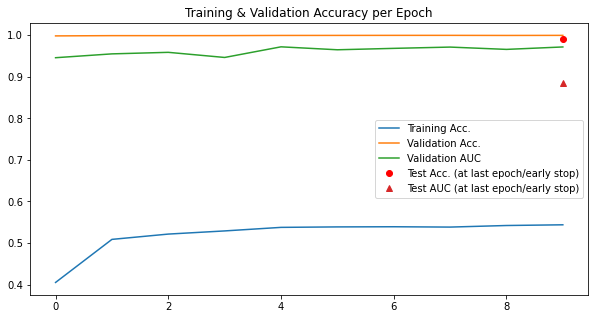

In [66]:
# Runs the classifier again 

clf_jointVAE_organamnist = run_classifier_pipeline("organamnist", info_flags, jointVAE_organamnist_loader)

### OrganCMNIST

#### Training the Joint VAE

In [67]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organcmnist"][0]["label"])
n_channels = info_flags["organcmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(268259.8125, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8941.9277, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(391.8123, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 4113.583733173077
Validation set loss: 3119.897157
Train epoch 2 -- average loss: 2676.61871875
Validation set loss: 2757.917616
Train epoch 3 -- average loss: 2237.6936358173075
Validation set loss: 2330.839903
Train epoch 4 -- average loss: 2029.9245564903847
Validation set loss: 2182.192478
Train epoch 5 -- average loss: 1862.1018701923076
Validation set loss: 2097.036737
Train epoch 6 -- average loss: 1757.1715168269232
Validation set loss: 2026.406929
Train epoch 7 -- average loss: 1681.9872175480768
Validation set loss: 1939.704026
Train epoch 8 -- average loss: 1614.9598804086538
V

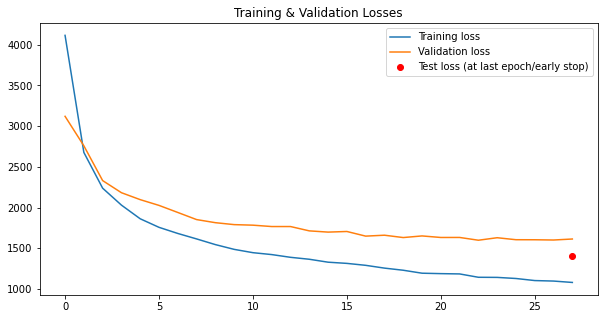

In [68]:
# Retrieves the data loader
train_loader = organcmnist_noGDA[3]
val_loader = organcmnist_noGDA[5]
test_loader = organcmnist_noGDA[4]

# Runs the Joint VAE
organcmnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims, 
    epochs=epochs, 
    name_dataset="organcmnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [69]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_organcmnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/organcmnist/organcmnist_epoch36.pth", 
    organcmnist_noGDA[0], 128, organcmnist_noGDA[4], organcmnist_noGDA[5], len(organcmnist_noGDA[0])//10,
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganCMNIST",
  "description": "The OrganCMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Coronal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in coronal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organcmnist.npz?download=1",
  "MD5": "0afa5834fb105f7705a7d93372119a21",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-le

100%|█████████████████████████████████████████| 204/204 [00:42<00:00,  4.78it/s]


train -- accuracy: 0.3
val -- accuracy: 0.97,  AUC: 0.72
Epoch 1



100%|█████████████████████████████████████████| 204/204 [00:42<00:00,  4.75it/s]


train -- accuracy: 0.44
val -- accuracy: 0.99,  AUC: 0.87
Epoch 2



100%|█████████████████████████████████████████| 204/204 [00:42<00:00,  4.77it/s]


train -- accuracy: 0.48
val -- accuracy: 1.0,  AUC: 0.95
Epoch 3



100%|█████████████████████████████████████████| 204/204 [00:43<00:00,  4.74it/s]


train -- accuracy: 0.5
val -- accuracy: 1.0,  AUC: 0.95
Epoch 4



100%|█████████████████████████████████████████| 204/204 [00:43<00:00,  4.70it/s]


train -- accuracy: 0.5
val -- accuracy: 1.0,  AUC: 0.93
Epoch 5



100%|█████████████████████████████████████████| 204/204 [00:42<00:00,  4.79it/s]


train -- accuracy: 0.51
val -- accuracy: 1.0,  AUC: 0.93
Epoch 6



100%|█████████████████████████████████████████| 204/204 [00:41<00:00,  4.91it/s]


train -- accuracy: 0.52
val -- accuracy: 1.0,  AUC: 0.96
Epoch 7



100%|█████████████████████████████████████████| 204/204 [00:40<00:00,  5.03it/s]


train -- accuracy: 0.52
val -- accuracy: 1.0,  AUC: 0.92
Epoch 8



100%|█████████████████████████████████████████| 204/204 [00:42<00:00,  4.77it/s]


train -- accuracy: 0.53
val -- accuracy: 1.0,  AUC: 0.95
Epoch 9



100%|█████████████████████████████████████████| 204/204 [00:42<00:00,  4.76it/s]


train -- accuracy: 0.53
val -- accuracy: 1.0,  AUC: 0.94
test -- accuracy: 0.98,  AUC: 0.85


<Figure size 720x720 with 0 Axes>

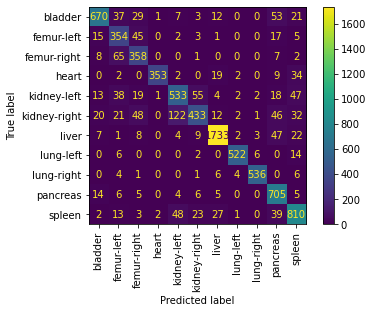

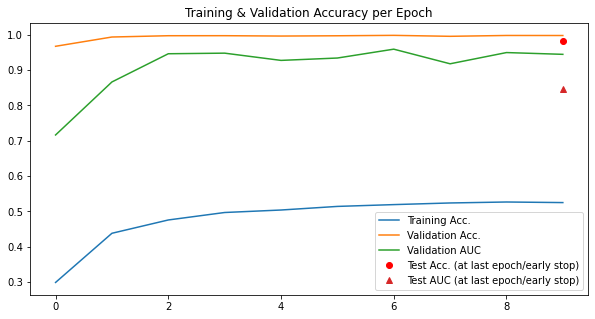

In [70]:
# Runs the classifier again 

clf_jointVAE_organcmnist = run_classifier_pipeline("organcmnist", info_flags, jointVAE_organcmnist_loader)

### OrganSMNIST

#### Training the Joint VAE

In [71]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organsmnist"][0]["label"])
n_channels = info_flags["organsmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 100
categorical_dims = 50
epochs = 200

Testing Joint Variational Autoencoder:
Clearing CUDA Pytorch Cache
Model Output size: torch.Size([10, 1, 28, 28])
Forward pass test:  True
{'loss': tensor(260094.3281, grad_fn=<AddBackward0>), 'Reconstruction_Loss': tensor(8669.7461, grad_fn=<MseLossBackward0>), 'Capacity_Loss': tensor(390.1693, grad_fn=<AddBackward0>)}
Loss test:  True
Cuda device:  cuda
Training phase:
Train epoch 1 -- average loss: 4140.430194135581
Validation set loss: 3253.965373
Train epoch 2 -- average loss: 2572.5615786406024
Validation set loss: 2542.267932
Train epoch 3 -- average loss: 2106.275761074247
Validation set loss: 2173.377791
Train epoch 4 -- average loss: 1935.7330938396701
Validation set loss: 2040.958771
Train epoch 5 -- average loss: 1783.6870056940459
Validation set loss: 1974.47098
Train epoch 6 -- average loss: 1700.8972022955525
Validation set loss: 1853.47474
Train epoch 7 -- average loss: 1617.378293131277
Validation set loss: 1915.67264
Train epoch 8 -- average loss: 1530.0740214759685
V

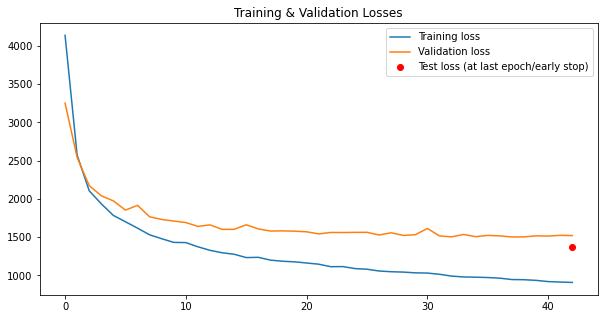

In [72]:
# Retrieves the data loader
train_loader = organsmnist_noGDA[3]
val_loader = organsmnist_noGDA[5]
test_loader = organsmnist_noGDA[4]

# Runs the Joint VAE
organsmnist_jointVAE_model, training_losses, validation_losses, test_loss = run_encoder_pipeline(
    train_loader, val_loader, test_loader,  
    n_channels, latent_dims, categorical_dims=categorical_dims,
    epochs=epochs, 
    name_dataset="organsmnist", 
    output_intermediary_info=False,
    model_type="JointVAE"
)

#### Generating an upgraded dataset

In [73]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

jointVAE_organsmnist_loader = generate_augmented_dataset_jointVAE(
    n_channels, latent_dims, categorical_dims,
    "trained_models/JointVAE/organsmnist/organsmnist_epoch28.pth", 
    organsmnist_noGDA[0], 128, organsmnist_noGDA[4], organsmnist_noGDA[5], len(organsmnist_noGDA[0])//10,
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganSMNIST",
  "description": "The OrganSMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Sagittal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in sagittal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organsmnist.npz?download=1",
  "MD5": "e5c39f1af030238290b9557d9503af9d",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-

100%|█████████████████████████████████████████| 218/218 [00:46<00:00,  4.70it/s]


train -- accuracy: 0.25
val -- accuracy: 0.94,  AUC: 0.56
Epoch 1



100%|█████████████████████████████████████████| 218/218 [00:46<00:00,  4.73it/s]


train -- accuracy: 0.37
val -- accuracy: 0.98,  AUC: 0.78
Epoch 2



100%|█████████████████████████████████████████| 218/218 [00:46<00:00,  4.67it/s]


train -- accuracy: 0.41
val -- accuracy: 0.99,  AUC: 0.8
Epoch 3



100%|█████████████████████████████████████████| 218/218 [00:46<00:00,  4.74it/s]


train -- accuracy: 0.43
val -- accuracy: 0.99,  AUC: 0.76
Epoch 4



100%|█████████████████████████████████████████| 218/218 [00:45<00:00,  4.78it/s]


train -- accuracy: 0.44
val -- accuracy: 0.99,  AUC: 0.8
Epoch 5



100%|█████████████████████████████████████████| 218/218 [00:46<00:00,  4.74it/s]


train -- accuracy: 0.45
val -- accuracy: 0.99,  AUC: 0.84
Epoch 6



100%|█████████████████████████████████████████| 218/218 [00:45<00:00,  4.76it/s]


train -- accuracy: 0.46
val -- accuracy: 0.99,  AUC: 0.83
Epoch 7



100%|█████████████████████████████████████████| 218/218 [00:45<00:00,  4.83it/s]


train -- accuracy: 0.48
val -- accuracy: 0.99,  AUC: 0.86
Epoch 8



100%|█████████████████████████████████████████| 218/218 [00:45<00:00,  4.79it/s]


train -- accuracy: 0.48
val -- accuracy: 0.99,  AUC: 0.86
Epoch 9



100%|█████████████████████████████████████████| 218/218 [00:45<00:00,  4.79it/s]


train -- accuracy: 0.5
val -- accuracy: 0.99,  AUC: 0.84
test -- accuracy: 0.96,  AUC: 0.7


<Figure size 720x720 with 0 Axes>

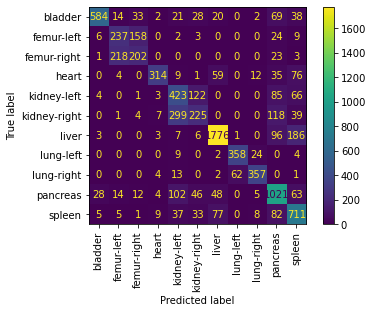

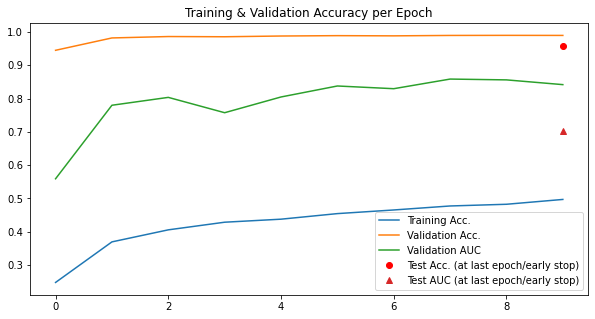

In [74]:
# Runs the classifier again 

clf_jointVAE_organsmnist = run_classifier_pipeline("organsmnist", info_flags, jointVAE_organsmnist_loader)

## 6. Training a Conditional GAN for Data Augmentation and Retraining the Classifier with an Augmented Dataset

### Reloading the dataset, upscaled for the GAN

Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pathmnist.npz
Montage of randomly extracted images from the dataset:


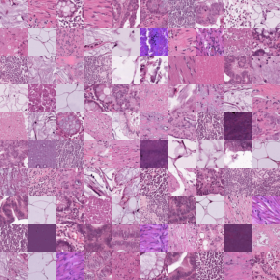

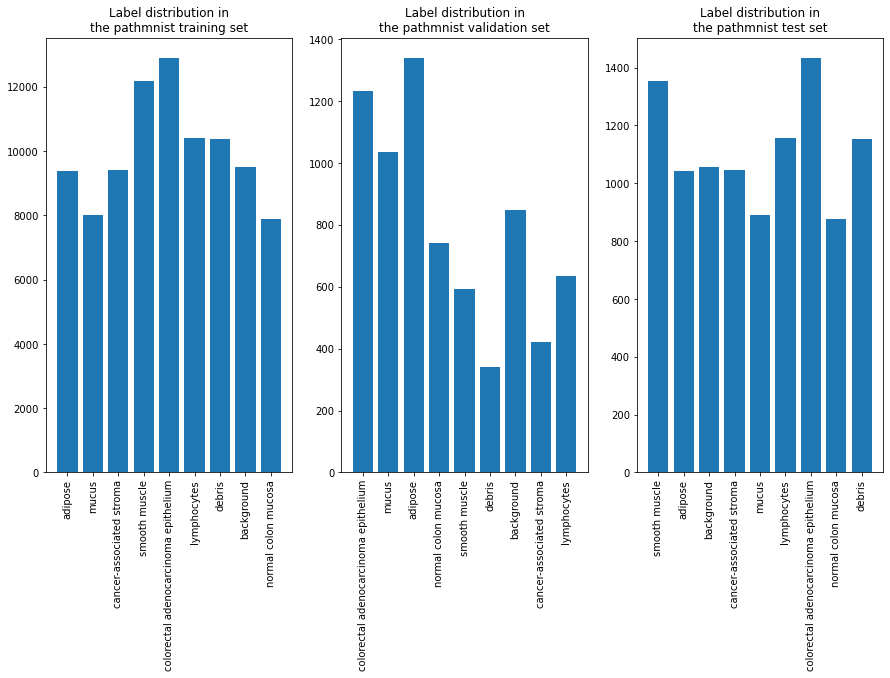

In [45]:
pathmnist = import_dataset("pathmnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/dermamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/dermamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/dermamnist.npz
Montage of randomly extracted images from the dataset:


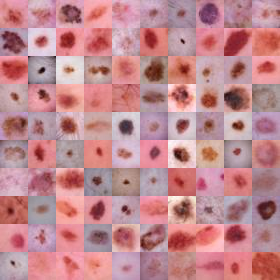

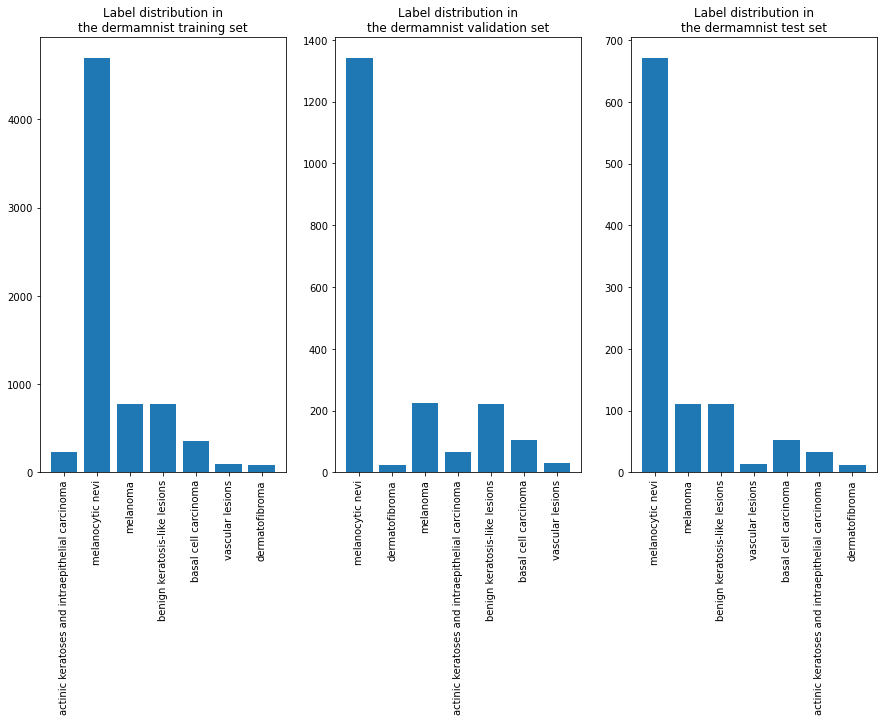

In [46]:
dermamnist = import_dataset("dermamnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/octmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/octmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/octmnist.npz
Montage of randomly extracted images from the dataset:


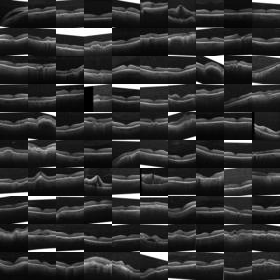

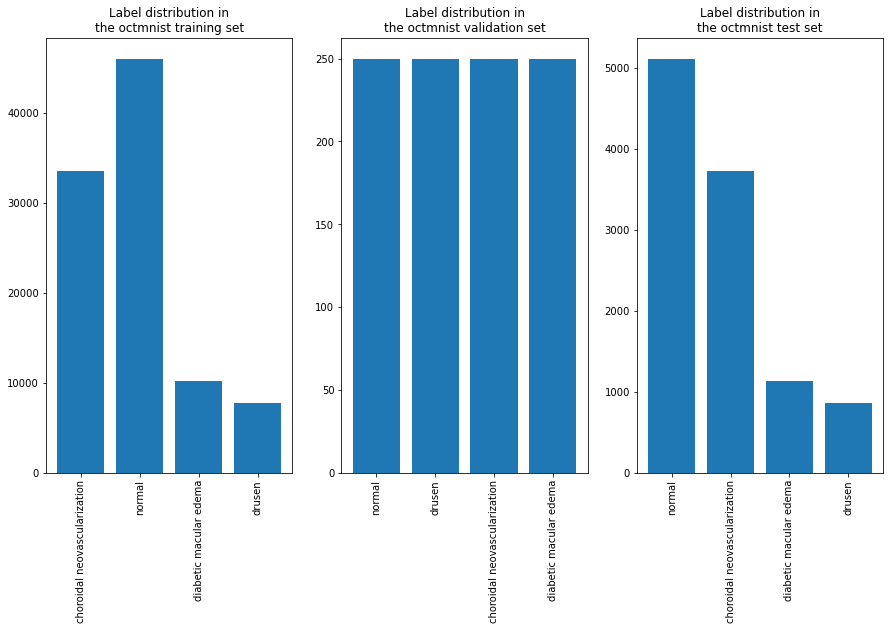

In [47]:
octmnist = import_dataset("octmnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/pneumoniamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pneumoniamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/pneumoniamnist.npz
Montage of randomly extracted images from the dataset:


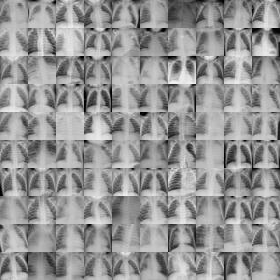

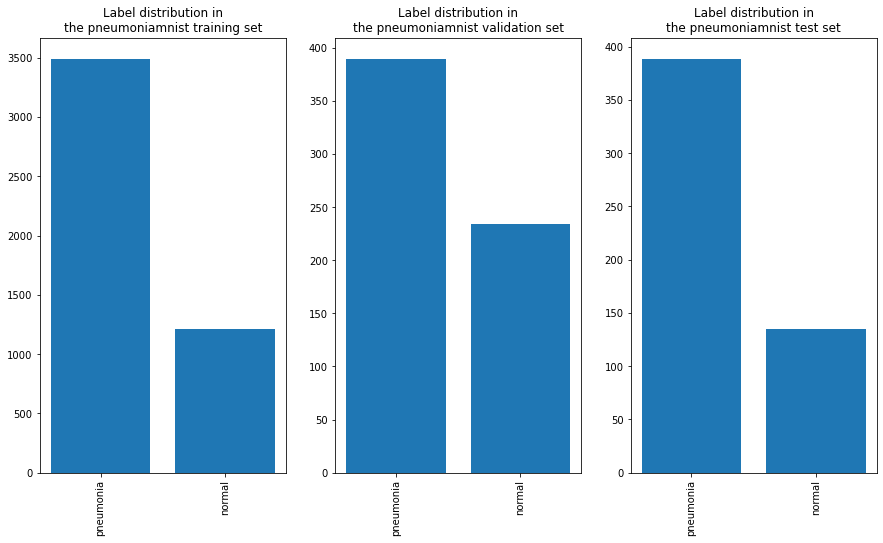

In [48]:
pneumoniamnist = import_dataset("pneumoniamnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/breastmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/breastmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/breastmnist.npz
Montage of randomly extracted images from the dataset:


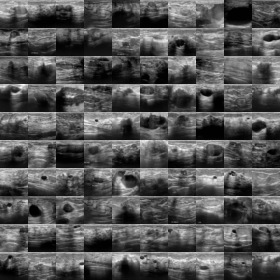

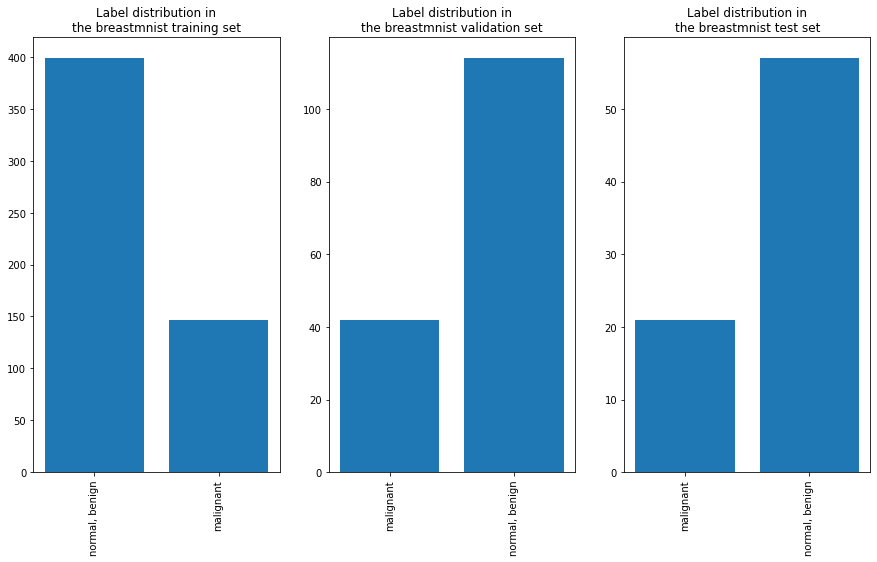

In [49]:
breastmnist = import_dataset("breastmnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/organamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organamnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organamnist.npz
Montage of randomly extracted images from the dataset:


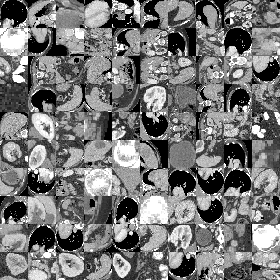

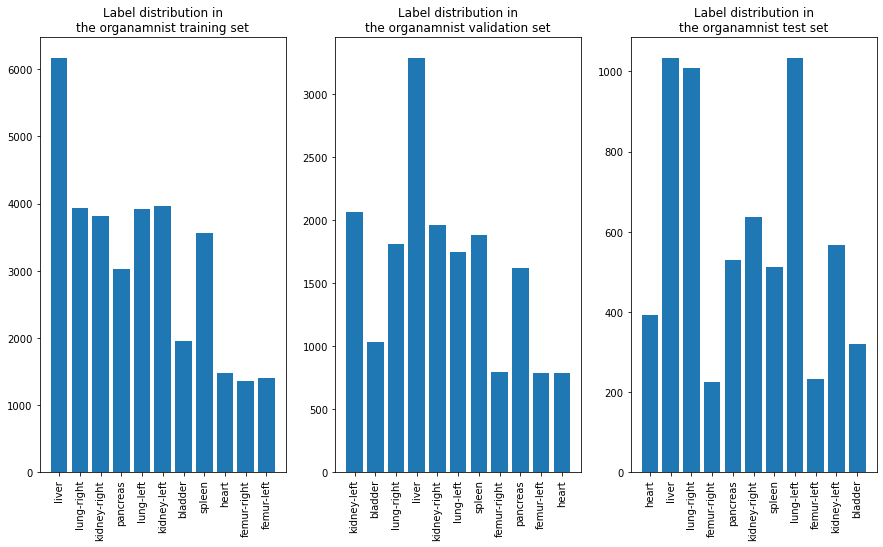

In [50]:
organamnist = import_dataset("organamnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/organcmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organcmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organcmnist.npz
Montage of randomly extracted images from the dataset:


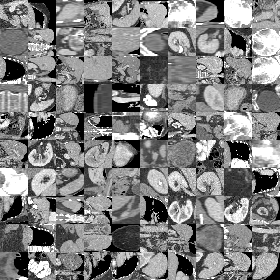

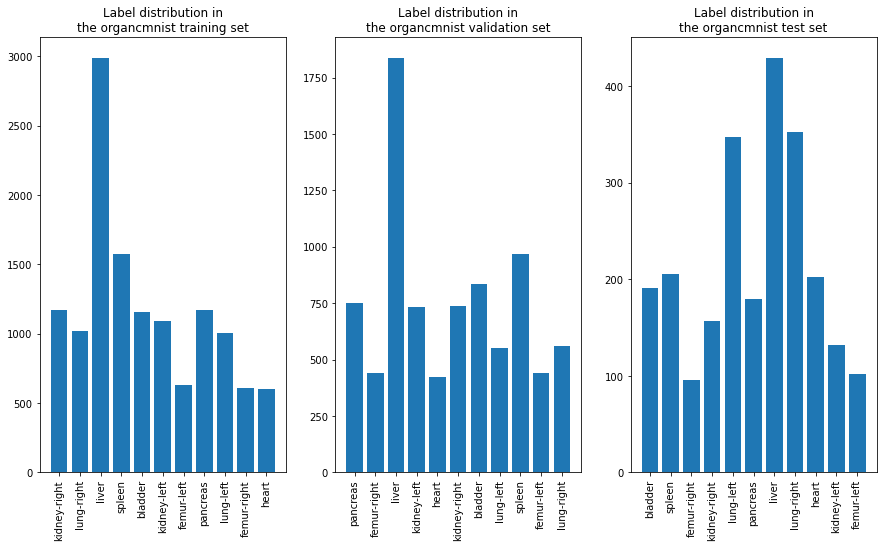

In [51]:
organcmnist = import_dataset("organcmnist", info_flags, upscale=True)

Using downloaded and verified file: /home/quentin/.medmnist/organsmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organsmnist.npz
Using downloaded and verified file: /home/quentin/.medmnist/organsmnist.npz
Montage of randomly extracted images from the dataset:


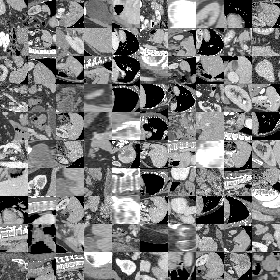

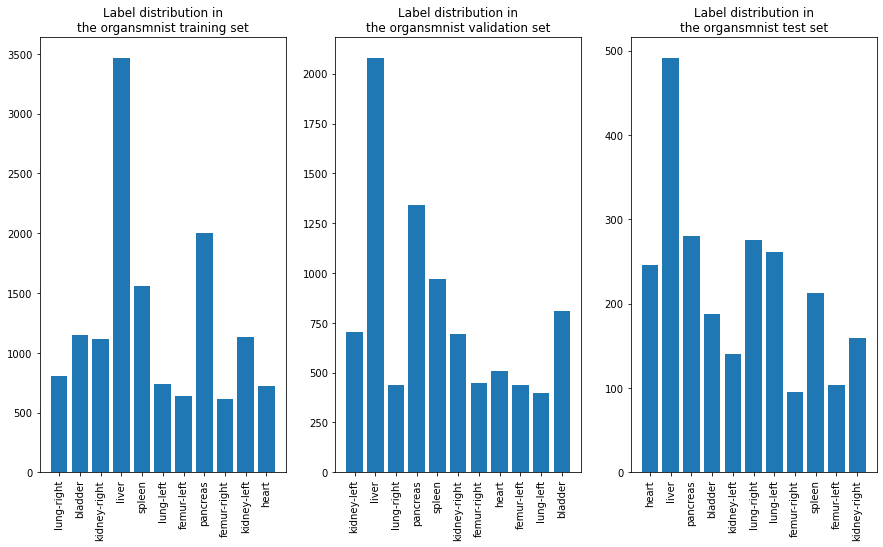

In [52]:
organsmnist = import_dataset("organsmnist", info_flags, upscale=True)

### PathMNIST

#### Training the Joint VAE

In [22]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["pathmnist"][0]["label"])
n_channels = info_flags["pathmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Epoch 1 of 50


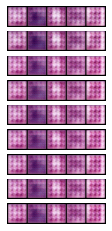

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 79.98776745796204 , Gen Loss: 2.858908833448153 Disc Loss: 0.31361511032434775
Epoch 2 of 50


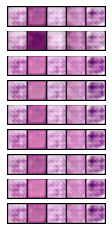

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 72.80177021026611 , Gen Loss: 2.0840362002200097 Disc Loss: 0.40568656350004445
Epoch 3 of 50


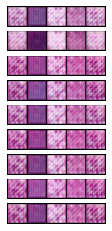

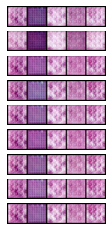

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 72.93889570236206 , Gen Loss: 1.9463321633739277 Disc Loss: 0.4113998382567003
Epoch 4 of 50


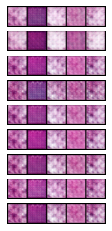

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_4.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_4.pth
Epoch: 4, Duration: 80.05287456512451 , Gen Loss: 1.8679602774012178 Disc Loss: 0.3692429732988133
Epoch 5 of 50


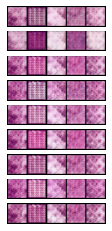

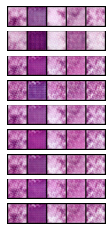

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_5.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_5.pth
Epoch: 5, Duration: 73.38825225830078 , Gen Loss: 1.9462427496777635 Disc Loss: 0.35403153334592646
Epoch 6 of 50


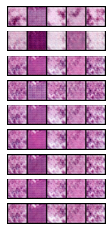

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_6.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_6.pth
Epoch: 6, Duration: 72.96181106567383 , Gen Loss: 1.8873198183808169 Disc Loss: 0.37204544160296016
Epoch 7 of 50


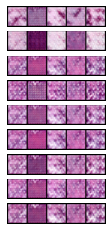

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_7.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_7.pth
Epoch: 7, Duration: 72.64621829986572 , Gen Loss: 1.9193625619471977 Disc Loss: 0.36076625106949195
Epoch 8 of 50


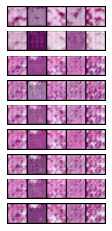

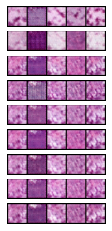

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_8.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_8.pth
Epoch: 8, Duration: 84.3306074142456 , Gen Loss: 1.9497979424085514 Disc Loss: 0.3529894080361905
Epoch 9 of 50


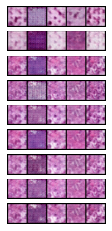

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_9.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_9.pth
Epoch: 9, Duration: 85.05616331100464 , Gen Loss: 1.9769786643295257 Disc Loss: 0.3412120182772012
Epoch 10 of 50


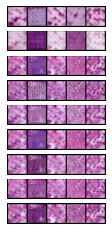

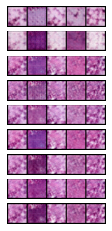

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_10.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_10.pth
Epoch: 10, Duration: 85.72216749191284 , Gen Loss: 2.034865785701587 Disc Loss: 0.3391514015206231
Epoch 11 of 50


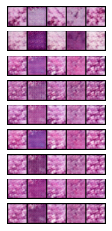

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_11.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_11.pth
Epoch: 11, Duration: 85.26734256744385 , Gen Loss: 2.1249612830014666 Disc Loss: 0.3327993613952287
Epoch 12 of 50


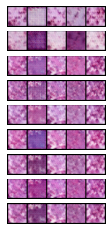

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_12.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_12.pth
Epoch: 12, Duration: 85.1571114063263 , Gen Loss: 2.105864948164363 Disc Loss: 0.3345356147773234
Epoch 13 of 50


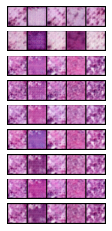

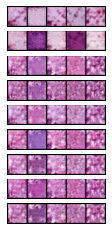

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_13.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_13.pth
Epoch: 13, Duration: 86.55284476280212 , Gen Loss: 2.072670417296324 Disc Loss: 0.3352677002658451
Epoch 14 of 50


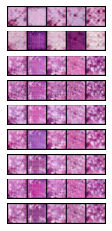

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_14.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_14.pth
Epoch: 14, Duration: 85.09950518608093 , Gen Loss: 2.1012751608404816 Disc Loss: 0.32821558562324993
Epoch 15 of 50


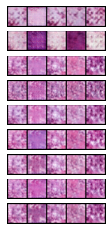

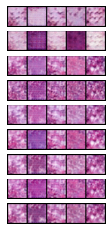

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_15.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_15.pth
Epoch: 15, Duration: 84.2238826751709 , Gen Loss: 2.1017026103937955 Disc Loss: 0.3328861708089804
Epoch 16 of 50


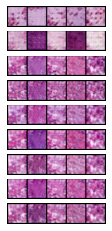

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_16.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_16.pth
Epoch: 16, Duration: 86.8068916797638 , Gen Loss: 2.084360172952131 Disc Loss: 0.3372840225190564
Epoch 17 of 50


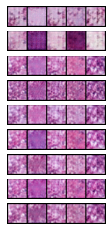

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_17.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_17.pth
Epoch: 17, Duration: 84.62216877937317 , Gen Loss: 2.0551988074469976 Disc Loss: 0.3458834715570692
Epoch 18 of 50


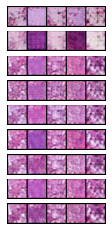

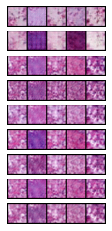

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_18.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_18.pth
Epoch: 18, Duration: 85.04128742218018 , Gen Loss: 2.034135892150762 Disc Loss: 0.34789944657262545
Epoch 19 of 50


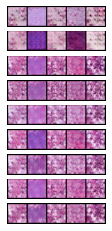

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_19.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_19.pth
Epoch: 19, Duration: 84.82778859138489 , Gen Loss: 2.0164293760278236 Disc Loss: 0.3504233217656896
Epoch 20 of 50


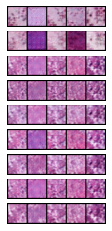

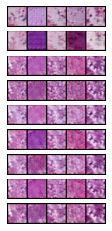

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_20.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_20.pth
Epoch: 20, Duration: 86.51375651359558 , Gen Loss: 2.0106440494577535 Disc Loss: 0.35036772033618163
Epoch 21 of 50


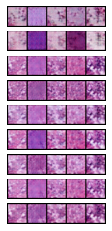

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_21.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_21.pth
Epoch: 21, Duration: 85.29847073554993 , Gen Loss: 2.0213436569403083 Disc Loss: 0.3496343327064536
Epoch 22 of 50


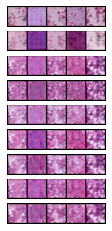

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_22.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_22.pth
Epoch: 22, Duration: 84.91634368896484 , Gen Loss: 1.9990124561091605 Disc Loss: 0.3553815499438864
Epoch 23 of 50


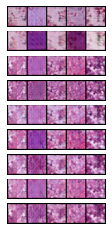

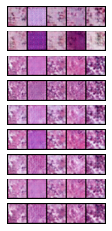

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_23.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_23.pth
Epoch: 23, Duration: 85.95407462120056 , Gen Loss: 2.0197741427396774 Disc Loss: 0.35464562313880615
Epoch 24 of 50


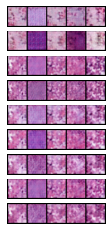

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_24.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_24.pth
Epoch: 24, Duration: 86.6671051979065 , Gen Loss: 2.0172514611760524 Disc Loss: 0.3529115616944086
Epoch 25 of 50


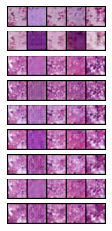

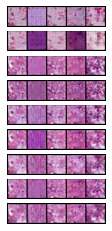

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_25.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_25.pth
Epoch: 25, Duration: 86.89028096199036 , Gen Loss: 2.0404011011600516 Disc Loss: 0.35073685566580737
Epoch 26 of 50


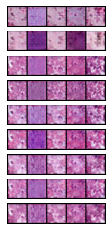

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_26.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_26.pth
Epoch: 26, Duration: 86.09647679328918 , Gen Loss: 2.02420524245522 Disc Loss: 0.35484734651401173
Epoch 27 of 50


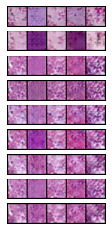

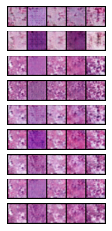

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_27.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_27.pth
Epoch: 27, Duration: 87.80009841918945 , Gen Loss: 2.0469175366127383 Disc Loss: 0.35545657497972133
Epoch 28 of 50


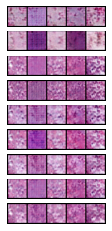

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 86.24923372268677 , Gen Loss: 2.0424039679541313 Disc Loss: 0.3573142747316547
Epoch 29 of 50


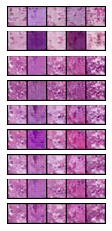

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 86.00664353370667 , Gen Loss: 2.0665017403551267 Disc Loss: 0.35870507005172453
Epoch 30 of 50


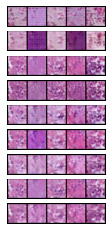

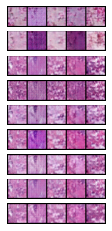

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 84.77067852020264 , Gen Loss: 2.0496678324592206 Disc Loss: 0.36133988767556335
Epoch 31 of 50


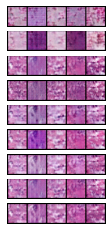

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_31.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_31.pth
Epoch: 31, Duration: 73.02020025253296 , Gen Loss: 2.063018599437753 Disc Loss: 0.35793196711520514
Epoch 32 of 50


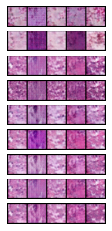

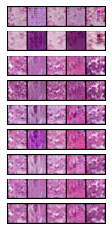

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_32.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_32.pth
Epoch: 32, Duration: 74.0779664516449 , Gen Loss: 2.14969901440064 Disc Loss: 0.34807901184497086
Epoch 33 of 50


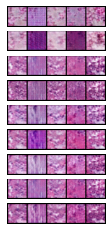

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_33.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_33.pth
Epoch: 33, Duration: 72.6629753112793 , Gen Loss: 2.126689484810436 Disc Loss: 0.3503059337359438
Epoch 34 of 50


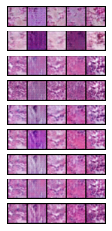

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_34.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_34.pth
Epoch: 34, Duration: 72.48361802101135 , Gen Loss: 2.089254140461798 Disc Loss: 0.3546296285043224
Epoch 35 of 50


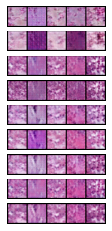

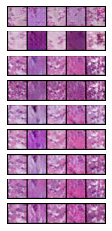

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_35.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_35.pth
Epoch: 35, Duration: 73.13138127326965 , Gen Loss: 2.0730011611627184 Disc Loss: 0.3576744035846038
Epoch 36 of 50


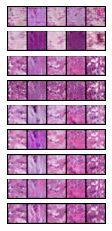

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_36.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_36.pth
Epoch: 36, Duration: 72.90416860580444 , Gen Loss: 2.0638609979887996 Disc Loss: 0.356773278465154
Epoch 37 of 50


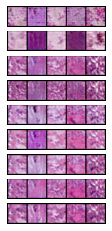

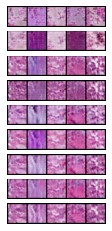

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_37.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_37.pth
Epoch: 37, Duration: 72.96434688568115 , Gen Loss: 2.0780822897684343 Disc Loss: 0.35965565483465933
Epoch 38 of 50


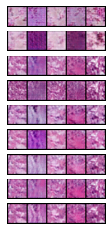

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_38.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_38.pth
Epoch: 38, Duration: 72.80259418487549 , Gen Loss: 2.0763379414085072 Disc Loss: 0.3573829192755789
Epoch 39 of 50


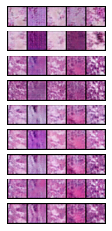

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_39.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_39.pth
Epoch: 39, Duration: 72.77582573890686 , Gen Loss: 2.073545282568114 Disc Loss: 0.36011461620516466
Epoch 40 of 50


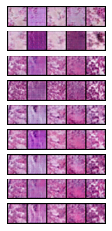

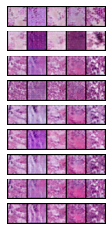

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_40.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_40.pth
Epoch: 40, Duration: 72.9213719367981 , Gen Loss: 2.086498462431664 Disc Loss: 0.36154495321319835
Epoch 41 of 50


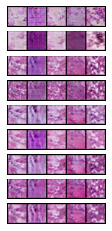

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_41.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_41.pth
Epoch: 41, Duration: 72.63888740539551 , Gen Loss: 2.0450915874038844 Disc Loss: 0.3639160655404129
Epoch 42 of 50


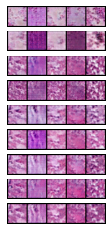

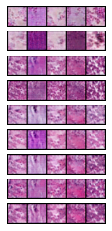

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_42.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_42.pth
Epoch: 42, Duration: 73.35431742668152 , Gen Loss: 2.0617489249522203 Disc Loss: 0.36167586180913597
Epoch 43 of 50


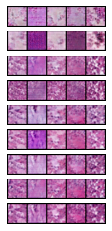

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_43.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_43.pth
Epoch: 43, Duration: 72.4897050857544 , Gen Loss: 2.136019066125161 Disc Loss: 0.3576163063844504
Epoch 44 of 50


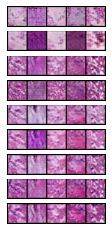

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_44.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_44.pth
Epoch: 44, Duration: 72.52911257743835 , Gen Loss: 2.092872704064625 Disc Loss: 0.36235861784829326
Epoch 45 of 50


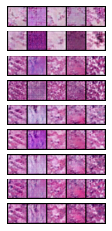

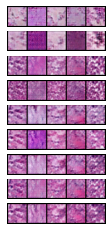

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_45.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_45.pth
Epoch: 45, Duration: 72.73000311851501 , Gen Loss: 2.150359981276946 Disc Loss: 0.3559643015384017
Epoch 46 of 50


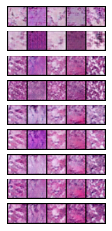

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_46.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_46.pth
Epoch: 46, Duration: 72.49505186080933 , Gen Loss: 2.0729325817258544 Disc Loss: 0.36837184083181473
Epoch 47 of 50


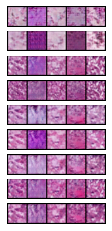

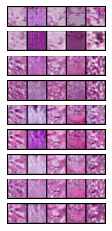

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_47.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_47.pth
Epoch: 47, Duration: 76.44162821769714 , Gen Loss: 2.0538489210631585 Disc Loss: 0.3663981420007556
Epoch 48 of 50


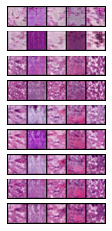

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_48.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_48.pth
Epoch: 48, Duration: 77.89131712913513 , Gen Loss: 2.0831622030423573 Disc Loss: 0.3648061007572559
Epoch 49 of 50


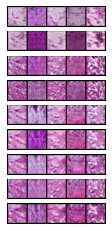

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_49.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_49.pth
Epoch: 49, Duration: 73.37147235870361 , Gen Loss: 2.045498202697898 Disc Loss: 0.3674588662273879
Epoch 50 of 50


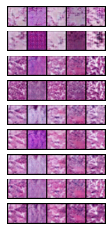

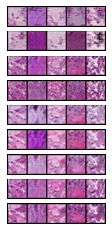

New Generator model saved at trained_models/conditionalGAN/pathmnist/gen_models/gen_model_50.pth
New Discriminator model saved at trained_models/conditionalGAN/pathmnist/disc_models/disc_model_50.pth
Epoch: 50, Duration: 72.94001364707947 , Gen Loss: 1.9976236791079605 Disc Loss: 0.3709286818997511


In [23]:
# Retrieves the data loader
train_loader = pathmnist[3]
val_loader = pathmnist[5]
test_loader = pathmnist[4]

# Runs the Cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="pathmnist"
)

#### Generating an upgraded dataset

In [54]:
# Creates a new data loader with the augmented data added to the already existing data
# 4% generated data was added, with weights corresponding to the rarity of the class 

condGAN_pathmnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/pathmnist/gen_models/gen_model_50.pth",
    pathmnist[0], 128, pathmnist[4], pathmnist[5], 4000
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "PathMNIST",
  "description": "The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3\u00d7224\u00d7224 into 3\u00d728\u00d728, and split NCT-CRC-HE-100K into training and validation set with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/pathmnist.npz?download=1",
  "MD5": "a8b06965200029087d5bd730944a56c1",
  "task": "multi-class",
  "label": {
    "0": "adipose",
    "1": "background",
    "2": "debris",
    "3": "lymphocytes",
    "4": "mucus",
    "5": "smooth muscle",
    "6": "normal colon mucosa"

100%|█████████████████████████████████████████| 735/735 [00:11<00:00, 62.04it/s]


train -- accuracy: 0.7
val -- accuracy: 0.97,  AUC: 0.7
Epoch 1



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 60.48it/s]


train -- accuracy: 0.84
val -- accuracy: 0.99,  AUC: 0.82
Epoch 2



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 60.76it/s]


train -- accuracy: 0.88
val -- accuracy: 0.99,  AUC: 0.83
Epoch 3



100%|█████████████████████████████████████████| 735/735 [00:11<00:00, 61.38it/s]


train -- accuracy: 0.9
val -- accuracy: 0.99,  AUC: 0.88
Epoch 4



100%|█████████████████████████████████████████| 735/735 [00:11<00:00, 61.62it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.9
Epoch 5



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 59.55it/s]


train -- accuracy: 0.92
val -- accuracy: 0.99,  AUC: 0.91
Epoch 6



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 59.17it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.92
Epoch 7



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 57.84it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.92
Epoch 8



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 57.33it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.91
Epoch 9



100%|█████████████████████████████████████████| 735/735 [00:12<00:00, 57.98it/s]


train -- accuracy: 0.95
val -- accuracy: 1.0,  AUC: 0.93
test -- accuracy: 0.98,  AUC: 0.84


<Figure size 720x720 with 0 Axes>

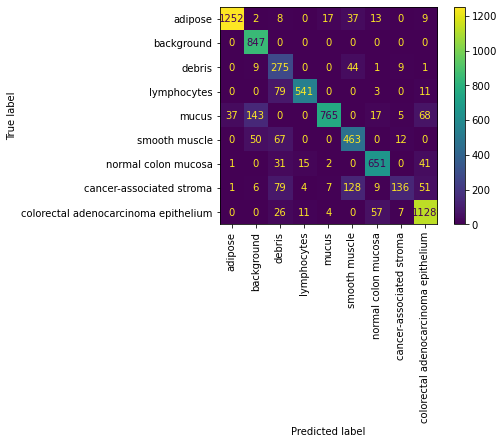

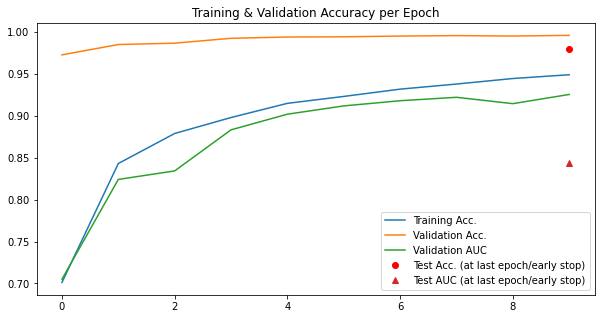

In [55]:
# Runs the classifier again 

clf_condGAN_pathmnist = run_classifier_pipeline("pathmnist", info_flags, condGAN_pathmnist_loader)

### DermaMNIST

#### Training the Joint VAE

In [56]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["dermamnist"][0]["label"])
n_channels = info_flags["dermamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Path trained_models/conditionalGAN/dermamnist/ created.
Epoch 1 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 6.283367395401001 , Gen Loss: 1.6173982267732268 Disc Loss: 0.34689891581632654
Epoch 2 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 6.224417209625244 , Gen Loss: 2.926578722616669 Disc Loss: 0.23140217762148566
Epoch 3 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 6.078857183456421 , Gen Loss: 1.3287952282092907 Disc Loss: 0.4767846550770658
Epoc

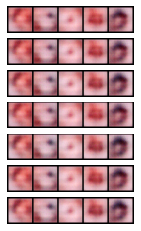

New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_10.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_10.pth
Epoch: 10, Duration: 5.926751136779785 , Gen Loss: 1.5759745277044384 Disc Loss: 0.44835295145702514
Epoch 11 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_11.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_11.pth
Epoch: 11, Duration: 5.792971611022949 , Gen Loss: 1.6044743481964465 Disc Loss: 0.45608214330312546
Epoch 12 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_12.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_12.pth
Epoch: 12, Duration: 5.940311670303345 , Gen Loss: 1.6271054559280005 Disc Loss: 0.4397051400050842
Epoch 13 of 50
New Generator model saved at trained_models/con

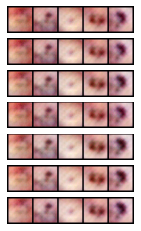

New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_19.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_19.pth
Epoch: 19, Duration: 8.1570725440979 , Gen Loss: 1.526479240625446 Disc Loss: 0.5051707151665299
Epoch 20 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_20.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_20.pth
Epoch: 20, Duration: 6.4528374671936035 , Gen Loss: 1.4126717311706152 Disc Loss: 0.4945491171774654
Epoch 21 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_21.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_21.pth
Epoch: 21, Duration: 6.080567836761475 , Gen Loss: 1.409616750437063 Disc Loss: 0.4914353921747895
Epoch 22 of 50
New Generator model saved at trained_models/conditio

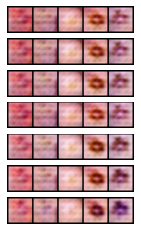

New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 6.39362907409668 , Gen Loss: 1.2579276192557443 Disc Loss: 0.5276970518320965
Epoch 29 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 5.863721132278442 , Gen Loss: 1.2807843663033396 Disc Loss: 0.524063234477576
Epoch 30 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 6.138486862182617 , Gen Loss: 1.3066717044116598 Disc Loss: 0.5126240249705651
Epoch 31 of 50
New Generator model saved at trained_models/conditi

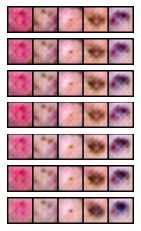

New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_37.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_37.pth
Epoch: 37, Duration: 6.796655654907227 , Gen Loss: 1.2781083314007422 Disc Loss: 0.5098630094793599
Epoch 38 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_38.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_38.pth
Epoch: 38, Duration: 6.740543842315674 , Gen Loss: 1.228907671569502 Disc Loss: 0.5204636323497931
Epoch 39 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_39.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_39.pth
Epoch: 39, Duration: 7.636296272277832 , Gen Loss: 1.2125741167314827 Disc Loss: 0.5279445373265128
Epoch 40 of 50
New Generator model saved at trained_models/condit

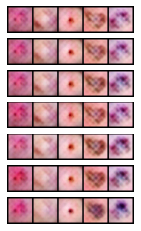

New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_46.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_46.pth
Epoch: 46, Duration: 6.674261093139648 , Gen Loss: 1.2325046605180534 Disc Loss: 0.531595322924843
Epoch 47 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_47.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_47.pth
Epoch: 47, Duration: 7.1432273387908936 , Gen Loss: 1.193483692646639 Disc Loss: 0.5446290247141251
Epoch 48 of 50
New Generator model saved at trained_models/conditionalGAN/dermamnist/gen_models/gen_model_48.pth
New Discriminator model saved at trained_models/conditionalGAN/dermamnist/disc_models/disc_model_48.pth
Epoch: 48, Duration: 6.592315196990967 , Gen Loss: 1.2315848214285714 Disc Loss: 0.5399308420374268
Epoch 49 of 50
New Generator model saved at trained_models/condit

In [57]:
# Retrieves the data loader
train_loader = dermamnist[3]
val_loader = dermamnist[5]
test_loader = dermamnist[4]

# Runs the cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="dermamnist"
)

#### Generating an upgraded dataset

In [59]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condGAN_dermamnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/dermamnist/gen_models/gen_model_50.pth",
    dermamnist[0], 128, dermamnist[4], dermamnist[5], len(dermamnist[0])//10
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "DermaMNIST",
  "description": "The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3\u00d7600\u00d7450 are resized into 3\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/dermamnist.npz?download=1",
  "MD5": "0744692d530f8e62ec473284d019b0c7",
  "task": "multi-class",
  "label": {
    "0": "actinic keratoses and intraepithelial carcinoma",
    "1": "basal cell carcinoma",
    "2": "benign keratosis-like lesions",
    "3": "dermatofibroma",
    "4": "melanoma",
    "5": "melanocytic nevi",
    "6": "vascular lesions"
  },
  "n_channels": 3,
  "n_samples": {
    "train": 7007,
    "val": 1003,
    "test": 2005
  },
  "license": "CC B

100%|███████████████████████████████████████████| 61/61 [00:01<00:00, 59.22it/s]


train -- accuracy: 0.34
val -- accuracy: 0.84,  AUC: 0.46
Epoch 1



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.30it/s]


train -- accuracy: 0.5
val -- accuracy: 0.88,  AUC: 0.52
Epoch 2



100%|███████████████████████████████████████████| 61/61 [00:01<00:00, 60.20it/s]


train -- accuracy: 0.56
val -- accuracy: 0.89,  AUC: 0.59
Epoch 3



100%|███████████████████████████████████████████| 61/61 [00:01<00:00, 59.84it/s]


train -- accuracy: 0.62
val -- accuracy: 0.86,  AUC: 0.52
Epoch 4



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.54it/s]


train -- accuracy: 0.68
val -- accuracy: 0.89,  AUC: 0.56
Epoch 5



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.60it/s]


train -- accuracy: 0.72
val -- accuracy: 0.88,  AUC: 0.54
Epoch 6



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.33it/s]


train -- accuracy: 0.77
val -- accuracy: 0.88,  AUC: 0.65
Epoch 7



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.05it/s]


train -- accuracy: 0.82
val -- accuracy: 0.87,  AUC: 0.54
Epoch 8



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.07it/s]


train -- accuracy: 0.83
val -- accuracy: 0.89,  AUC: 0.57
Epoch 9



100%|███████████████████████████████████████████| 61/61 [00:00<00:00, 61.13it/s]


train -- accuracy: 0.86
val -- accuracy: 0.87,  AUC: 0.58
test -- accuracy: 0.88,  AUC: 0.61


<Figure size 720x720 with 0 Axes>

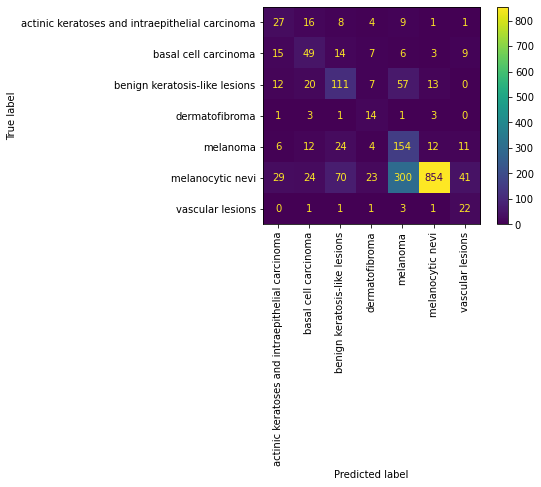

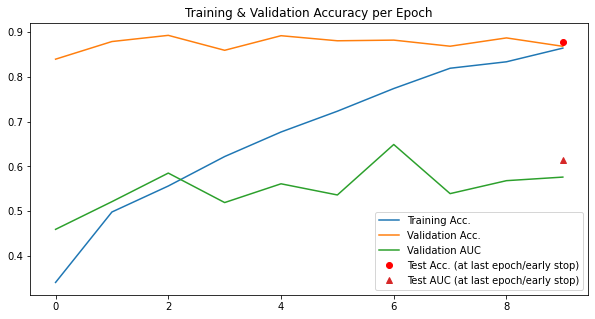

In [60]:
# Runs the classifier again 

clf_condGAN_dermamnist = run_classifier_pipeline("dermamnist", info_flags, condGAN_dermamnist_loader)

### OctMNIST

#### Training the Joint VAE

In [61]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["octmnist"][0]["label"])
n_channels = info_flags["octmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Path trained_models/conditionalGAN/octmnist/ created.
Epoch 1 of 50


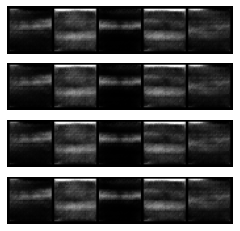

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 82.61072754859924 , Gen Loss: 4.241634885665336 Disc Loss: 0.20740601789396473
Epoch 2 of 50


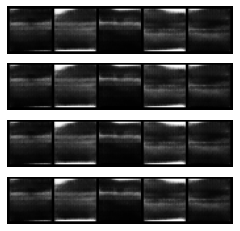

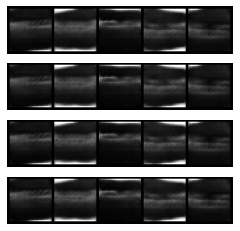

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 89.84666800498962 , Gen Loss: 4.190606502046637 Disc Loss: 0.22508033946469425
Epoch 3 of 50


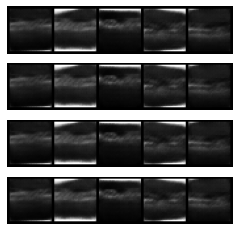

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 86.33606839179993 , Gen Loss: 3.574755775721452 Disc Loss: 0.29634043880223027
Epoch 4 of 50


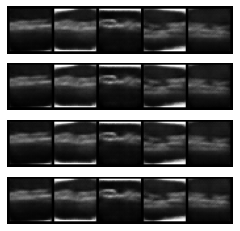

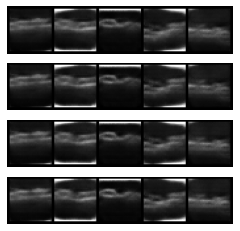

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_4.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_4.pth
Epoch: 4, Duration: 85.85919642448425 , Gen Loss: 3.183338120787468 Disc Loss: 0.3336386804707777
Epoch 5 of 50


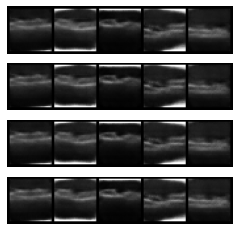

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_5.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_5.pth
Epoch: 5, Duration: 86.55507493019104 , Gen Loss: 2.839194117586713 Disc Loss: 0.3692685999004893
Epoch 6 of 50


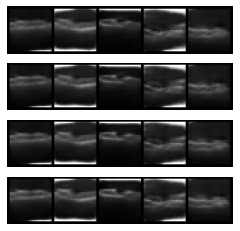

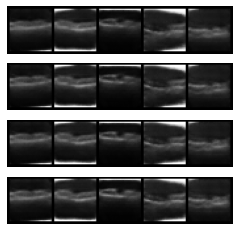

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_6.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_6.pth
Epoch: 6, Duration: 85.02695918083191 , Gen Loss: 2.7367911148270876 Disc Loss: 0.37874555504118923
Epoch 7 of 50


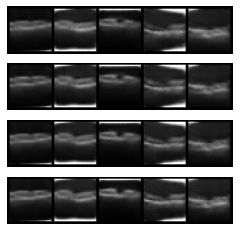

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_7.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_7.pth
Epoch: 7, Duration: 88.11544489860535 , Gen Loss: 2.6116229661868955 Disc Loss: 0.395736462191081
Epoch 8 of 50


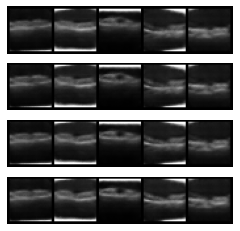

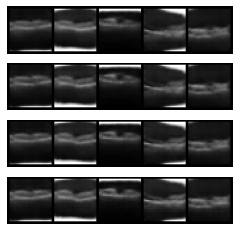

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_8.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_8.pth
Epoch: 8, Duration: 87.90963077545166 , Gen Loss: 2.4036873762528597 Disc Loss: 0.42305997504539533
Epoch 9 of 50


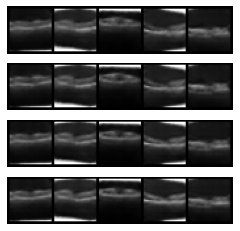

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_9.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_9.pth
Epoch: 9, Duration: 88.70051431655884 , Gen Loss: 2.294476677831694 Disc Loss: 0.42730628924002584
Epoch 10 of 50


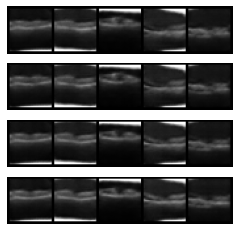

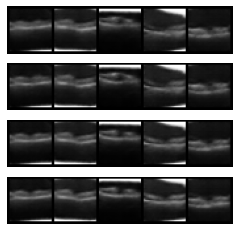

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_10.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_10.pth
Epoch: 10, Duration: 88.21737790107727 , Gen Loss: 2.3982296785395527 Disc Loss: 0.42926977325420357
Epoch 11 of 50


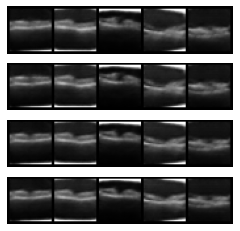

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_11.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_11.pth
Epoch: 11, Duration: 85.02726149559021 , Gen Loss: 2.372243420242724 Disc Loss: 0.4308307584737938
Epoch 12 of 50


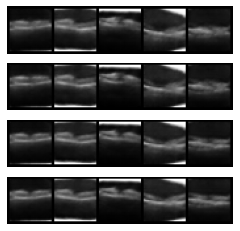

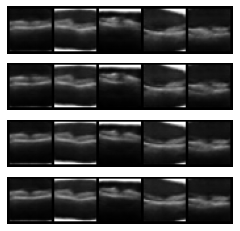

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_12.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_12.pth
Epoch: 12, Duration: 84.38137769699097 , Gen Loss: 2.1992377047918996 Disc Loss: 0.45288475903290004
Epoch 13 of 50


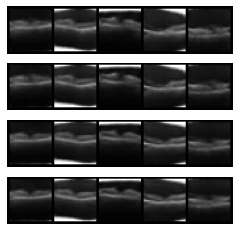

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_13.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_13.pth
Epoch: 13, Duration: 76.94377446174622 , Gen Loss: 2.2867444050904315 Disc Loss: 0.44480100113360077
Epoch 14 of 50


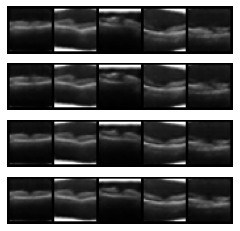

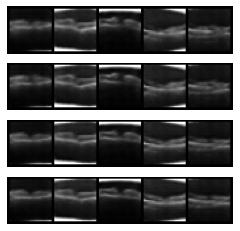

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_14.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_14.pth
Epoch: 14, Duration: 75.80670499801636 , Gen Loss: 2.067677343116838 Disc Loss: 0.4676837228269233
Epoch 15 of 50


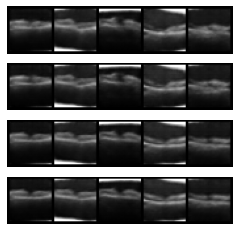

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_15.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_15.pth
Epoch: 15, Duration: 79.28064107894897 , Gen Loss: 2.0381533913128225 Disc Loss: 0.4699372993116325
Epoch 16 of 50


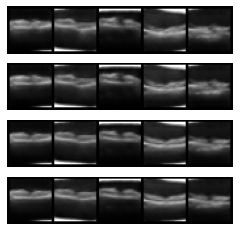

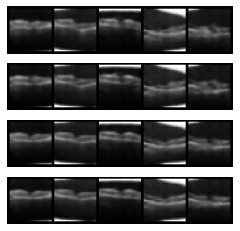

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_16.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_16.pth
Epoch: 16, Duration: 80.26885676383972 , Gen Loss: 1.8835151497276281 Disc Loss: 0.4921412150430358
Epoch 17 of 50


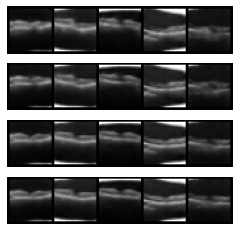

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_17.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_17.pth
Epoch: 17, Duration: 75.6156976222992 , Gen Loss: 1.8784761405254573 Disc Loss: 0.4855630607091929
Epoch 18 of 50


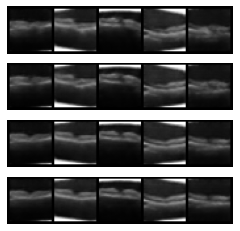

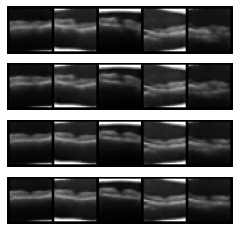

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_18.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_18.pth
Epoch: 18, Duration: 77.82904362678528 , Gen Loss: 1.9814925892774706 Disc Loss: 0.4788573522471968
Epoch 19 of 50


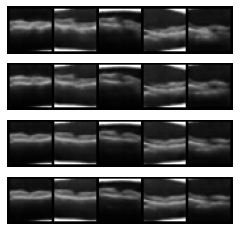

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_19.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_19.pth
Epoch: 19, Duration: 77.03355598449707 , Gen Loss: 1.9822523838956883 Disc Loss: 0.47751464768612084
Epoch 20 of 50


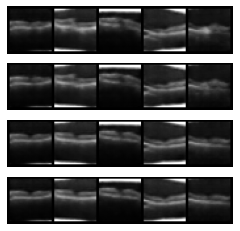

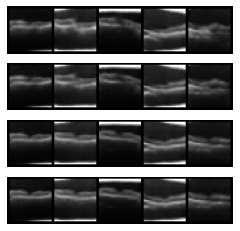

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_20.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_20.pth
Epoch: 20, Duration: 77.5601155757904 , Gen Loss: 1.9199104339998154 Disc Loss: 0.4933377713460611
Epoch 21 of 50


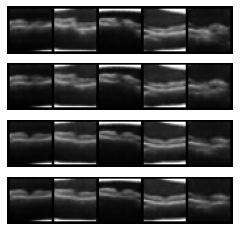

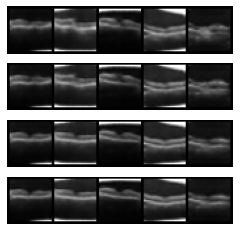

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_21.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_21.pth
Epoch: 21, Duration: 76.05431723594666 , Gen Loss: 1.9898764580362547 Disc Loss: 0.483401012225961
Epoch 22 of 50


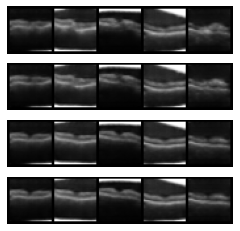

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_22.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_22.pth
Epoch: 22, Duration: 75.12035799026489 , Gen Loss: 1.7783307216061224 Disc Loss: 0.5078343000143624
Epoch 23 of 50


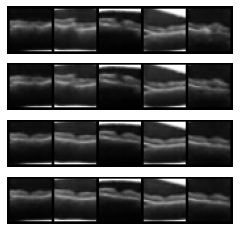

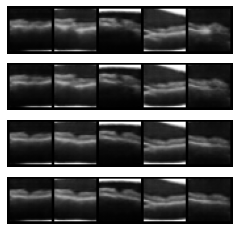

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_23.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_23.pth
Epoch: 23, Duration: 73.25870442390442 , Gen Loss: 1.8299380879592109 Disc Loss: 0.49587478809103686
Epoch 24 of 50


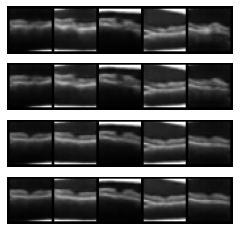

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_24.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_24.pth
Epoch: 24, Duration: 73.32003736495972 , Gen Loss: 1.9632818831621819 Disc Loss: 0.48381569338151564
Epoch 25 of 50


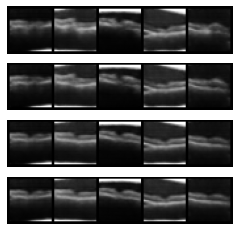

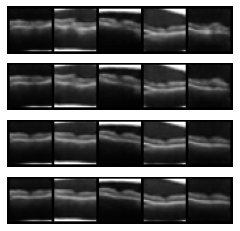

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_25.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_25.pth
Epoch: 25, Duration: 73.0117495059967 , Gen Loss: 1.917544491264606 Disc Loss: 0.49053602869138363
Epoch 26 of 50


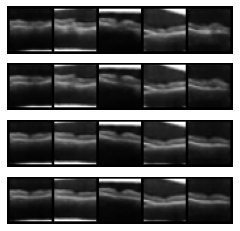

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_26.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_26.pth
Epoch: 26, Duration: 73.2152087688446 , Gen Loss: 2.075514768868554 Disc Loss: 0.4790779972455041
Epoch 27 of 50


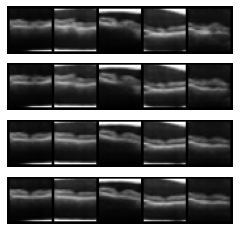

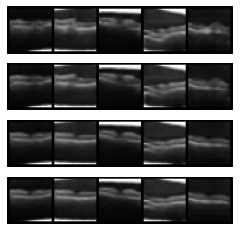

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_27.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_27.pth
Epoch: 27, Duration: 73.80502104759216 , Gen Loss: 1.796332564348513 Disc Loss: 0.5039199551560881
Epoch 28 of 50


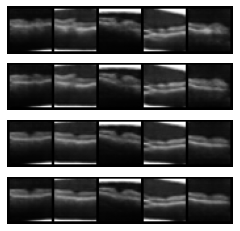

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 73.07948136329651 , Gen Loss: 1.9256140230515917 Disc Loss: 0.49198003920155525
Epoch 29 of 50


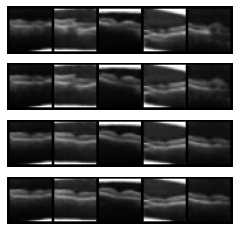

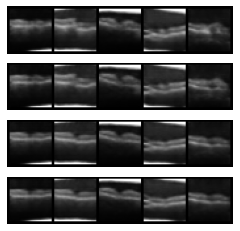

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 77.44552850723267 , Gen Loss: 1.8331943048103656 Disc Loss: 0.5046071364911723
Epoch 30 of 50


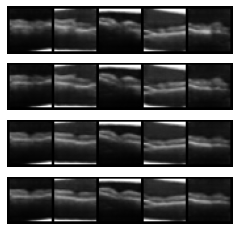

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 80.14958763122559 , Gen Loss: 1.9183180711860233 Disc Loss: 0.49317174660432717
Epoch 31 of 50


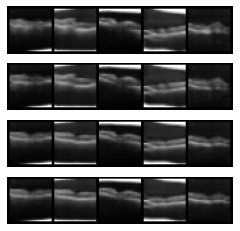

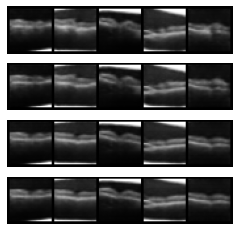

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_31.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_31.pth
Epoch: 31, Duration: 76.5074200630188 , Gen Loss: 1.9751196115493912 Disc Loss: 0.4883327044456641
Epoch 32 of 50


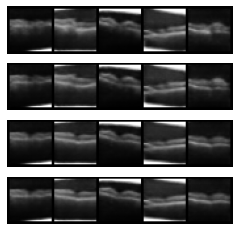

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_32.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_32.pth
Epoch: 32, Duration: 72.75689601898193 , Gen Loss: 1.9844889691927325 Disc Loss: 0.4875177686146476
Epoch 33 of 50


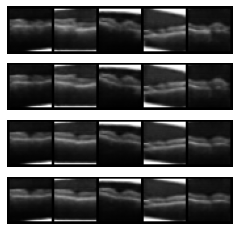

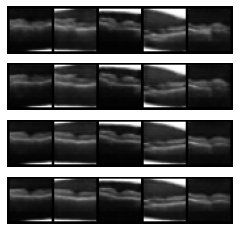

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_33.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_33.pth
Epoch: 33, Duration: 72.84549283981323 , Gen Loss: 1.8678427026375453 Disc Loss: 0.5042764094350463
Epoch 34 of 50


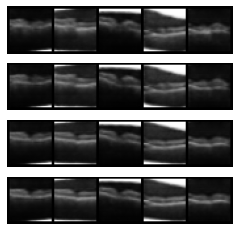

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_34.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_34.pth
Epoch: 34, Duration: 72.69738459587097 , Gen Loss: 1.8644797298337044 Disc Loss: 0.49743737625285966
Epoch 35 of 50


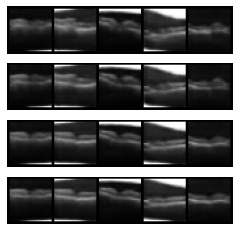

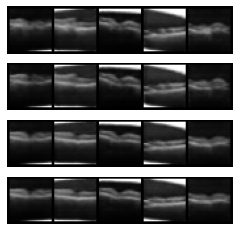

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_35.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_35.pth
Epoch: 35, Duration: 73.08046579360962 , Gen Loss: 1.7938229979892693 Disc Loss: 0.5071372605845481
Epoch 36 of 50


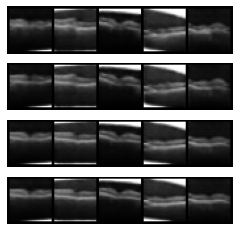

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_36.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_36.pth
Epoch: 36, Duration: 72.83345603942871 , Gen Loss: 2.0478782815433383 Disc Loss: 0.4786841944125281
Epoch 37 of 50


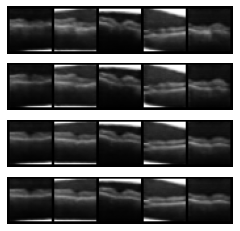

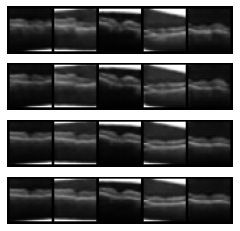

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_37.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_37.pth
Epoch: 37, Duration: 73.208580493927 , Gen Loss: 2.0160928988376745 Disc Loss: 0.4849018069647199
Epoch 38 of 50


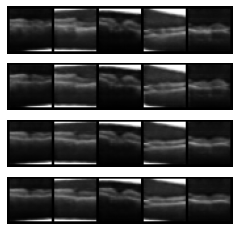

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_38.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_38.pth
Epoch: 38, Duration: 72.73619079589844 , Gen Loss: 2.0949988522933616 Disc Loss: 0.47807483592283306
Epoch 39 of 50


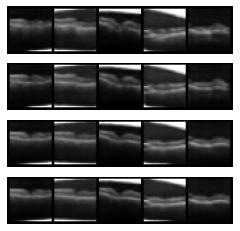

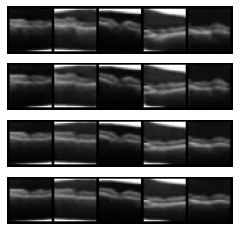

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_39.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_39.pth
Epoch: 39, Duration: 73.41193413734436 , Gen Loss: 1.8545594409450434 Disc Loss: 0.4962316030319973
Epoch 40 of 50


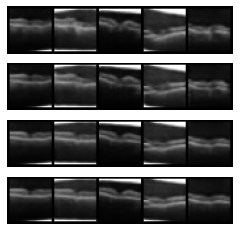

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_40.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_40.pth
Epoch: 40, Duration: 73.14614605903625 , Gen Loss: 2.015490352852468 Disc Loss: 0.49275438052053305
Epoch 41 of 50


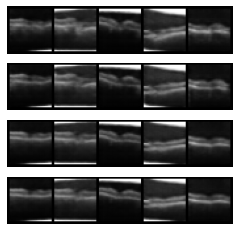

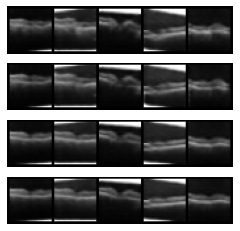

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_41.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_41.pth
Epoch: 41, Duration: 74.50086069107056 , Gen Loss: 1.850443085291915 Disc Loss: 0.5074929534659458
Epoch 42 of 50


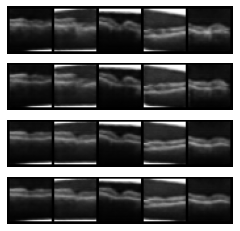

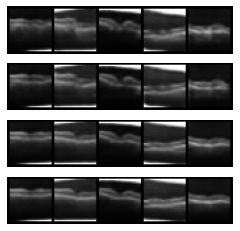

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_42.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_42.pth
Epoch: 42, Duration: 73.82477402687073 , Gen Loss: 1.771441917067616 Disc Loss: 0.5021416911168789
Epoch 43 of 50


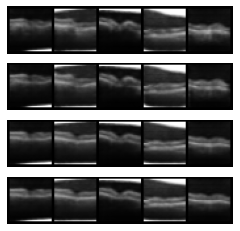

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_43.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_43.pth
Epoch: 43, Duration: 72.77532076835632 , Gen Loss: 1.9002540342850107 Disc Loss: 0.4860255496168327
Epoch 44 of 50


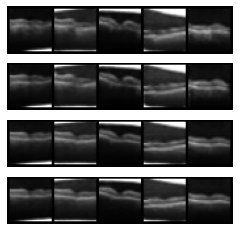

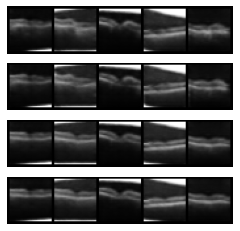

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_44.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_44.pth
Epoch: 44, Duration: 73.33594417572021 , Gen Loss: 1.8641785369882127 Disc Loss: 0.491978796921325
Epoch 45 of 50


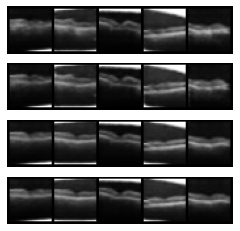

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_45.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_45.pth
Epoch: 45, Duration: 73.1426944732666 , Gen Loss: 1.9374902220523815 Disc Loss: 0.4796136203925028
Epoch 46 of 50


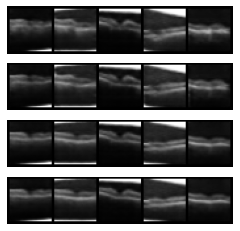

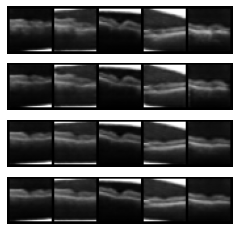

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_46.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_46.pth
Epoch: 46, Duration: 72.73999190330505 , Gen Loss: 1.8238656618997302 Disc Loss: 0.5003940833478667
Epoch 47 of 50


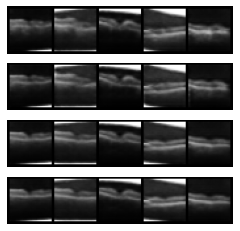

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_47.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_47.pth
Epoch: 47, Duration: 72.89581155776978 , Gen Loss: 1.7800814551124882 Disc Loss: 0.4922986640438257
Epoch 48 of 50


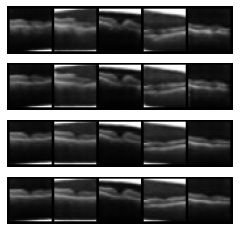

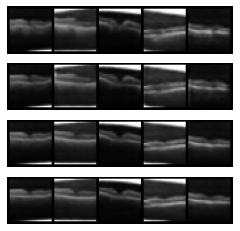

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_48.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_48.pth
Epoch: 48, Duration: 73.05337858200073 , Gen Loss: 1.8014772074438072 Disc Loss: 0.49716251173353715
Epoch 49 of 50


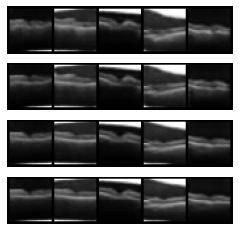

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_49.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_49.pth
Epoch: 49, Duration: 72.82867813110352 , Gen Loss: 1.805398965909907 Disc Loss: 0.49039529036336776
Epoch 50 of 50


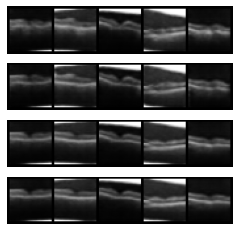

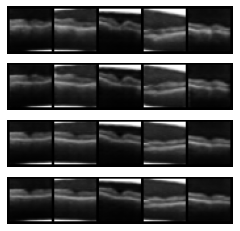

New Generator model saved at trained_models/conditionalGAN/octmnist/gen_models/gen_model_50.pth
New Discriminator model saved at trained_models/conditionalGAN/octmnist/disc_models/disc_model_50.pth
Epoch: 50, Duration: 73.41716814041138 , Gen Loss: 1.9349760071606636 Disc Loss: 0.4786114208351714


In [62]:
# Retrieves the data loader
train_loader = octmnist[3]
val_loader = octmnist[5]
test_loader = octmnist[4]

# Runs the cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="octmnist"
)

#### Generating an upgraded dataset

In [63]:
# Creates a new data loader with the augmented data added to the already existing data
# 4% generated data was added, with weights corresponding to the rarity of the class 

condGAN_octmnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/octmnist/gen_models/gen_model_50.pth",
    octmnist[0], 128, octmnist[4], octmnist[5], 4000
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OCTMNIST",
  "description": "The OCTMNIST is based on a prior dataset of 109,309 valid optical coherence tomography (OCT) images for retinal diseases. The dataset is comprised of 4 diagnosis categories, leading to a multi-class classification task. We split the source training set with a ratio of 9:1 into training and validation set, and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22121,536)\u00d7(277\u2212512). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/octmnist.npz?download=1",
  "MD5": "c68d92d5b585d8d81f7112f81e2d0842",
  "task": "multi-class",
  "label": {
    "0": "choroidal neovascularization",
    "1": "diabetic macular edema",
    "2": "drusen",
    "3": "normal"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 97477,
    "val": 10832,
    "test": 1000
  },
  "license": "CC BY 4.0"
}
--------------------------------

100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.28it/s]


train -- accuracy: 0.72
val -- accuracy: 0.94,  AUC: 0.78
Epoch 1



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.99it/s]


train -- accuracy: 0.82
val -- accuracy: 0.96,  AUC: 0.83
Epoch 2



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 71.10it/s]


train -- accuracy: 0.86
val -- accuracy: 0.97,  AUC: 0.88
Epoch 3



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 71.01it/s]


train -- accuracy: 0.88
val -- accuracy: 0.97,  AUC: 0.81
Epoch 4



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.81it/s]


train -- accuracy: 0.89
val -- accuracy: 0.97,  AUC: 0.9
Epoch 5



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.92it/s]


train -- accuracy: 0.91
val -- accuracy: 0.97,  AUC: 0.86
Epoch 6



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.79it/s]


train -- accuracy: 0.92
val -- accuracy: 0.97,  AUC: 0.88
Epoch 7



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.75it/s]


train -- accuracy: 0.93
val -- accuracy: 0.97,  AUC: 0.88
Epoch 8



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.96it/s]


train -- accuracy: 0.94
val -- accuracy: 0.97,  AUC: 0.86
Epoch 9



100%|█████████████████████████████████████████| 793/793 [00:11<00:00, 70.86it/s]


train -- accuracy: 0.95
val -- accuracy: 0.97,  AUC: 0.9
test -- accuracy: 0.94,  AUC: 0.76


<Figure size 720x720 with 0 Axes>

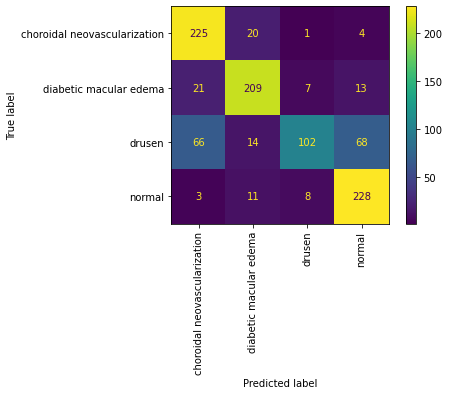

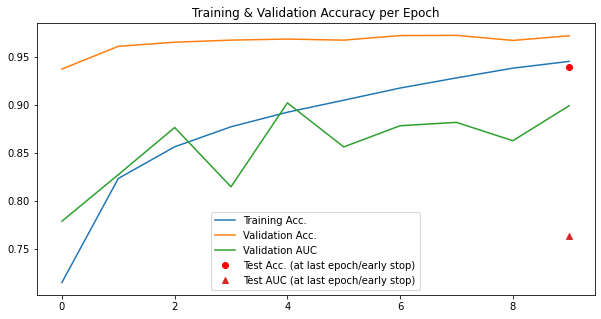

In [64]:
# Runs the classifier again 

clf_condGAN_octmnist = run_classifier_pipeline("octmnist", info_flags, condGAN_octmnist_loader)

### PneumoniaMNIST

#### Training the Joint VAE

In [65]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["pneumoniamnist"][0]["label"])
n_channels = info_flags["pneumoniamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Path trained_models/conditionalGAN/pneumoniamnist/ created.
Epoch 1 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 3.6277832984924316 , Gen Loss: 1.2767936557455395 Disc Loss: 0.43224444263753187
Epoch 2 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 3.495713710784912 , Gen Loss: 1.8339059679003824 Disc Loss: 0.2756959044943447
Epoch 3 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 3.4829936027526855 , Gen Loss: 2.036638517549915 Disc 

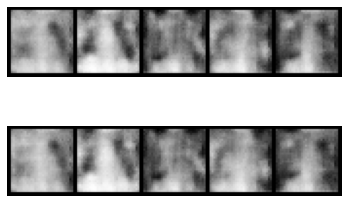

New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_14.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_14.pth
Epoch: 14, Duration: 3.6647918224334717 , Gen Loss: 2.673446875663764 Disc Loss: 0.2689343292832678
Epoch 15 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_15.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_15.pth
Epoch: 15, Duration: 3.497342824935913 , Gen Loss: 2.1755016394966016 Disc Loss: 0.3200111616032551
Epoch 16 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_16.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_16.pth
Epoch: 16, Duration: 3.499783992767334 , Gen Loss: 1.7995425007965167 Disc Loss: 0.3682811286556792
Epoch 17 of 50
New Generator model saved

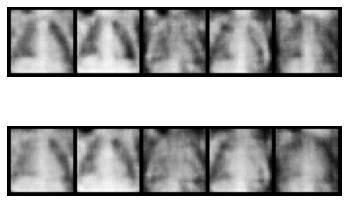

New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 3.6234138011932373 , Gen Loss: 1.0924778551800127 Disc Loss: 0.500301493966387
Epoch 29 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 3.506584644317627 , Gen Loss: 1.1008678296914827 Disc Loss: 0.4970931812373885
Epoch 30 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 3.511861801147461 , Gen Loss: 1.1352389715643585 Disc Loss: 0.5343855579930438
Epoch 31 of 50
New Generator model saved

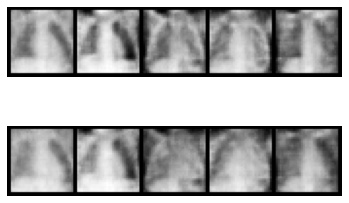

New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_41.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_41.pth
Epoch: 41, Duration: 3.604980707168579 , Gen Loss: 1.1136600102219627 Disc Loss: 0.47536886599272515
Epoch 42 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_42.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_42.pth
Epoch: 42, Duration: 3.5056421756744385 , Gen Loss: 1.1509268216997663 Disc Loss: 0.48816332821128927
Epoch 43 of 50
New Generator model saved at trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_43.pth
New Discriminator model saved at trained_models/conditionalGAN/pneumoniamnist/disc_models/disc_model_43.pth
Epoch: 43, Duration: 3.5067834854125977 , Gen Loss: 1.1678108986698172 Disc Loss: 0.49573303585652084
Epoch 44 of 50
New Generator model 

In [66]:
# Retrieves the data loader
train_loader = pneumoniamnist[3]
val_loader = pneumoniamnist[5]
test_loader = pneumoniamnist[4]

# Runs the cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="pneumoniamnist"
)

#### Generating an upgraded dataset

In [67]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condGAN_pneumoniamnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/pneumoniamnist/gen_models/gen_model_50.pth",
    pneumoniamnist[0], 128, pneumoniamnist[4], pneumoniamnist[5], len(pneumoniamnist[0])//10
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "PneumoniaMNIST",
  "description": "The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384\u22122,916)\u00d7(127\u22122,713). We center-crop the images and resize them into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/pneumoniamnist.npz?download=1",
  "MD5": "28209eda62fecd6e6a2d98b1501bb15f",
  "task": "binary-class",
  "label": {
    "0": "normal",
    "1": "pneumonia"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 4708,
    "val": 524,
    "test": 624
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           

100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 68.86it/s]


train -- accuracy: 0.85
val -- accuracy: 0.98,  AUC: 0.85
Epoch 1



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 71.74it/s]


train -- accuracy: 0.95
val -- accuracy: 0.99,  AUC: 0.96
Epoch 2



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 71.69it/s]


train -- accuracy: 0.97
val -- accuracy: 0.99,  AUC: 0.95
Epoch 3



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 71.98it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.97
Epoch 4



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 72.50it/s]


train -- accuracy: 0.98
val -- accuracy: 0.99,  AUC: 0.97
Epoch 5



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 71.24it/s]


train -- accuracy: 0.98
val -- accuracy: 0.99,  AUC: 0.97
Epoch 6



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 72.44it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 7



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 72.31it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.97
Epoch 8



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 71.85it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.98
Epoch 9



100%|███████████████████████████████████████████| 41/41 [00:00<00:00, 72.04it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.97
test -- accuracy: 0.96,  AUC: 0.86


<Figure size 720x720 with 0 Axes>

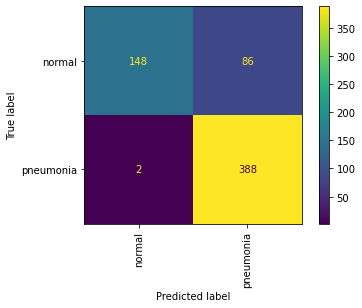

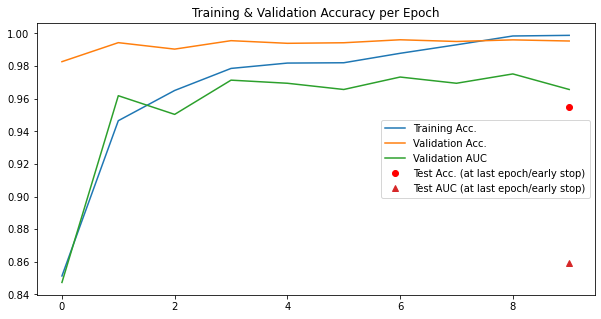

In [68]:
# Runs the classifier again 

clf_condGAN_pneumoniamnist = run_classifier_pipeline("pneumoniamnist", info_flags, condGAN_pneumoniamnist_loader)

### BreastMNIST

#### Training the Joint VAE

In [69]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["breastmnist"][0]["label"])
n_channels = info_flags["breastmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

In [70]:
# Retrieves the data loader
train_loader = breastmnist[3]
val_loader = breastmnist[5]
test_loader = breastmnist[4]

# Runs the cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="breastmnist"
)

Path trained_models/conditionalGAN/breastmnist/ created.
Epoch 1 of 50
New Generator model saved at trained_models/conditionalGAN/breastmnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/breastmnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 0.508312463760376 , Gen Loss: 0.8012879200470753 Disc Loss: 0.6291421743539664
Epoch 2 of 50
New Generator model saved at trained_models/conditionalGAN/breastmnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/breastmnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 0.42092084884643555 , Gen Loss: 1.0771383767599587 Disc Loss: 0.48180571056547616
Epoch 3 of 50
New Generator model saved at trained_models/conditionalGAN/breastmnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/breastmnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 0.4234192371368408 , Gen Loss: 1.8318565284812844 Disc Loss: 0.25252488244

New Generator model saved at trained_models/conditionalGAN/breastmnist/gen_models/gen_model_27.pth
New Discriminator model saved at trained_models/conditionalGAN/breastmnist/disc_models/disc_model_27.pth
Epoch: 27, Duration: 0.4600491523742676 , Gen Loss: 1.412711230826465 Disc Loss: 0.4665470612354768
Epoch 28 of 50
New Generator model saved at trained_models/conditionalGAN/breastmnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/breastmnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 0.4231297969818115 , Gen Loss: 1.1581778613638964 Disc Loss: 0.5369775793054602
Epoch 29 of 50
New Generator model saved at trained_models/conditionalGAN/breastmnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/breastmnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 0.419095516204834 , Gen Loss: 1.4624680739182692 Disc Loss: 0.4322887881771549
Epoch 30 of 50
New Generator model saved at trained_model

#### Generating an upgraded dataset

In [71]:
# Creates a new data loader with the augmented data added to the already existing data
# 3% generated data was added, with weights corresponding to the rarity of the class 

condGAN_breastmnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/breastmnist/gen_models/gen_model_50.pth",
    breastmnist[0], 128, breastmnist[4], breastmnist[5], len(breastmnist[0])//30
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "BreastMNIST",
  "description": "The BreastMNIST is based on a dataset of 780 breast ultrasound images. It is categorized into 3 classes: normal, benign, and malignant. As we use low-resolution images, we simplify the task into binary classification by combining normal and benign as positive and classifying them against malignant as negative. We split the source dataset with a ratio of 7:1:2 into training, validation and test set. The source images of 1\u00d7500\u00d7500 are resized into 1\u00d728\u00d728.",
  "url": "https://zenodo.org/record/5208230/files/breastmnist.npz?download=1",
  "MD5": "750601b1f35ba3300ea97c75c52ff8f6",
  "task": "binary-class",
  "label": {
    "0": "malignant",
    "1": "normal, benign"
  },
  "n_channels": 1,
  "n_samples": {
    "train": 546,
    "val": 78,
    "test": 156
  },
  "license": "CC BY 4.0"
}
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
    

100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 53.77it/s]


train -- accuracy: 0.54
val -- accuracy: 0.6,  AUC: 0.73
Epoch 1



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 76.32it/s]


train -- accuracy: 0.7
val -- accuracy: 0.55,  AUC: 0.73
Epoch 2



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 77.93it/s]


train -- accuracy: 0.7
val -- accuracy: 0.65,  AUC: 0.49
Epoch 3



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 77.11it/s]


train -- accuracy: 0.68
val -- accuracy: 0.74,  AUC: 0.49
Epoch 4



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 76.65it/s]


train -- accuracy: 0.73
val -- accuracy: 0.78,  AUC: 0.37
Epoch 5



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 77.61it/s]


train -- accuracy: 0.76
val -- accuracy: 0.79,  AUC: 0.42
Epoch 6



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 77.03it/s]


train -- accuracy: 0.78
val -- accuracy: 0.83,  AUC: 0.6
Epoch 7



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 76.71it/s]


train -- accuracy: 0.77
val -- accuracy: 0.89,  AUC: 0.69
Epoch 8



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 75.08it/s]


train -- accuracy: 0.81
val -- accuracy: 0.9,  AUC: 0.72
Epoch 9



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00, 77.91it/s]


train -- accuracy: 0.87
val -- accuracy: 0.93,  AUC: 0.79
test -- accuracy: 0.87,  AUC: 0.76


<Figure size 720x720 with 0 Axes>

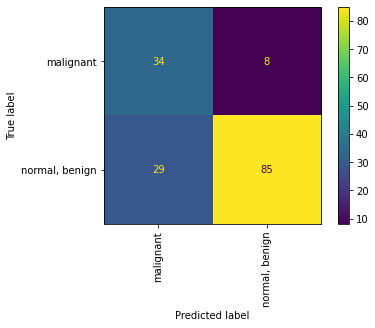

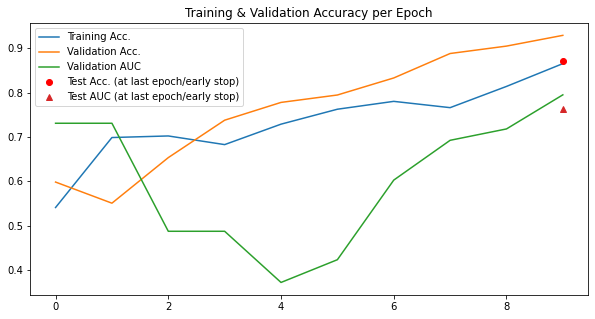

In [72]:
# Runs the classifier again 

clf_condGAN_breastmnist = run_classifier_pipeline("breastmnist", info_flags, condGAN_breastmnist_loader)

### OrganAMNIST

#### Training the Joint VAE

In [73]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organamnist"][0]["label"])
n_channels = info_flags["organamnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Path trained_models/conditionalGAN/organamnist/ created.
Epoch 1 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 26.191077947616577 , Gen Loss: 3.8570882493276657 Disc Loss: 0.1838218150863191
Epoch 2 of 50


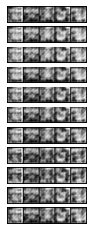

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 26.215864419937134 , Gen Loss: 5.178770043521008 Disc Loss: 0.13101915611173767
Epoch 3 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 25.72037625312805 , Gen Loss: 5.186551140799861 Disc Loss: 0.12696929231821666
Epoch 4 of 50


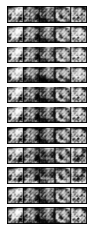

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_4.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_4.pth
Epoch: 4, Duration: 26.161704778671265 , Gen Loss: 4.799641150487262 Disc Loss: 0.15215486771547237
Epoch 5 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_5.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_5.pth
Epoch: 5, Duration: 25.938989877700806 , Gen Loss: 3.938478680489286 Disc Loss: 0.1771856886955626
Epoch 6 of 50


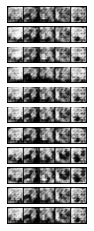

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_6.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_6.pth
Epoch: 6, Duration: 26.293115377426147 , Gen Loss: 3.649550828128163 Disc Loss: 0.1851944839425913
Epoch 7 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_7.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_7.pth
Epoch: 7, Duration: 25.752671480178833 , Gen Loss: 3.239924696726526 Disc Loss: 0.1906372928098161
Epoch 8 of 50


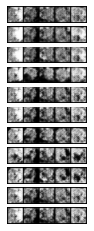

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_8.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_8.pth
Epoch: 8, Duration: 26.284086227416992 , Gen Loss: 3.2198859200138803 Disc Loss: 0.19435670791493162
Epoch 9 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_9.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_9.pth
Epoch: 9, Duration: 26.095664978027344 , Gen Loss: 3.0246125039761718 Disc Loss: 0.21575013645498972
Epoch 10 of 50


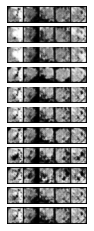

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_10.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_10.pth
Epoch: 10, Duration: 26.277204513549805 , Gen Loss: 2.7251367260923627 Disc Loss: 0.22857761148643763
Epoch 11 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_11.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_11.pth
Epoch: 11, Duration: 25.713555335998535 , Gen Loss: 2.6937812219860615 Disc Loss: 0.22660692129529222
Epoch 12 of 50


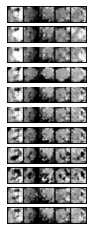

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_12.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_12.pth
Epoch: 12, Duration: 26.19348978996277 , Gen Loss: 2.51626096158295 Disc Loss: 0.2541895240070414
Epoch 13 of 50


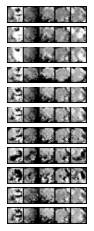

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_13.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_13.pth
Epoch: 13, Duration: 26.23880171775818 , Gen Loss: 2.442273665452127 Disc Loss: 0.2550830330871722
Epoch 14 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_14.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_14.pth
Epoch: 14, Duration: 25.91843843460083 , Gen Loss: 2.4566412010930856 Disc Loss: 0.2551968679513317
Epoch 15 of 50


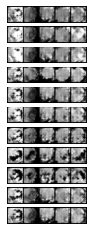

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_15.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_15.pth
Epoch: 15, Duration: 26.236078023910522 , Gen Loss: 2.4702399348630752 Disc Loss: 0.2594599003065267
Epoch 16 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_16.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_16.pth
Epoch: 16, Duration: 25.706719160079956 , Gen Loss: 2.3086645755617248 Disc Loss: 0.2771307649973974
Epoch 17 of 50


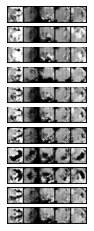

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_17.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_17.pth
Epoch: 17, Duration: 26.451866626739502 , Gen Loss: 2.2576073656776843 Disc Loss: 0.2840968035192736
Epoch 18 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_18.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_18.pth
Epoch: 18, Duration: 25.94911241531372 , Gen Loss: 2.303913501995315 Disc Loss: 0.2796315173071918
Epoch 19 of 50


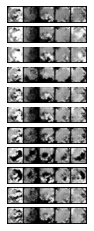

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_19.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_19.pth
Epoch: 19, Duration: 26.168704509735107 , Gen Loss: 2.2672570378242387 Disc Loss: 0.2750886844473844
Epoch 20 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_20.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_20.pth
Epoch: 20, Duration: 25.87575602531433 , Gen Loss: 2.223499718053266 Disc Loss: 0.2854921631007634
Epoch 21 of 50


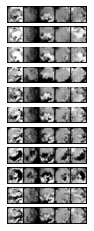

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_21.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_21.pth
Epoch: 21, Duration: 26.127439498901367 , Gen Loss: 2.2299939815216447 Disc Loss: 0.2813312178291547
Epoch 22 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_22.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_22.pth
Epoch: 22, Duration: 25.6853609085083 , Gen Loss: 2.2154974462132384 Disc Loss: 0.28514280782799806
Epoch 23 of 50


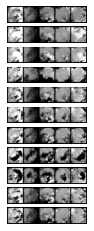

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_23.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_23.pth
Epoch: 23, Duration: 26.414424657821655 , Gen Loss: 2.2596397317168386 Disc Loss: 0.2754720687480119
Epoch 24 of 50


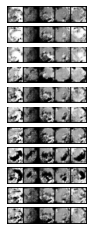

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_24.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_24.pth
Epoch: 24, Duration: 26.256964206695557 , Gen Loss: 2.1891989098059628 Disc Loss: 0.27963662872133543
Epoch 25 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_25.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_25.pth
Epoch: 25, Duration: 25.69335126876831 , Gen Loss: 2.265999573465198 Disc Loss: 0.25631282238620917
Epoch 26 of 50


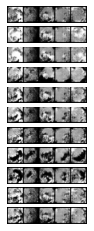

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_26.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_26.pth
Epoch: 26, Duration: 26.117998838424683 , Gen Loss: 2.27079040875047 Disc Loss: 0.26369545528071775
Epoch 27 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_27.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_27.pth
Epoch: 27, Duration: 25.664609909057617 , Gen Loss: 2.2114182553280703 Disc Loss: 0.2719985945587895
Epoch 28 of 50


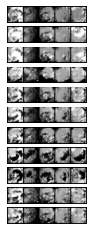

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 26.503352165222168 , Gen Loss: 2.2685825037592897 Disc Loss: 0.2564985841665221
Epoch 29 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 25.874045848846436 , Gen Loss: 2.2716019092854456 Disc Loss: 0.2594678921860993
Epoch 30 of 50


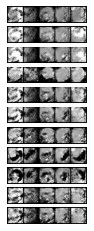

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 26.18215250968933 , Gen Loss: 2.2357935445042076 Disc Loss: 0.2599238246797374
Epoch 31 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_31.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_31.pth
Epoch: 31, Duration: 25.85956048965454 , Gen Loss: 2.290089978962436 Disc Loss: 0.2512395038098956
Epoch 32 of 50


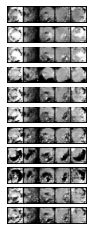

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_32.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_32.pth
Epoch: 32, Duration: 26.53463888168335 , Gen Loss: 2.314036248228796 Disc Loss: 0.2517687752125445
Epoch 33 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_33.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_33.pth
Epoch: 33, Duration: 26.10732889175415 , Gen Loss: 2.3337341133859635 Disc Loss: 0.24824785806331512
Epoch 34 of 50


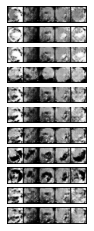

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_34.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_34.pth
Epoch: 34, Duration: 26.13664412498474 , Gen Loss: 2.3303887069489027 Disc Loss: 0.2463535566857523
Epoch 35 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_35.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_35.pth
Epoch: 35, Duration: 25.768094539642334 , Gen Loss: 2.309991622928776 Disc Loss: 0.2519527578818571
Epoch 36 of 50


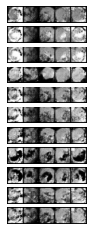

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_36.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_36.pth
Epoch: 36, Duration: 26.13740634918213 , Gen Loss: 2.395111974422371 Disc Loss: 0.24616516859872473
Epoch 37 of 50


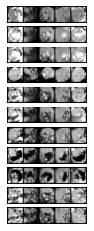

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_37.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_37.pth
Epoch: 37, Duration: 26.571484565734863 , Gen Loss: 2.410840445258957 Disc Loss: 0.2423682068458836
Epoch 38 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_38.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_38.pth
Epoch: 38, Duration: 25.724286794662476 , Gen Loss: 2.4224897252103754 Disc Loss: 0.24473637302637286
Epoch 39 of 50


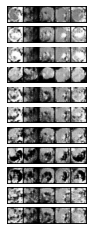

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_39.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_39.pth
Epoch: 39, Duration: 26.233595371246338 , Gen Loss: 2.4735835339492787 Disc Loss: 0.24561197803707238
Epoch 40 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_40.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_40.pth
Epoch: 40, Duration: 25.845197916030884 , Gen Loss: 2.424037947138602 Disc Loss: 0.24013920668141464
Epoch 41 of 50


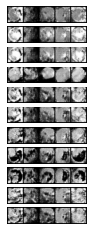

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_41.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_41.pth
Epoch: 41, Duration: 27.045705795288086 , Gen Loss: 2.4623479114253493 Disc Loss: 0.24352403595905267
Epoch 42 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_42.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_42.pth
Epoch: 42, Duration: 27.12542963027954 , Gen Loss: 2.4478500206038 Disc Loss: 0.24522526143330153
Epoch 43 of 50


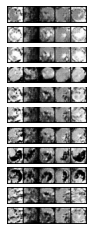

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_43.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_43.pth
Epoch: 43, Duration: 27.555727005004883 , Gen Loss: 2.4807537466383276 Disc Loss: 0.2407017728756398
Epoch 44 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_44.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_44.pth
Epoch: 44, Duration: 28.171666145324707 , Gen Loss: 2.4852967489372775 Disc Loss: 0.24945118661620544
Epoch 45 of 50


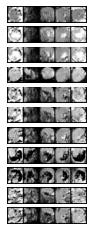

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_45.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_45.pth
Epoch: 45, Duration: 29.676823377609253 , Gen Loss: 2.439511355585437 Disc Loss: 0.24704057593042422
Epoch 46 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_46.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_46.pth
Epoch: 46, Duration: 29.24261975288391 , Gen Loss: 2.44009829277638 Disc Loss: 0.24775199441167114
Epoch 47 of 50


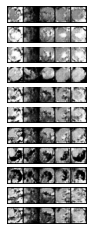

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_47.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_47.pth
Epoch: 47, Duration: 28.484044313430786 , Gen Loss: 2.414197599476591 Disc Loss: 0.24493986943697407
Epoch 48 of 50


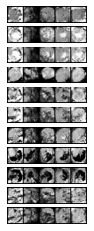

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_48.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_48.pth
Epoch: 48, Duration: 27.05945372581482 , Gen Loss: 2.4409721469159367 Disc Loss: 0.2435617361683439
Epoch 49 of 50
New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_49.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_49.pth
Epoch: 49, Duration: 26.077319383621216 , Gen Loss: 2.4879372885399498 Disc Loss: 0.24038398976316475
Epoch 50 of 50


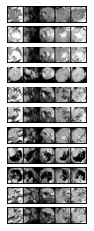

New Generator model saved at trained_models/conditionalGAN/organamnist/gen_models/gen_model_50.pth
New Discriminator model saved at trained_models/conditionalGAN/organamnist/disc_models/disc_model_50.pth
Epoch: 50, Duration: 27.057066917419434 , Gen Loss: 2.471594770249559 Disc Loss: 0.23928523340128974


In [74]:
# Retrieves the data loader
train_loader = organamnist[3]
val_loader = organamnist[5]
test_loader = organamnist[4]

# Runs the cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="organamnist"
)

#### Generating an upgraded dataset

In [78]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condGAN_organamnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/organamnist/gen_models/gen_model_50.pth",
    organamnist[0], 128, organamnist[4], organamnist[5], len(organamnist[0])//10
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganAMNIST",
  "description": "The OrganAMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Axial (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in axial views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organamnist.npz?download=1",
  "MD5": "866b832ed4eeba67bfb9edee1d5544e6",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-left",

100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 68.04it/s]


train -- accuracy: 0.71
val -- accuracy: 1.0,  AUC: 0.91
Epoch 1



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 69.14it/s]


train -- accuracy: 0.92
val -- accuracy: 1.0,  AUC: 0.96
Epoch 2



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 65.55it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.97
Epoch 3



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 65.49it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.96
Epoch 4



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 69.21it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.96
Epoch 5



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 67.64it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.95
Epoch 6



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 68.38it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.96
Epoch 7



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 69.65it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.95
Epoch 8



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 70.26it/s]


train -- accuracy: 0.99
val -- accuracy: 1.0,  AUC: 0.96
Epoch 9



100%|█████████████████████████████████████████| 298/298 [00:04<00:00, 68.66it/s]


train -- accuracy: 1.0
val -- accuracy: 1.0,  AUC: 0.97
test -- accuracy: 0.99,  AUC: 0.88


<Figure size 720x720 with 0 Axes>

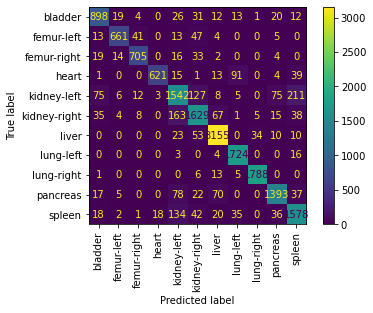

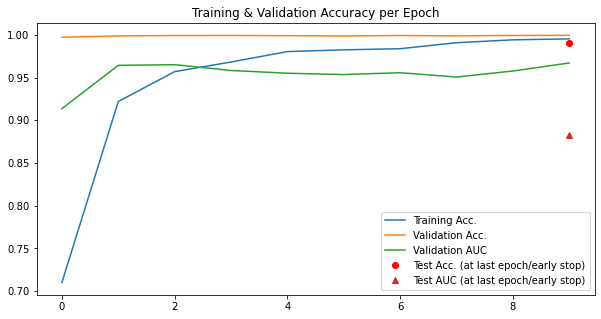

In [79]:
# Runs the classifier again 

clf_condGAN_organamnist = run_classifier_pipeline("organamnist", info_flags, condGAN_organamnist_loader)

### OrganCMNIST

#### Training the Joint VAE

In [80]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organcmnist"][0]["label"])
n_channels = info_flags["organcmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Path trained_models/conditionalGAN/organcmnist/ created.
Epoch 1 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 9.922497034072876 , Gen Loss: 2.991859375 Disc Loss: 0.24305006760817308
Epoch 2 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 9.667437314987183 , Gen Loss: 4.292537560096154 Disc Loss: 0.12432944899338942
Epoch 3 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 9.68551516532898 , Gen Loss: 5.978845552884615 Disc Loss: 0.08483131760817307
Epoch

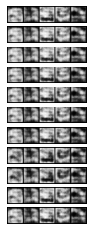

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_5.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_5.pth
Epoch: 5, Duration: 10.228390455245972 , Gen Loss: 5.717456129807692 Disc Loss: 0.11509815392127404
Epoch 6 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_6.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_6.pth
Epoch: 6, Duration: 9.704926490783691 , Gen Loss: 5.524529447115385 Disc Loss: 0.11122308819110577
Epoch 7 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_7.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_7.pth
Epoch: 7, Duration: 10.119274854660034 , Gen Loss: 5.3534765625 Disc Loss: 0.1076546630859375
Epoch 8 of 50
New Generator model saved at trained_models/conditionalGAN/

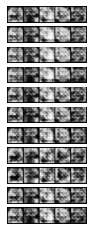

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_10.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_10.pth
Epoch: 10, Duration: 10.157671689987183 , Gen Loss: 5.211299278846154 Disc Loss: 0.11365457857572116
Epoch 11 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_11.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_11.pth
Epoch: 11, Duration: 9.695961952209473 , Gen Loss: 5.018658052884615 Disc Loss: 0.11805506310096153
Epoch 12 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_12.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_12.pth
Epoch: 12, Duration: 9.704432487487793 , Gen Loss: 4.738170673076923 Disc Loss: 0.13130739182692308
Epoch 13 of 50
New Generator model saved at trained_model

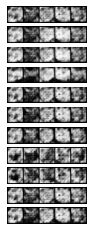

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_15.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_15.pth
Epoch: 15, Duration: 10.395004510879517 , Gen Loss: 3.5960892427884614 Disc Loss: 0.14181095064603366
Epoch 16 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_16.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_16.pth
Epoch: 16, Duration: 9.908546209335327 , Gen Loss: 3.5632286658653847 Disc Loss: 0.1305974872295673
Epoch 17 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_17.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_17.pth
Epoch: 17, Duration: 9.898540019989014 , Gen Loss: 3.4544368990384617 Disc Loss: 0.13824965256911056
Epoch 18 of 50
New Generator model saved at trained_mod

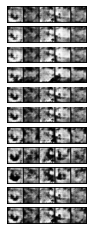

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_20.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_20.pth
Epoch: 20, Duration: 10.45439887046814 , Gen Loss: 3.313304387019231 Disc Loss: 0.15589556415264422
Epoch 21 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_21.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_21.pth
Epoch: 21, Duration: 10.983238697052002 , Gen Loss: 3.176338942307692 Disc Loss: 0.16171538837139424
Epoch 22 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_22.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_22.pth
Epoch: 22, Duration: 10.152276754379272 , Gen Loss: 3.0752229567307694 Disc Loss: 0.16294101186899038
Epoch 23 of 50
New Generator model saved at trained_mod

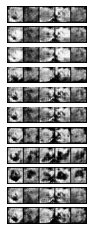

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_25.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_25.pth
Epoch: 25, Duration: 11.335247278213501 , Gen Loss: 3.0941325120192307 Disc Loss: 0.16691763070913462
Epoch 26 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_26.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_26.pth
Epoch: 26, Duration: 11.533910512924194 , Gen Loss: 3.012775841346154 Disc Loss: 0.16153209510216346
Epoch 27 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_27.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_27.pth
Epoch: 27, Duration: 11.184300899505615 , Gen Loss: 2.984325420673077 Disc Loss: 0.18604364483173078
Epoch 28 of 50
New Generator model saved at trained_mo

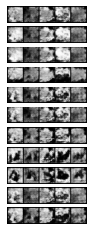

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 10.567372798919678 , Gen Loss: 2.7905411658653847 Disc Loss: 0.17553705303485576
Epoch 31 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_31.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_31.pth
Epoch: 31, Duration: 10.143359184265137 , Gen Loss: 2.741935997596154 Disc Loss: 0.18504813326322114
Epoch 32 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_32.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_32.pth
Epoch: 32, Duration: 10.432209968566895 , Gen Loss: 2.761931189903846 Disc Loss: 0.1752176044170673
Epoch 33 of 50
New Generator model saved at trained_mod

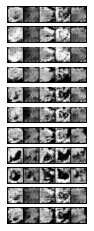

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_35.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_35.pth
Epoch: 35, Duration: 10.833424806594849 , Gen Loss: 2.575109375 Disc Loss: 0.20106993689903846
Epoch 36 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_36.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_36.pth
Epoch: 36, Duration: 11.111213445663452 , Gen Loss: 2.5420246394230768 Disc Loss: 0.1956763634314904
Epoch 37 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_37.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_37.pth
Epoch: 37, Duration: 10.927618503570557 , Gen Loss: 2.5713377403846156 Disc Loss: 0.21566644756610576
Epoch 38 of 50
New Generator model saved at trained_models/c

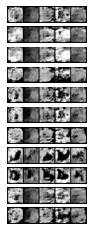

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_40.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_40.pth
Epoch: 40, Duration: 11.08760666847229 , Gen Loss: 2.455713942307692 Disc Loss: 0.19898677884615384
Epoch 41 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_41.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_41.pth
Epoch: 41, Duration: 10.9873628616333 , Gen Loss: 2.484006610576923 Disc Loss: 0.21765889798677884
Epoch 42 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_42.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_42.pth
Epoch: 42, Duration: 10.434686660766602 , Gen Loss: 2.4898000300480767 Disc Loss: 0.20540270057091345
Epoch 43 of 50
New Generator model saved at trained_model

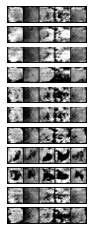

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_45.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_45.pth
Epoch: 45, Duration: 10.761967182159424 , Gen Loss: 2.476166015625 Disc Loss: 0.21063959209735578
Epoch 46 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_46.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_46.pth
Epoch: 46, Duration: 10.234617471694946 , Gen Loss: 2.502076622596154 Disc Loss: 0.2130045447716346
Epoch 47 of 50
New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_47.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_47.pth
Epoch: 47, Duration: 10.159567594528198 , Gen Loss: 2.4658374399038463 Disc Loss: 0.2142403282752404
Epoch 48 of 50
New Generator model saved at trained_models/

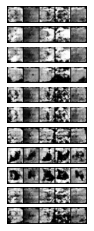

New Generator model saved at trained_models/conditionalGAN/organcmnist/gen_models/gen_model_50.pth
New Discriminator model saved at trained_models/conditionalGAN/organcmnist/disc_models/disc_model_50.pth
Epoch: 50, Duration: 10.673596858978271 , Gen Loss: 2.506346003605769 Disc Loss: 0.21305029296875


In [81]:
# Retrieves the data loader
train_loader = organcmnist[3]
val_loader = organcmnist[5]
test_loader = organcmnist[4]

# Runs the condGAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="organcmnist"
)

#### Generating an upgraded dataset

In [82]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condGAN_organcmnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/organcmnist/gen_models/gen_model_50.pth",
    organcmnist[0], 128, organcmnist[4], organcmnist[5], len(organcmnist[0])//10
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganCMNIST",
  "description": "The OrganCMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Coronal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in coronal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organcmnist.npz?download=1",
  "MD5": "0afa5834fb105f7705a7d93372119a21",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-le

100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 65.07it/s]


train -- accuracy: 0.5
val -- accuracy: 0.99,  AUC: 0.81
Epoch 1



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 67.18it/s]


train -- accuracy: 0.8
val -- accuracy: 1.0,  AUC: 0.92
Epoch 2



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 66.09it/s]


train -- accuracy: 0.87
val -- accuracy: 1.0,  AUC: 0.91
Epoch 3



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 64.70it/s]


train -- accuracy: 0.91
val -- accuracy: 1.0,  AUC: 0.93
Epoch 4



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 65.70it/s]


train -- accuracy: 0.93
val -- accuracy: 1.0,  AUC: 0.93
Epoch 5



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 67.09it/s]


train -- accuracy: 0.94
val -- accuracy: 1.0,  AUC: 0.94
Epoch 6



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 62.33it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.95
Epoch 7



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 64.33it/s]


train -- accuracy: 0.96
val -- accuracy: 1.0,  AUC: 0.95
Epoch 8



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 66.10it/s]


train -- accuracy: 0.97
val -- accuracy: 1.0,  AUC: 0.96
Epoch 9



100%|█████████████████████████████████████████| 112/112 [00:01<00:00, 67.38it/s]


train -- accuracy: 0.98
val -- accuracy: 1.0,  AUC: 0.95
test -- accuracy: 0.99,  AUC: 0.86


<Figure size 720x720 with 0 Axes>

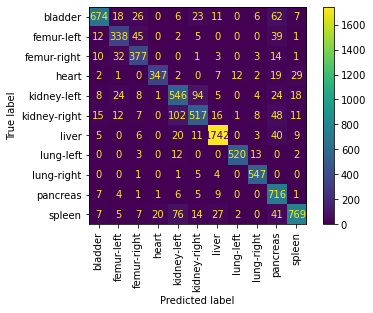

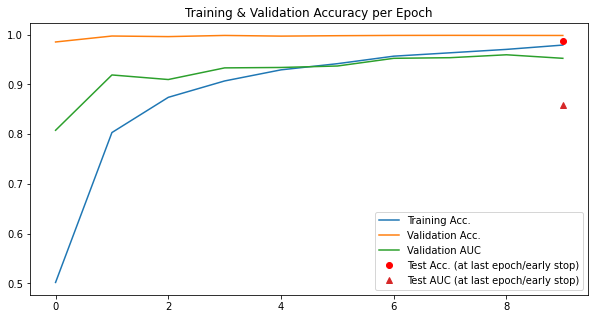

In [83]:
# Runs the classifier again 

clf_condGAN_organcmnist = run_classifier_pipeline("organcmnist", info_flags, condGAN_organcmnist_loader)

### OrganSMNIST

#### Training the Joint VAE

In [84]:
# Retrieves the dataset parameters
n_classes  = len(info_flags["organsmnist"][0]["label"])
n_channels = info_flags["organsmnist"][0]["n_channels"]

# Declares the number of epochs and the model's latent dimensions
latent_dims = 128
epochs = 50

Path trained_models/conditionalGAN/organsmnist/ created.
Epoch 1 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_1.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_1.pth
Epoch: 1, Duration: 11.793068885803223 , Gen Loss: 3.4057621390781923 Disc Loss: 0.22042176781631098
Epoch 2 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_2.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_2.pth
Epoch: 2, Duration: 10.991459369659424 , Gen Loss: 3.470511175125538 Disc Loss: 0.2050572311861101
Epoch 3 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_3.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_3.pth
Epoch: 3, Duration: 12.986687660217285 , Gen Loss: 4.080646128497131 Disc Loss: 0.1707269786249

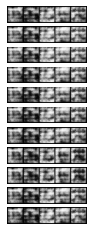

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_5.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_5.pth
Epoch: 5, Duration: 12.009321451187134 , Gen Loss: 3.4858666046449067 Disc Loss: 0.23655335085634863
Epoch 6 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_6.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_6.pth
Epoch: 6, Duration: 12.409870624542236 , Gen Loss: 3.527363925753228 Disc Loss: 0.21720033752353837
Epoch 7 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_7.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_7.pth
Epoch: 7, Duration: 11.612259864807129 , Gen Loss: 3.945778223637016 Disc Loss: 0.2224582579077744
Epoch 8 of 50
New Generator model saved at trained_models/conditio

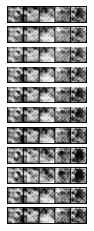

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_10.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_10.pth
Epoch: 10, Duration: 12.492453336715698 , Gen Loss: 4.693626983949067 Disc Loss: 0.17978909682680236
Epoch 11 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_11.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_11.pth
Epoch: 11, Duration: 13.493224143981934 , Gen Loss: 4.561923870157819 Disc Loss: 0.19265940596417683
Epoch 12 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_12.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_12.pth
Epoch: 12, Duration: 11.833746910095215 , Gen Loss: 4.942250829447633 Disc Loss: 0.16717693925416965
Epoch 13 of 50
New Generator model saved at trained_mod

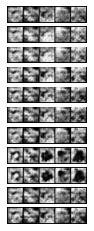

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_14.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_14.pth
Epoch: 14, Duration: 13.627466917037964 , Gen Loss: 4.227684496054519 Disc Loss: 0.20327078382801292
Epoch 15 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_15.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_15.pth
Epoch: 15, Duration: 11.576037406921387 , Gen Loss: 4.03959799811693 Disc Loss: 0.23477369880402618
Epoch 16 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_16.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_16.pth
Epoch: 16, Duration: 12.64175820350647 , Gen Loss: 3.3452183464849354 Disc Loss: 0.24170622421987087
Epoch 17 of 50
New Generator model saved at trained_mode

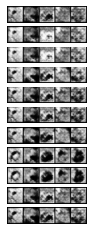

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_19.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_19.pth
Epoch: 19, Duration: 12.471782922744751 , Gen Loss: 2.9839089961441894 Disc Loss: 0.24357813831039277
Epoch 20 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_20.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_20.pth
Epoch: 20, Duration: 12.504392862319946 , Gen Loss: 2.9147462338593972 Disc Loss: 0.24226244101394367
Epoch 21 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_21.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_21.pth
Epoch: 21, Duration: 11.869125604629517 , Gen Loss: 2.918376468346485 Disc Loss: 0.23172495334357066
Epoch 22 of 50
New Generator model saved at trained_m

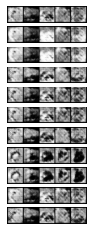

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_23.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_23.pth
Epoch: 23, Duration: 11.70761513710022 , Gen Loss: 2.765245863970588 Disc Loss: 0.2417008300080703
Epoch 24 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_24.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_24.pth
Epoch: 24, Duration: 12.03032898902893 , Gen Loss: 2.7632823708751793 Disc Loss: 0.2305882808296718
Epoch 25 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_25.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_25.pth
Epoch: 25, Duration: 11.103730201721191 , Gen Loss: 2.657972224713056 Disc Loss: 0.2407491369261119
Epoch 26 of 50
New Generator model saved at trained_models/

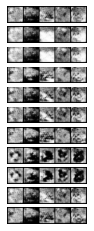

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_28.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_28.pth
Epoch: 28, Duration: 12.245943069458008 , Gen Loss: 2.5819373767037304 Disc Loss: 0.2436871959626076
Epoch 29 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_29.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_29.pth
Epoch: 29, Duration: 11.40326476097107 , Gen Loss: 2.5537893987625537 Disc Loss: 0.2385490515994889
Epoch 30 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_30.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_30.pth
Epoch: 30, Duration: 11.834633827209473 , Gen Loss: 2.592296224892396 Disc Loss: 0.23105093957361908
Epoch 31 of 50
New Generator model saved at trained_mode

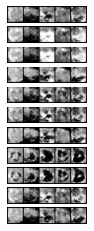

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_33.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_33.pth
Epoch: 33, Duration: 11.743631839752197 , Gen Loss: 2.451516824336442 Disc Loss: 0.243074164807882
Epoch 34 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_34.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_34.pth
Epoch: 34, Duration: 11.326722145080566 , Gen Loss: 2.530683117378049 Disc Loss: 0.2364073568642396
Epoch 35 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_35.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_35.pth
Epoch: 35, Duration: 11.139571905136108 , Gen Loss: 2.48221843615495 Disc Loss: 0.23912894688172526
Epoch 36 of 50
New Generator model saved at trained_models/

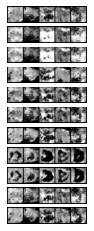

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_37.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_37.pth
Epoch: 37, Duration: 11.757992029190063 , Gen Loss: 2.4835046404232424 Disc Loss: 0.24131686020444762
Epoch 38 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_38.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_38.pth
Epoch: 38, Duration: 11.174814939498901 , Gen Loss: 2.487597235921808 Disc Loss: 0.24192544288580523
Epoch 39 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_39.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_39.pth
Epoch: 39, Duration: 10.961141347885132 , Gen Loss: 2.4949616660688667 Disc Loss: 0.24536663476842718
Epoch 40 of 50
New Generator model saved at trained_m

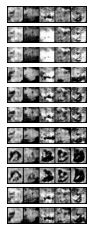

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_42.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_42.pth
Epoch: 42, Duration: 11.418896913528442 , Gen Loss: 2.512190638450502 Disc Loss: 0.236256511584245
Epoch 43 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_43.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_43.pth
Epoch: 43, Duration: 10.958906888961792 , Gen Loss: 2.5021268606527975 Disc Loss: 0.23959058983254125
Epoch 44 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_44.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_44.pth
Epoch: 44, Duration: 10.988090991973877 , Gen Loss: 2.513673276093974 Disc Loss: 0.24252717772036406
Epoch 45 of 50
New Generator model saved at trained_mode

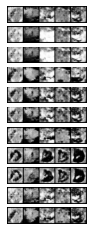

New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_46.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_46.pth
Epoch: 46, Duration: 12.559178352355957 , Gen Loss: 2.492796695659971 Disc Loss: 0.2442447963369799
Epoch 47 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_47.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_47.pth
Epoch: 47, Duration: 11.435361623764038 , Gen Loss: 2.4717416158536585 Disc Loss: 0.24565512001770984
Epoch 48 of 50
New Generator model saved at trained_models/conditionalGAN/organsmnist/gen_models/gen_model_48.pth
New Discriminator model saved at trained_models/conditionalGAN/organsmnist/disc_models/disc_model_48.pth
Epoch: 48, Duration: 11.173486232757568 , Gen Loss: 2.448087786944046 Disc Loss: 0.2434172576948081
Epoch 49 of 50
New Generator model saved at trained_mode

In [85]:
# Retrieves the data loader
train_loader = organsmnist[3]
val_loader = organsmnist[5]
test_loader = organsmnist[4]

# Runs the cond GAN
run_GAN_pipeline(
    train_loader, val_loader, test_loader, 
    n_channels, latent_dims, n_classes,
    epochs=epochs, name_dataset="organsmnist"
)

#### Generating an upgraded dataset

In [86]:
# Creates a new data loader with the augmented data added to the already existing data
# 10% generated data was added, with weights corresponding to the rarity of the class 

condGAN_organsmnist_loader = generate_augmented_dataset_condGAN(
    n_channels, n_classes, latent_dims, 
    f"./trained_models/conditionalGAN/organsmnist/gen_models/gen_model_50.pth",
    organsmnist[0], 128, organsmnist[4], organsmnist[5], len(organsmnist[0])//10
)

#### Retraining the classifier and assessing changes in performance

{
  "python_class": "OrganSMNIST",
  "description": "The OrganSMNIST is based on 3D computed tomography (CT) images from Liver Tumor Segmentation Benchmark (LiTS). It is renamed from OrganMNIST_Sagittal (in MedMNIST v1) for simplicity. We use bounding-box annotations of 11 body organs from another study to obtain the organ labels. Hounsfield-Unit (HU) of the 3D images are transformed into gray-scale with an abdominal window. We crop 2D images from the center slices of the 3D bounding boxes in sagittal views (planes). The images are resized into 1\u00d728\u00d728 to perform multi-class classification of 11 body organs. 115 and 16 CT scans from the source training set are used as training and validation set, respectively. The 70 CT scans from the source test set are treated as the test set.",
  "url": "https://zenodo.org/record/5208230/files/organsmnist.npz?download=1",
  "MD5": "e5c39f1af030238290b9557d9503af9d",
  "task": "multi-class",
  "label": {
    "0": "bladder",
    "1": "femur-

100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 65.00it/s]


train -- accuracy: 0.41
val -- accuracy: 0.96,  AUC: 0.64
Epoch 1



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 66.88it/s]


train -- accuracy: 0.65
val -- accuracy: 0.98,  AUC: 0.71
Epoch 2



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 66.50it/s]


train -- accuracy: 0.73
val -- accuracy: 0.99,  AUC: 0.8
Epoch 3



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 66.21it/s]


train -- accuracy: 0.77
val -- accuracy: 0.98,  AUC: 0.75
Epoch 4



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 65.10it/s]


train -- accuracy: 0.8
val -- accuracy: 0.99,  AUC: 0.84
Epoch 5



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 66.58it/s]


train -- accuracy: 0.81
val -- accuracy: 0.99,  AUC: 0.81
Epoch 6



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 67.10it/s]


train -- accuracy: 0.85
val -- accuracy: 0.99,  AUC: 0.83
Epoch 7



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 67.01it/s]


train -- accuracy: 0.87
val -- accuracy: 0.99,  AUC: 0.85
Epoch 8



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 67.21it/s]


train -- accuracy: 0.87
val -- accuracy: 0.99,  AUC: 0.84
Epoch 9



100%|█████████████████████████████████████████| 120/120 [00:01<00:00, 67.08it/s]


train -- accuracy: 0.89
val -- accuracy: 0.99,  AUC: 0.83
test -- accuracy: 0.96,  AUC: 0.72


<Figure size 720x720 with 0 Axes>

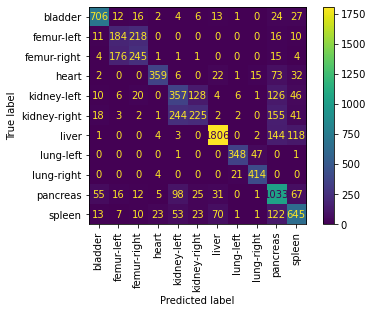

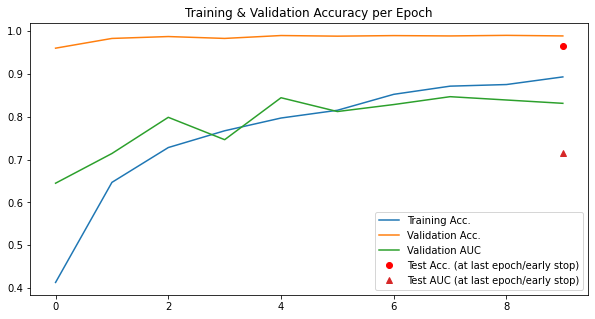

In [87]:
# Runs the classifier again 

clf_condGAN_organsmnist = run_classifier_pipeline("organsmnist", info_flags, condGAN_organsmnist_loader)